# YOLO v8 on Lung Nodules

## Prepare environement

In [1]:
!pip install opencv-python ultralytics==8.0.196

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 631.1/631.1 kB 9.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [2]:
!nvidia-smi

Thu May 23 08:30:06 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [4]:
from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 29.9/201.2 GB disk)


In [5]:
from ultralytics import YOLO

from IPython.display import display, Image

In [6]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ICJgXvbLqfzcXVEZZagM")
project = rf.workspace("project-yiijg").project("detection-9l8ql")
version = project.version(1)
dataset = version.download("yolov8")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.9/74.9 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 32.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.7
    Uninstalling idna-3.7:
      Successfully uninstalled idna-3.7
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully unins

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Detection-1 in yolov8:: 100%|██████████| 887/887 [00:00<00:00, 8251.83it/s]


In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
import zipfile
import io

zip_filename = "/content/drive/Shareddrives/IA DL_project/ML IA/nb_Karim/50percentDATA.zip"

# Extract the contents of the zip file
with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
    zip_ref.extractall('/content/datasets')

## Fine-tune yolov8

In [13]:
import torch
torch.cuda.empty_cache()


!yolo task=detect mode=train model=yolov8s.pt data=/content/datasets/50percentDATA/data.yaml epochs=20 imgsz=512 plots=True batch=4 optimizer=SGD lr0=0.001 cos_lr=True

New https://pypi.org/project/ultralytics/8.2.19 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/50percentDATA/data.yaml, epochs=20, patience=50, batch=4, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augmen

## Evaluate

In [14]:
!ls /content/runs/detect/train

ls: cannot access '/content/runs/detect/train': No such file or directory


/content


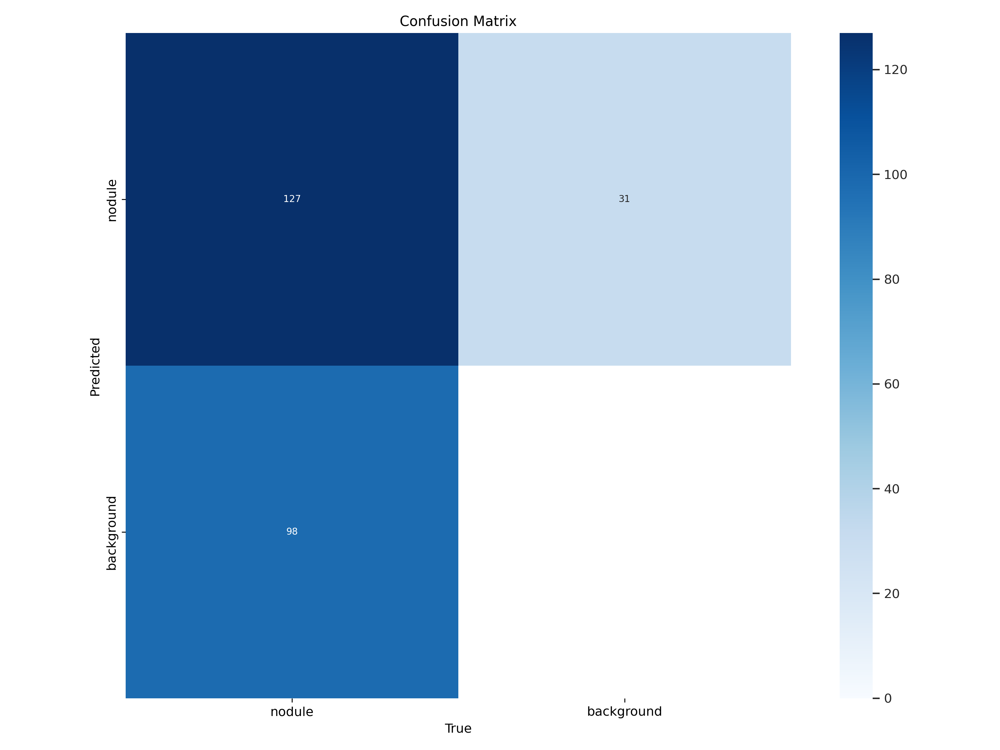

In [18]:
%cd {HOME}
Image(filename=f'/content/datasets/runs/detect/train3/confusion_matrix.png', width=600)

/content


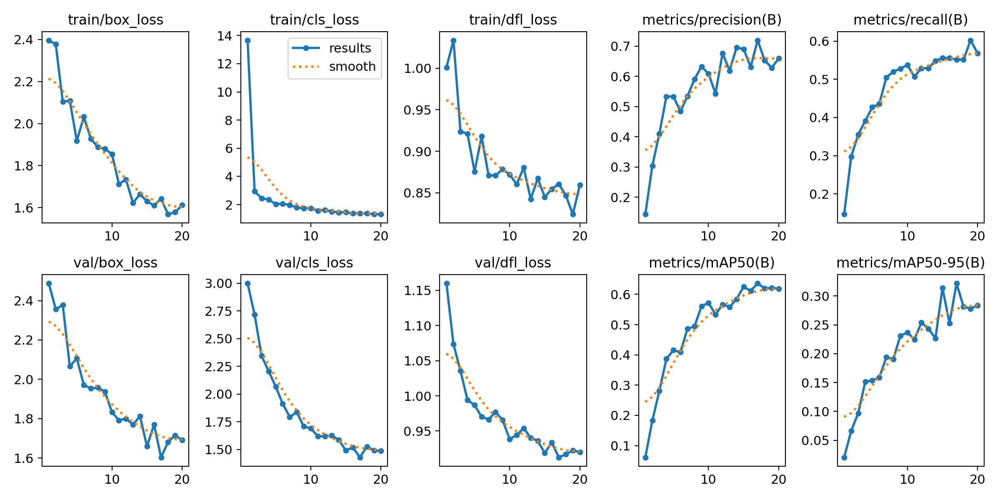

In [22]:
%cd {HOME}
Image(filename=f'/content/datasets/runs/detect/train3/results.png', width=600)

/content


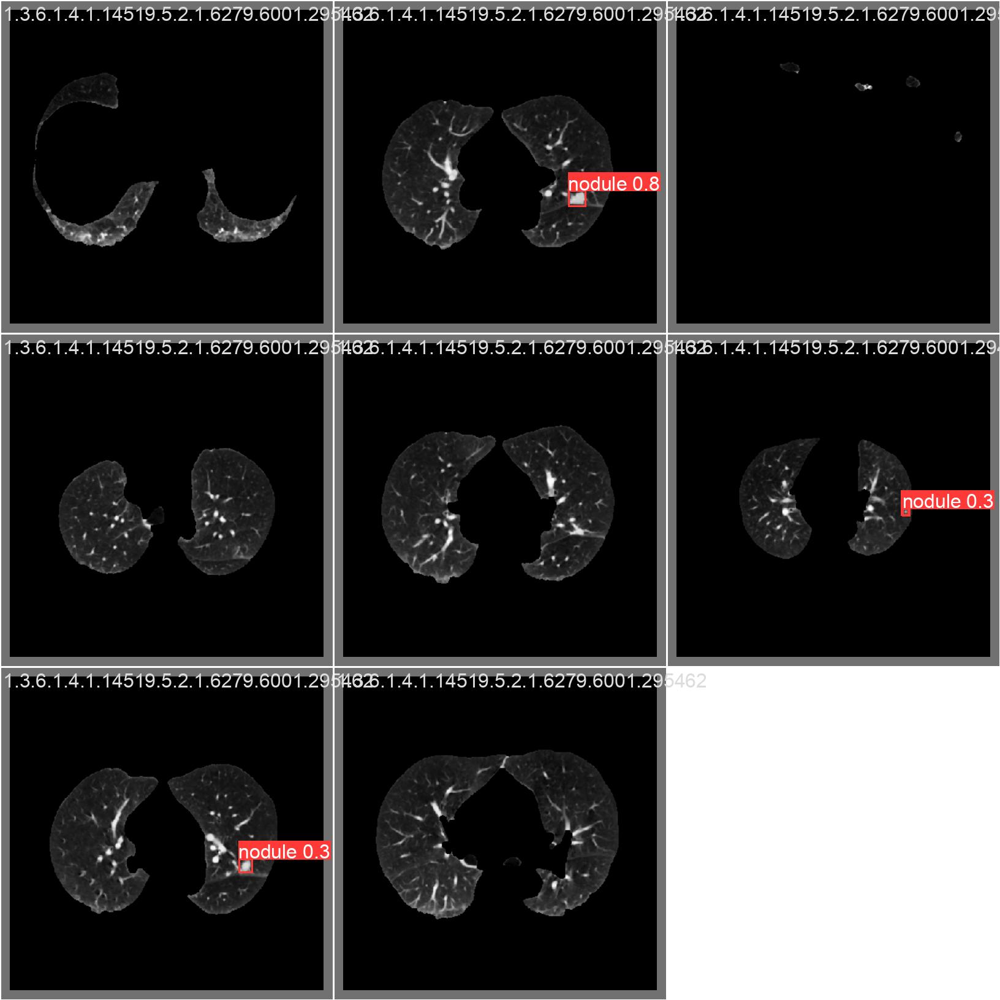

In [24]:
%cd {HOME}
Image(filename=f'/content/datasets/runs/detect/train3/val_batch2_pred.jpg', width=900)

## Try on test

In [29]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/datasets/runs/detect/train3/weights/best.pt data=/content/datasets/50percentDATA/data.yaml

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/50percentDATA/valid/labels.cache... 450 images, 225 backgrounds, 0 corrupt: 100% 450/450 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  97% 28/29 [00:05<00:00,  8.13it/s]/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 29/29 [00:05<00:00,  5.49it/s]
                   all        450        225      0.743      0.551      0.64


WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.733642690503782454656013446707_slice100.png: 512x512 1 nodule, 11.1ms
Speed: 3.0ms preprocess, 11.1ms inference, 753.0ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 85.5945, 212.6259,  95.3264, 222.4204]], device='cuda:0')


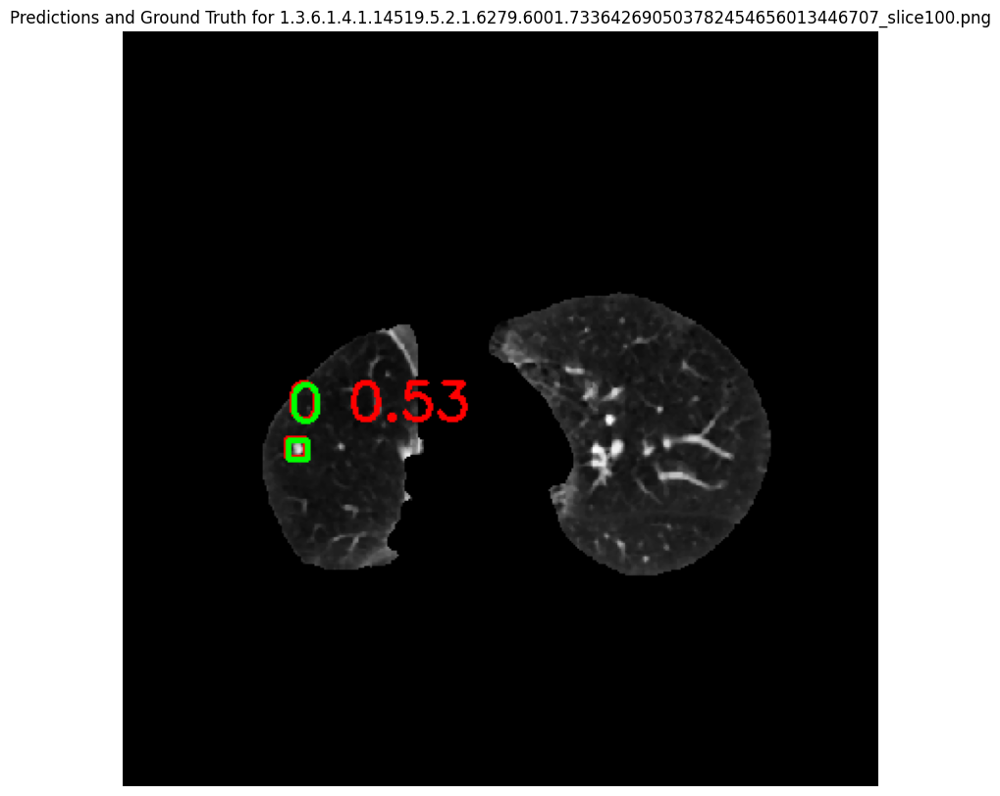


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.141345499716190654505508410197_slice124.png: 512x512 (no detections), 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


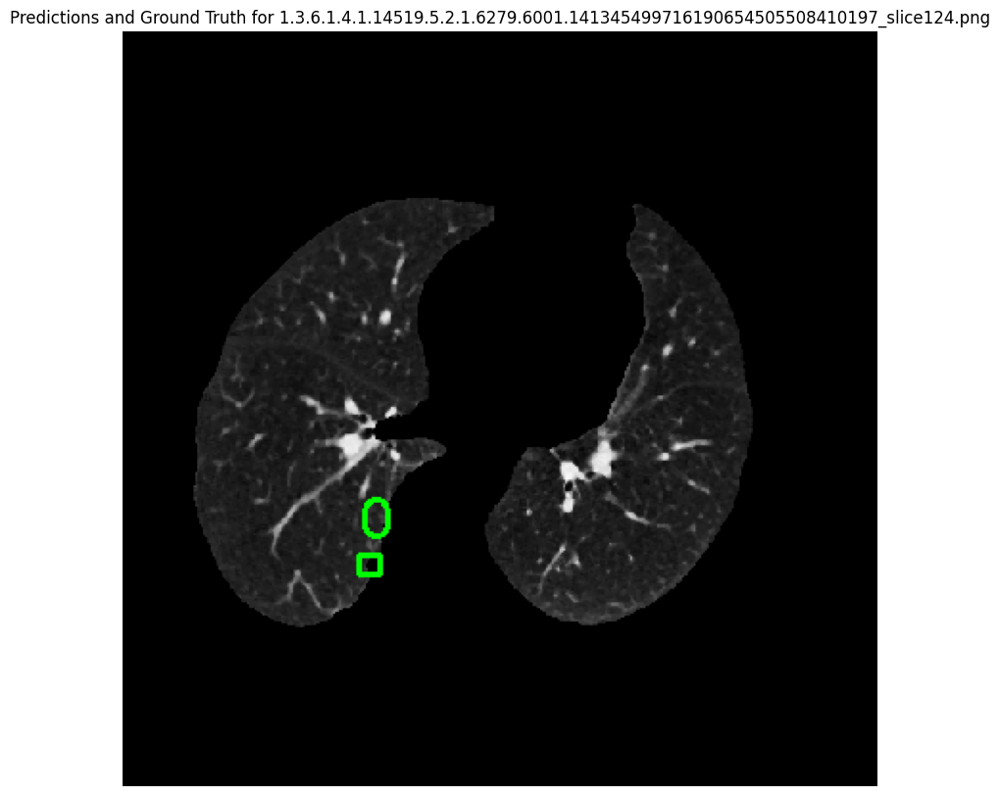


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.138813197521718693188313387015_slice48.png: 512x512 1 nodule, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[237.5987, 248.7373, 258.8204, 269.3727]], device='cuda:0')


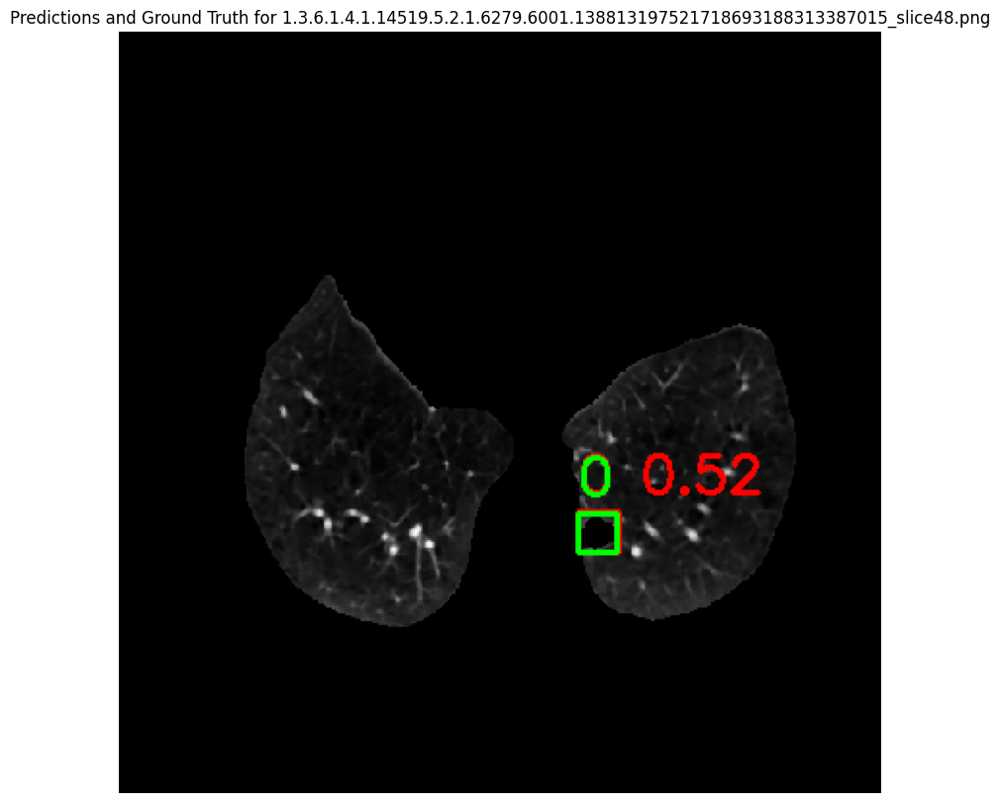


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.312127933722985204808706697221_slice55.png: 512x512 1 nodule, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 65.3158, 237.8810,  76.4523, 250.1736]], device='cuda:0')


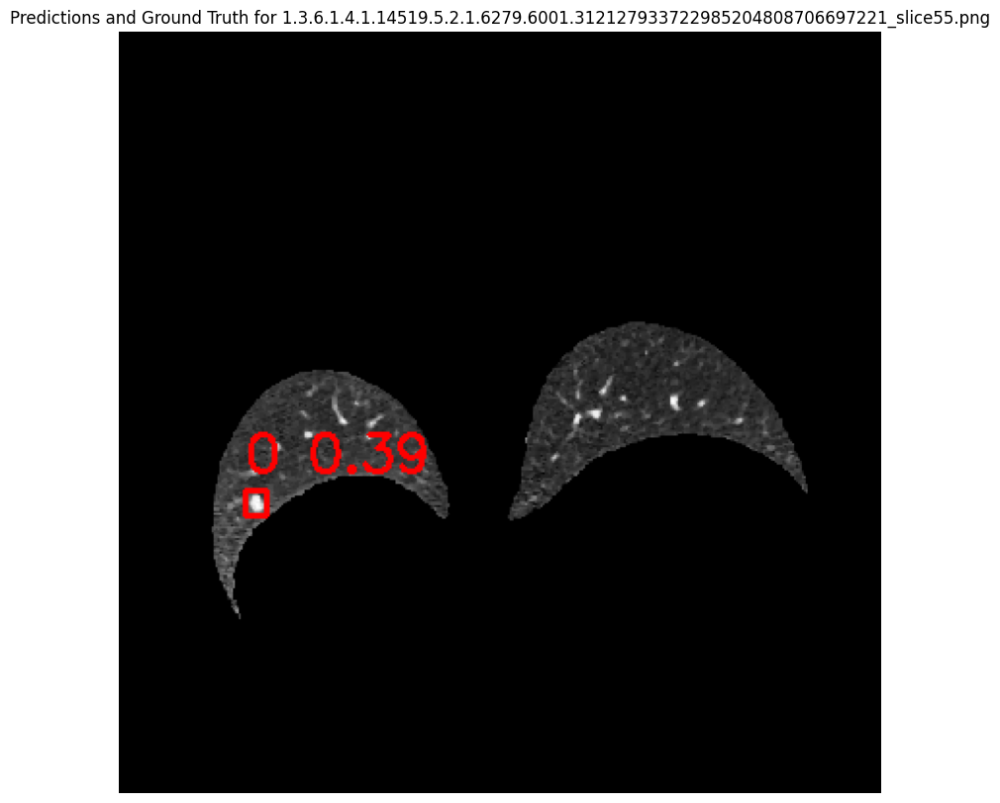


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.112767175295249119452142211437_slice86.png: 512x512 (no detections), 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 512)


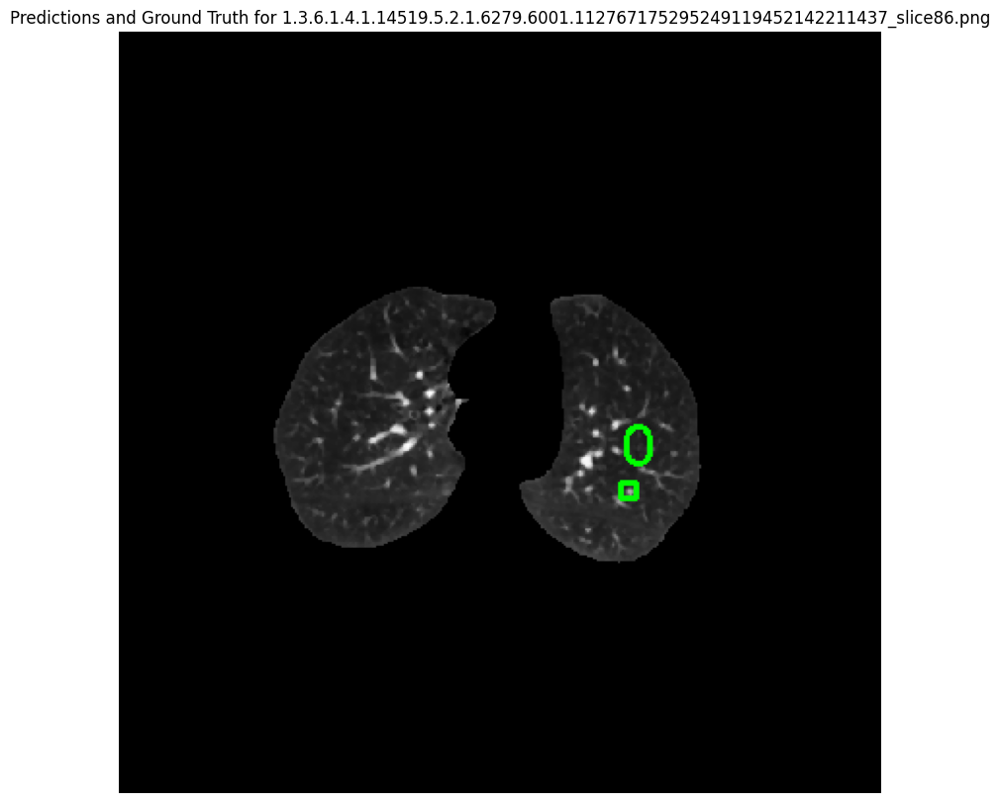


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.112767175295249119452142211437_slice82.png: 512x512 1 nodule, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 96.3960, 174.4107, 106.5367, 183.8982]], device='cuda:0')


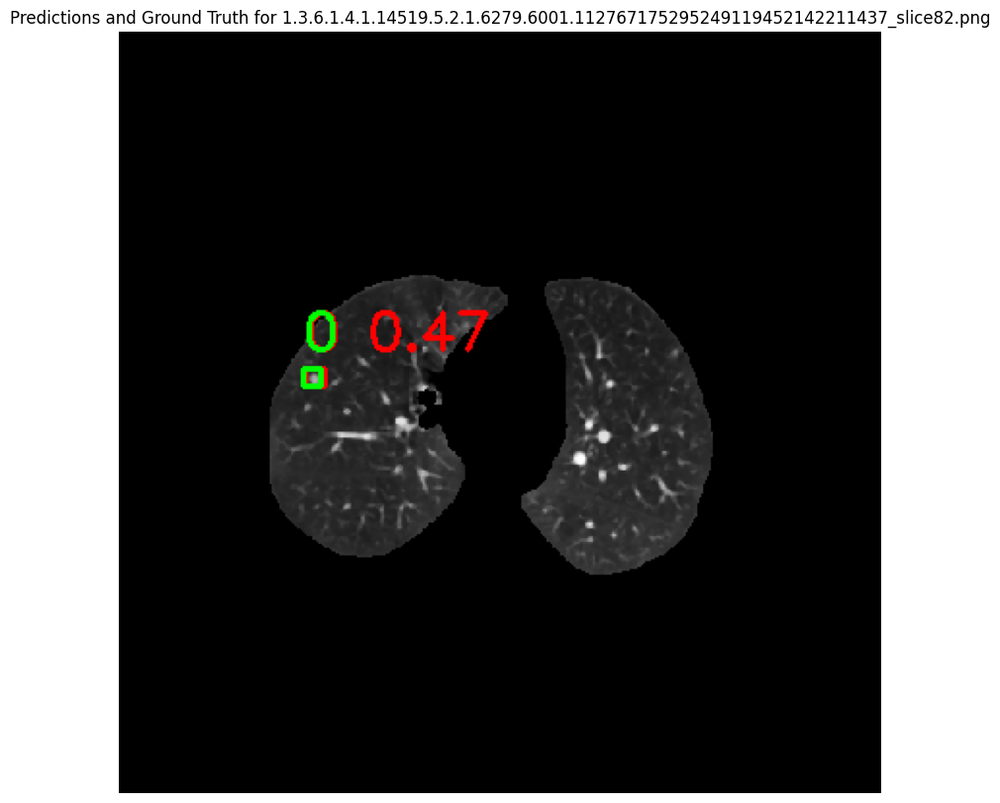


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.222052723822248889877676736332_slice348.png: 512x512 (no detections), 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


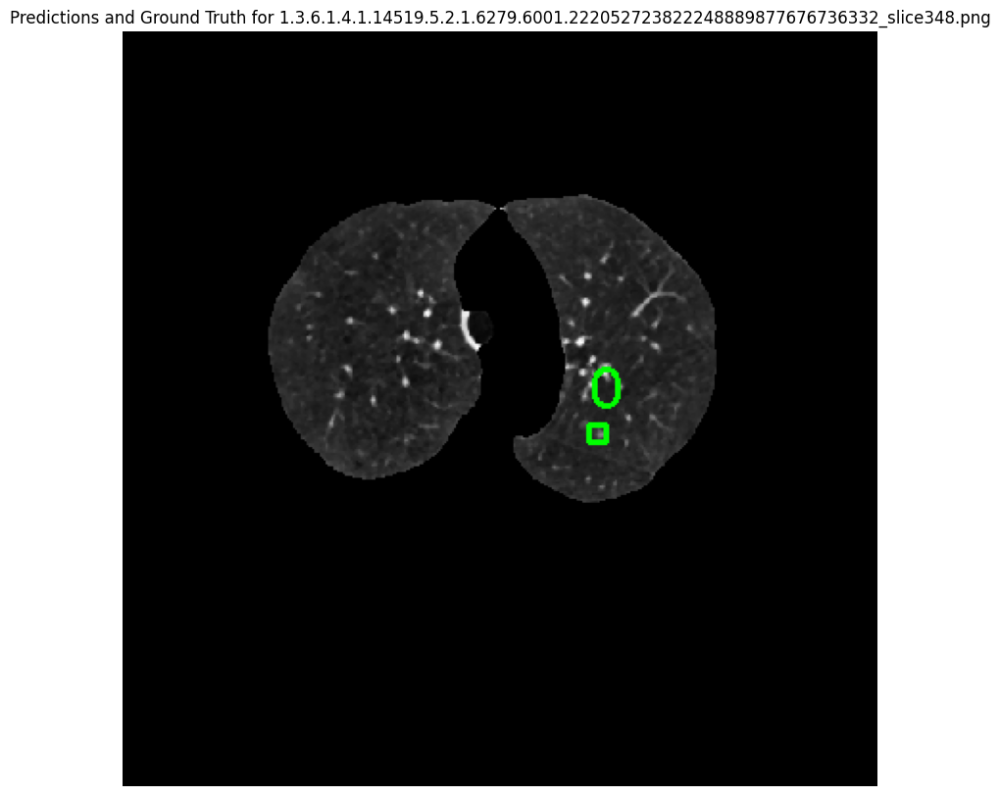


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.182192086929819295877506541021_slice263.png: 512x512 1 nodule, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[240.5616, 292.6421, 251.5511, 303.1310]], device='cuda:0')


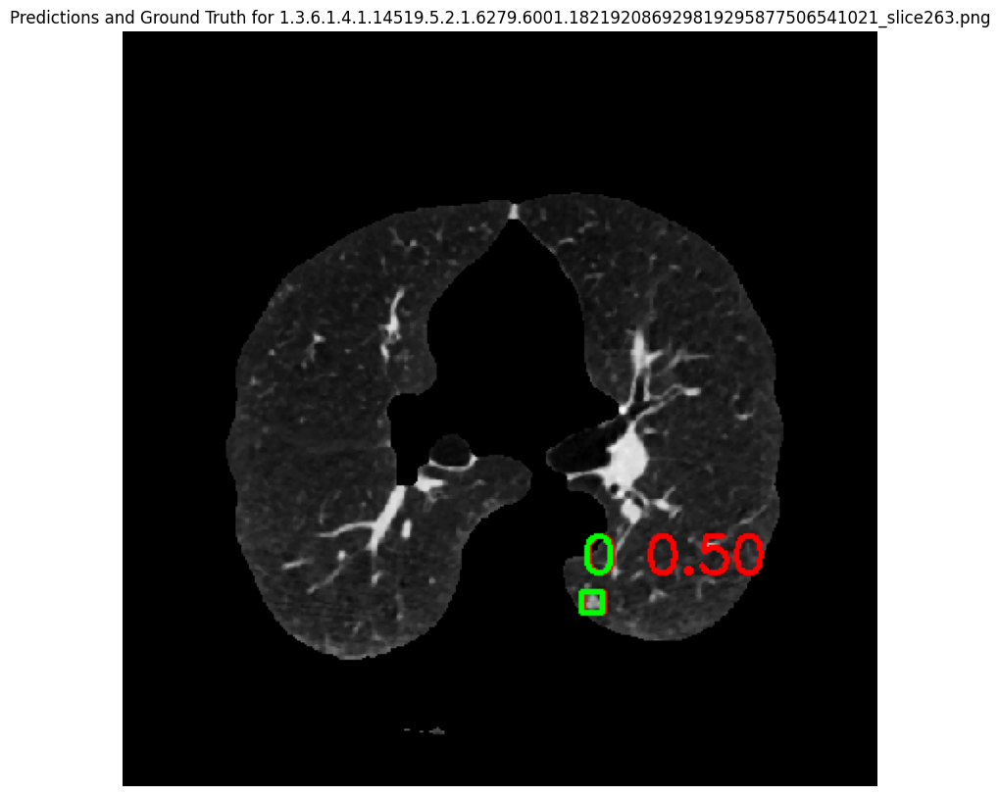


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.195557219224169985110295082004_slice193.png: 512x512 1 nodule, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[129.4340, 151.2739, 138.8851, 161.4307]], device='cuda:0')


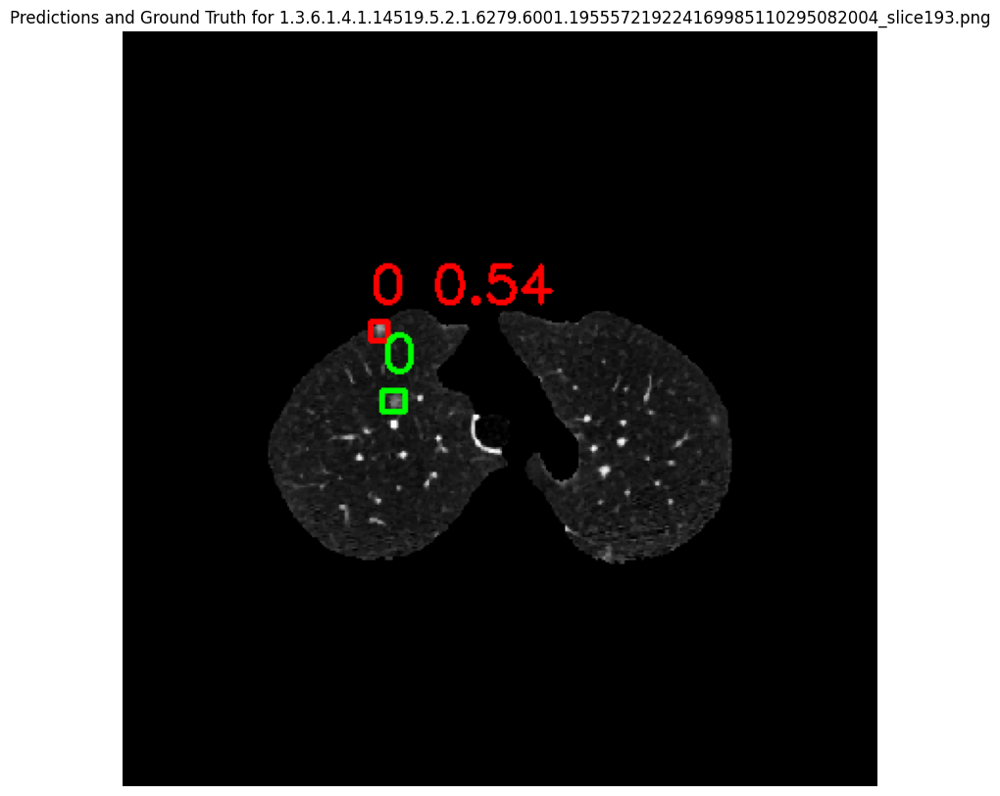


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.220596530836092324070084384692_slice245.png: 512x512 (no detections), 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 512)


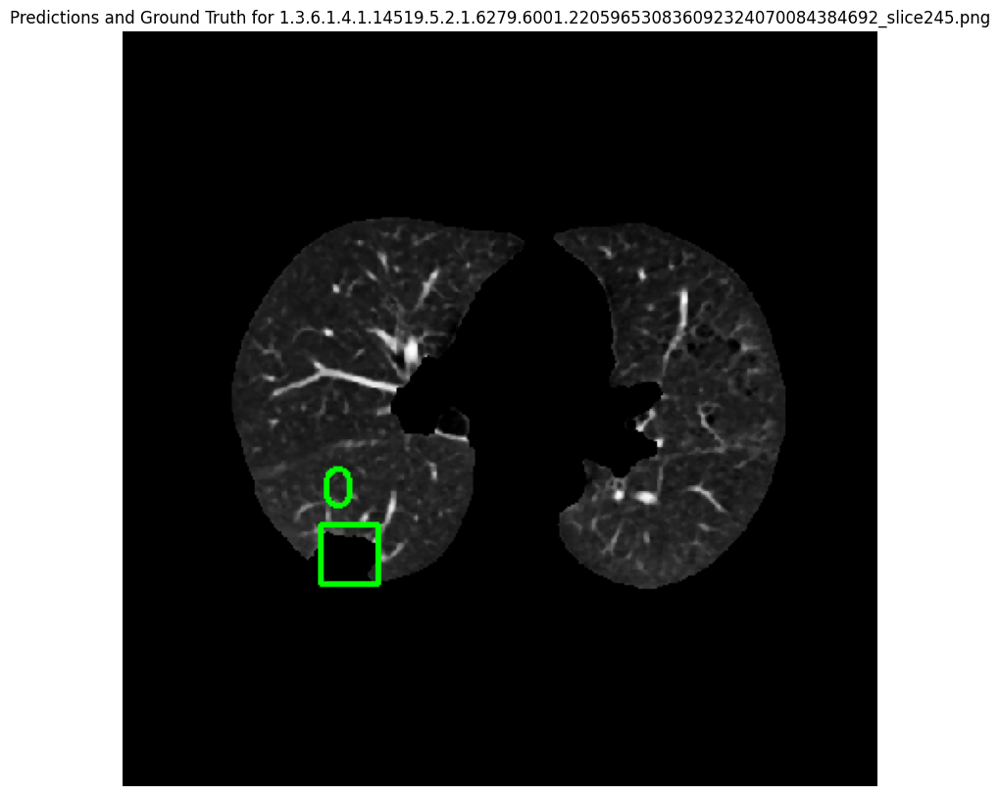


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.227968442353440630355230778531_slice219.png: 512x512 1 nodule, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[109.5504, 244.7959, 130.3778, 265.6957]], device='cuda:0')


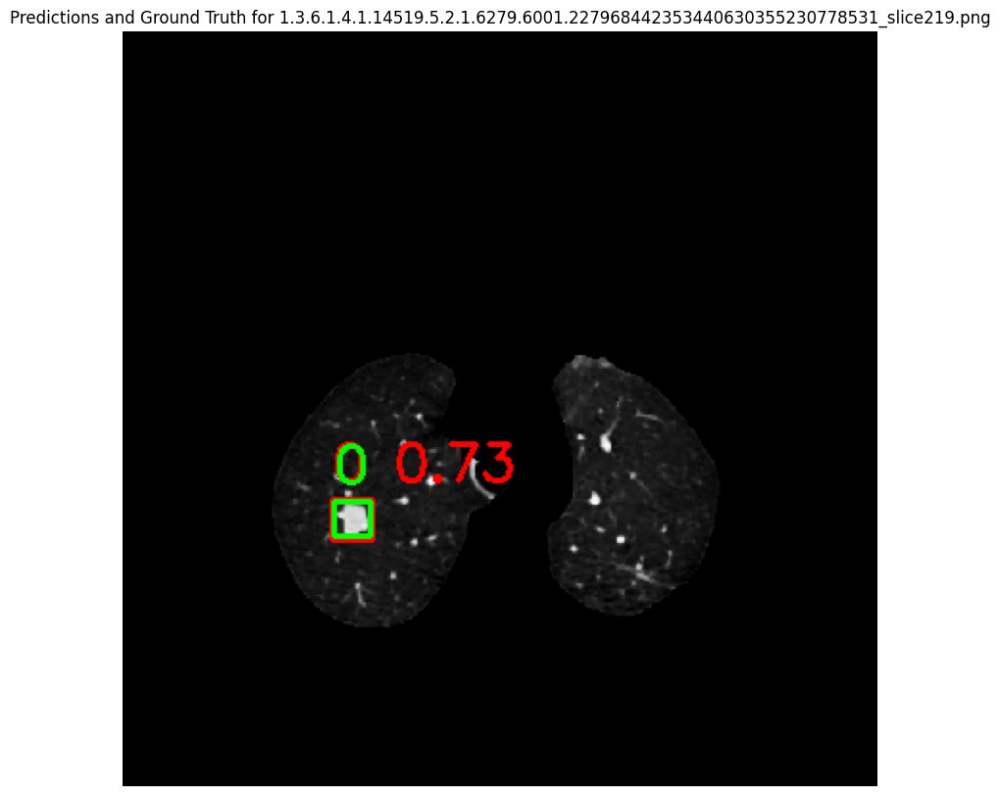


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.124822907934319930841506266464_slice256.png: 512x512 1 nodule, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[132.6926, 326.5371, 143.1262, 337.7419]], device='cuda:0')


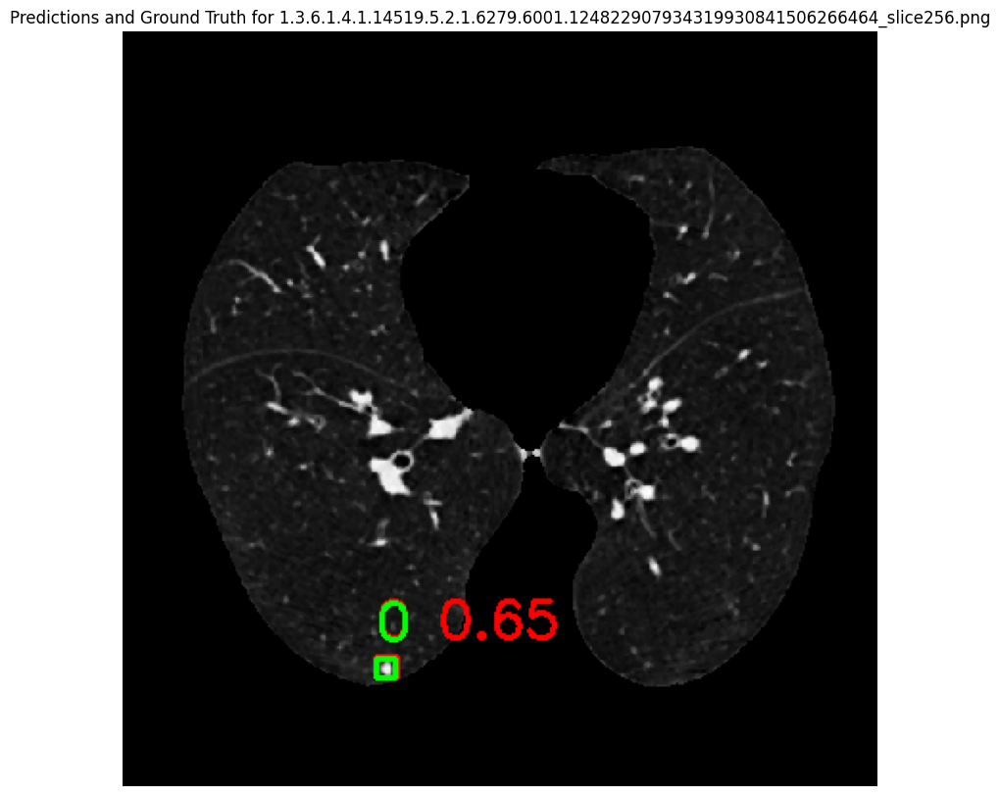


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.312127933722985204808706697221_slice131.png: 512x512 1 nodule, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[213.4174, 161.0654, 227.3992, 175.6637]], device='cuda:0')


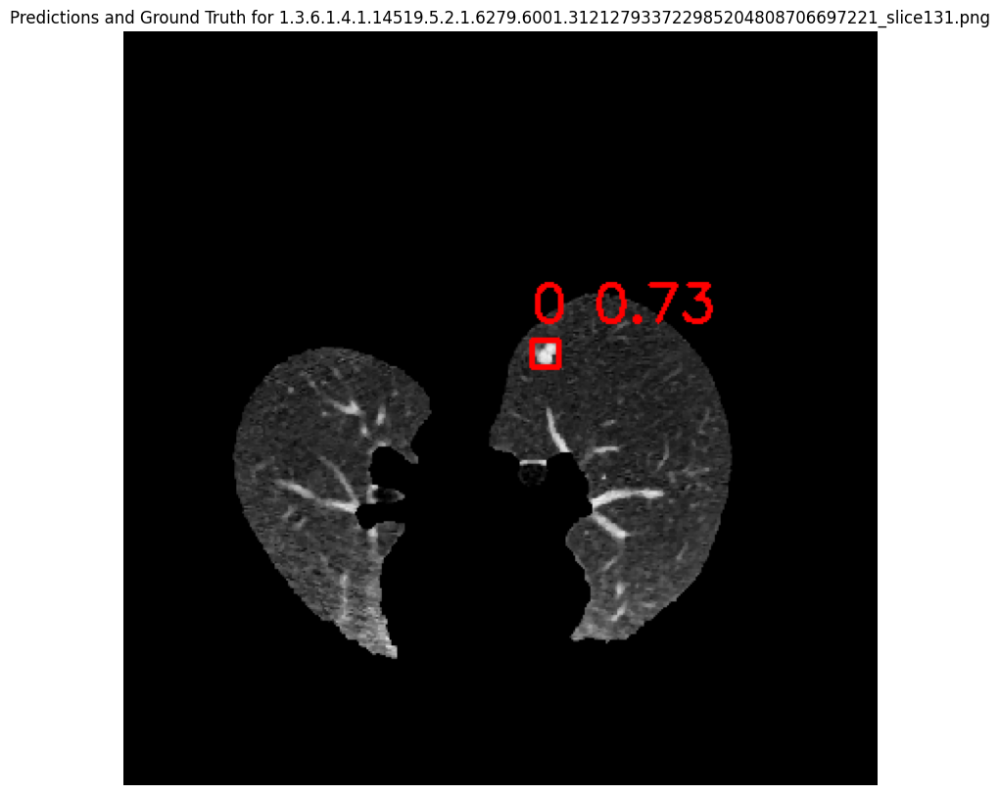


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.170706757615202213033480003264_slice75.png: 512x512 1 nodule, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[272.6523, 256.6415, 293.8502, 282.2132]], device='cuda:0')


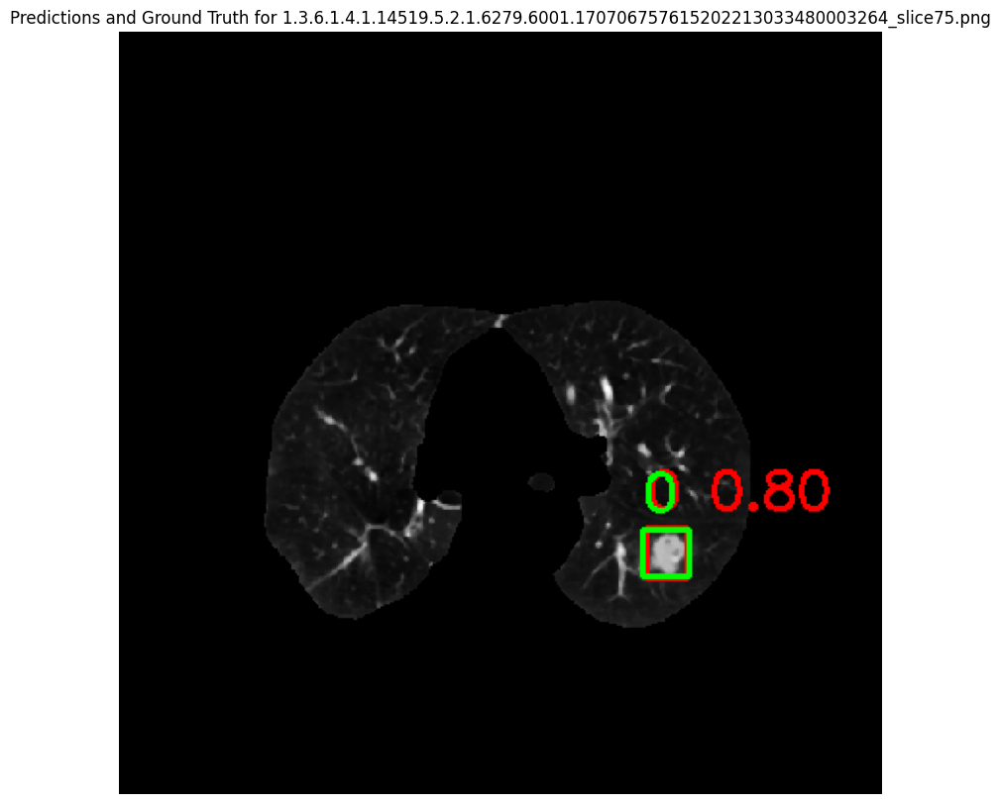


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.765459236550358748053283544075_slice154.png: 512x512 2 nodules, 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[285.1913, 199.7937, 296.4021, 210.1975]], device='cuda:0')
box.xyxy: tensor([[283.3993, 199.3427, 294.7369, 210.7738]], device='cuda:0')


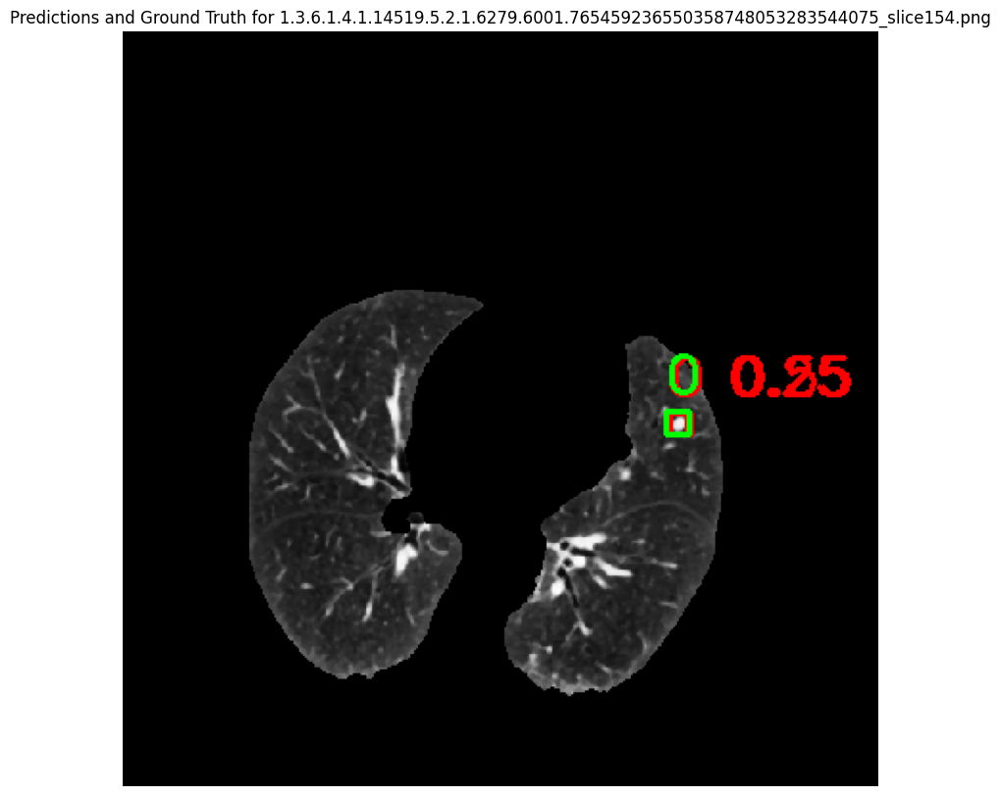


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.603126300703296693942875967838_slice51.png: 512x512 2 nodules, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 88.6336, 238.0702,  97.4405, 246.8101]], device='cuda:0')
box.xyxy: tensor([[280.5496, 290.3194, 288.8854, 298.4563]], device='cuda:0')


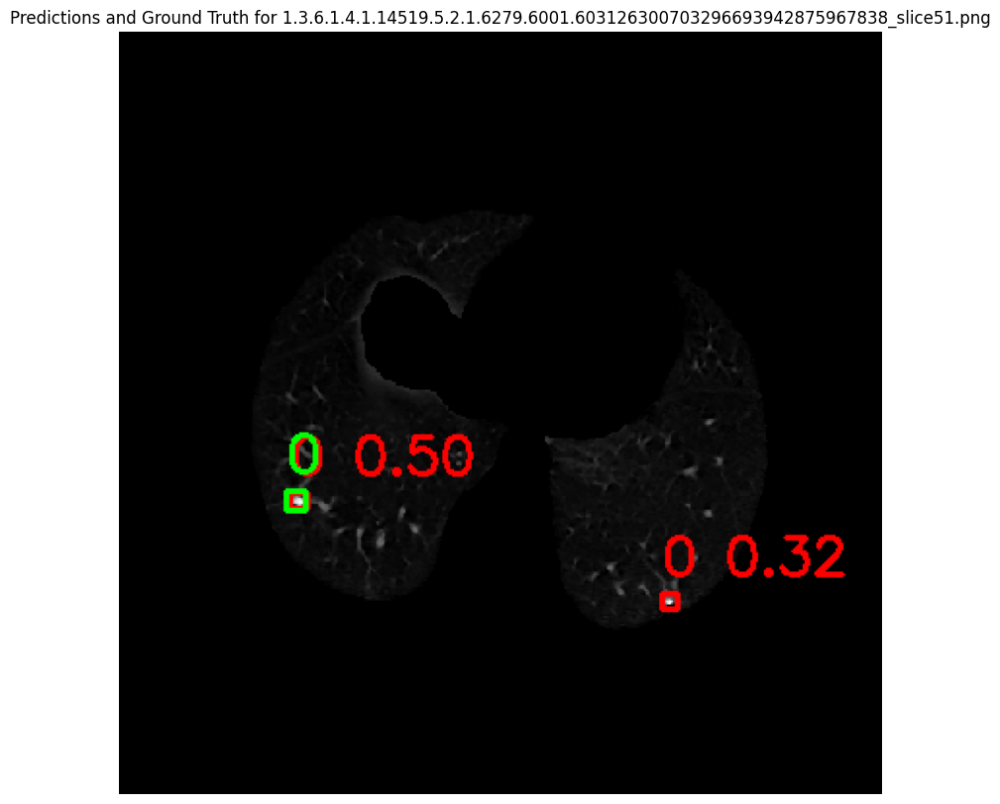


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.170706757615202213033480003264_slice83.png: 512x512 2 nodules, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[231.3457, 145.9166, 243.7332, 157.7952]], device='cuda:0')
box.xyxy: tensor([[163.7351, 161.2745, 177.3576, 175.1790]], device='cuda:0')


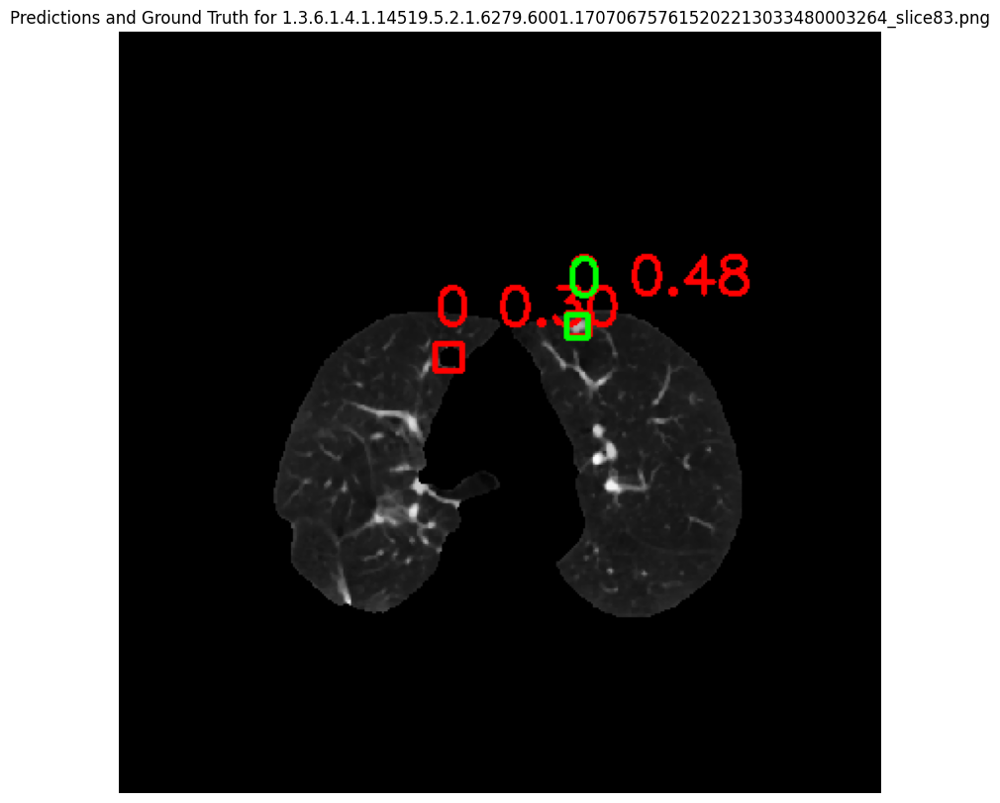


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.712472578497712558367294720243_slice64.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 63.5230, 251.7187,  77.3650, 266.9550]], device='cuda:0')


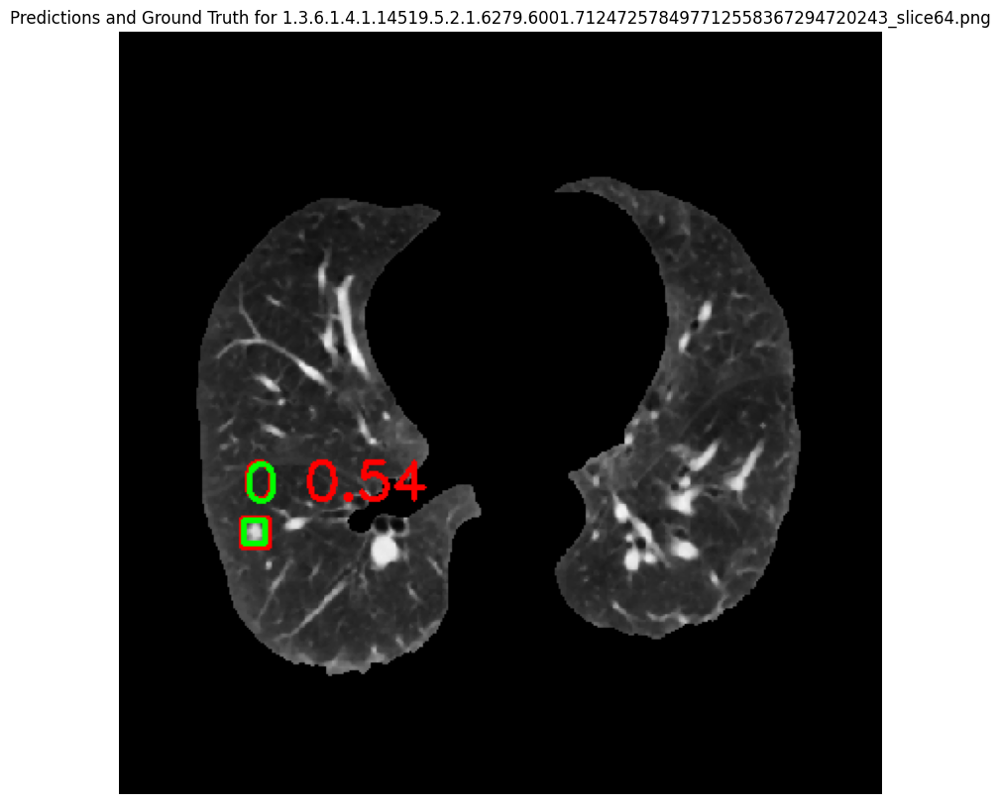


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.114914167428485563471327801935_slice404.png: 512x512 1 nodule, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[154.5950, 178.5261, 165.8225, 190.3184]], device='cuda:0')


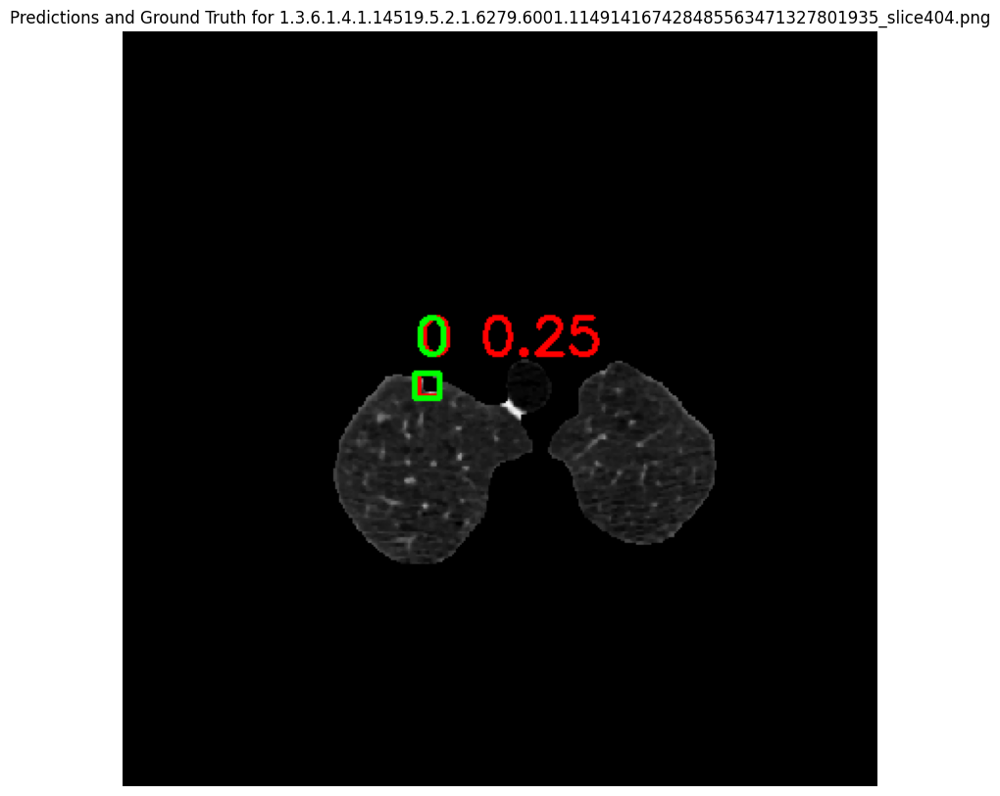


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.188619674701053082195613114069_slice181.png: 512x512 1 nodule, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 80.1309, 187.5826,  95.2777, 203.5005]], device='cuda:0')


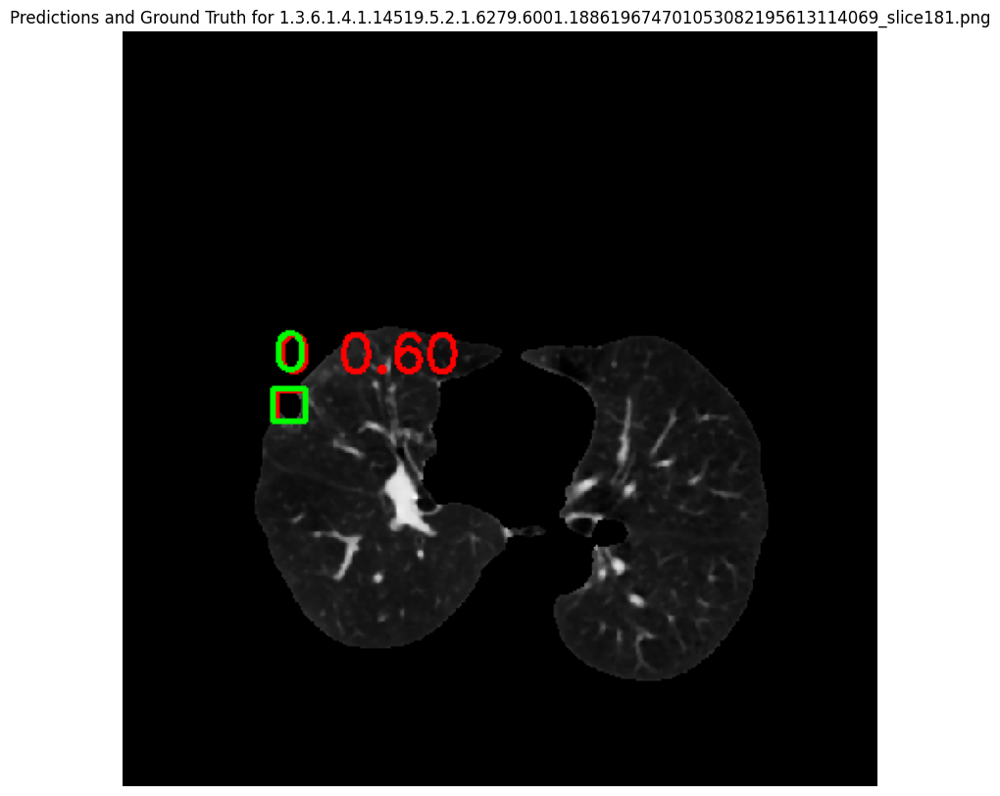


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.195557219224169985110295082004_slice178.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[280.4766, 208.5637, 295.7393, 223.0617]], device='cuda:0')


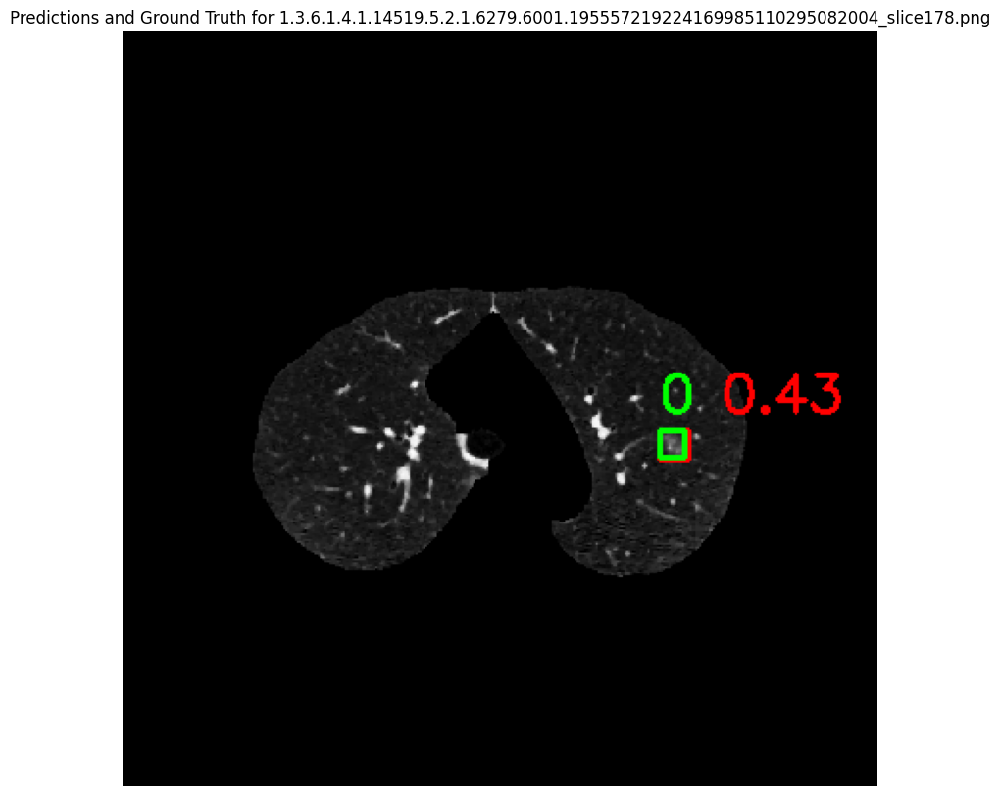


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.392861216720727557882279374324_slice329.png: 512x512 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


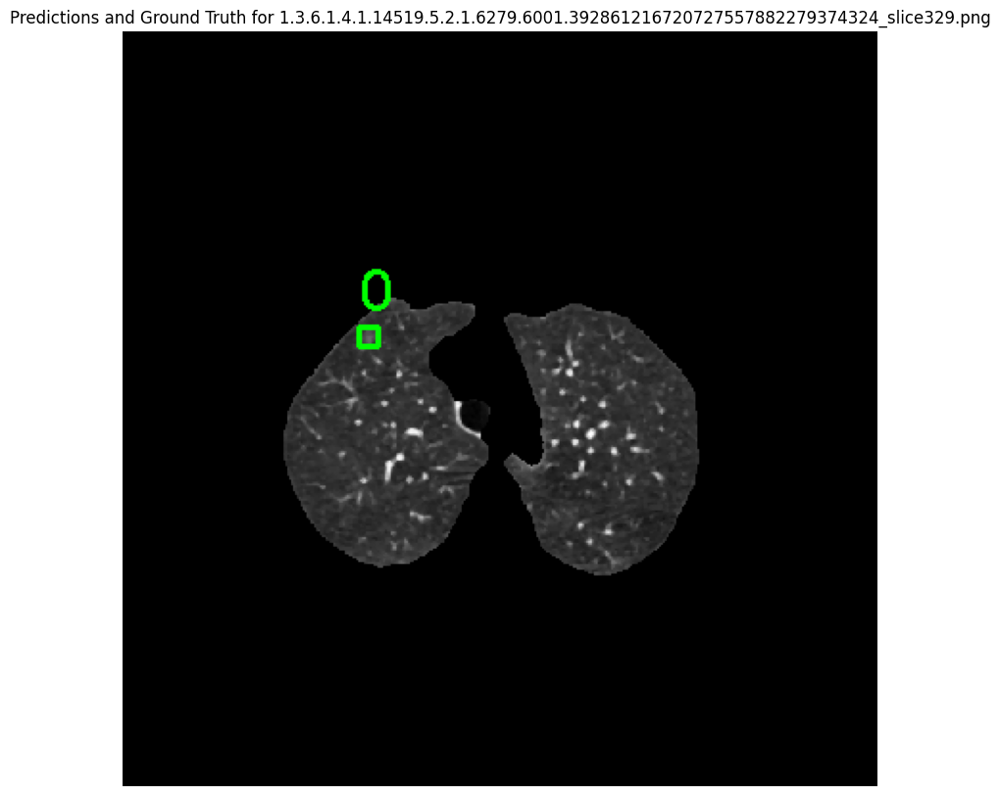


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.603126300703296693942875967838_slice65.png: 512x512 (no detections), 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


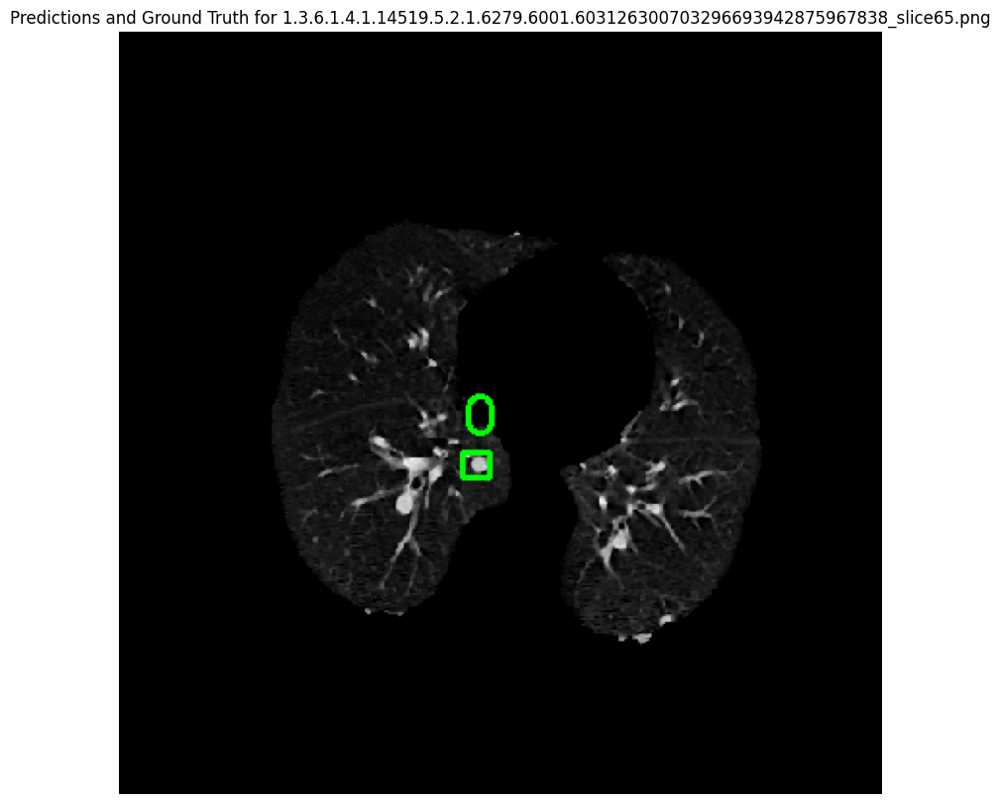


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.121108220866971173712229588402_slice186.png: 512x512 2 nodules, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 69.0163, 129.3842,  78.9320, 140.0308]], device='cuda:0')
box.xyxy: tensor([[ 67.6562, 130.0021,  77.5244, 139.6873]], device='cuda:0')


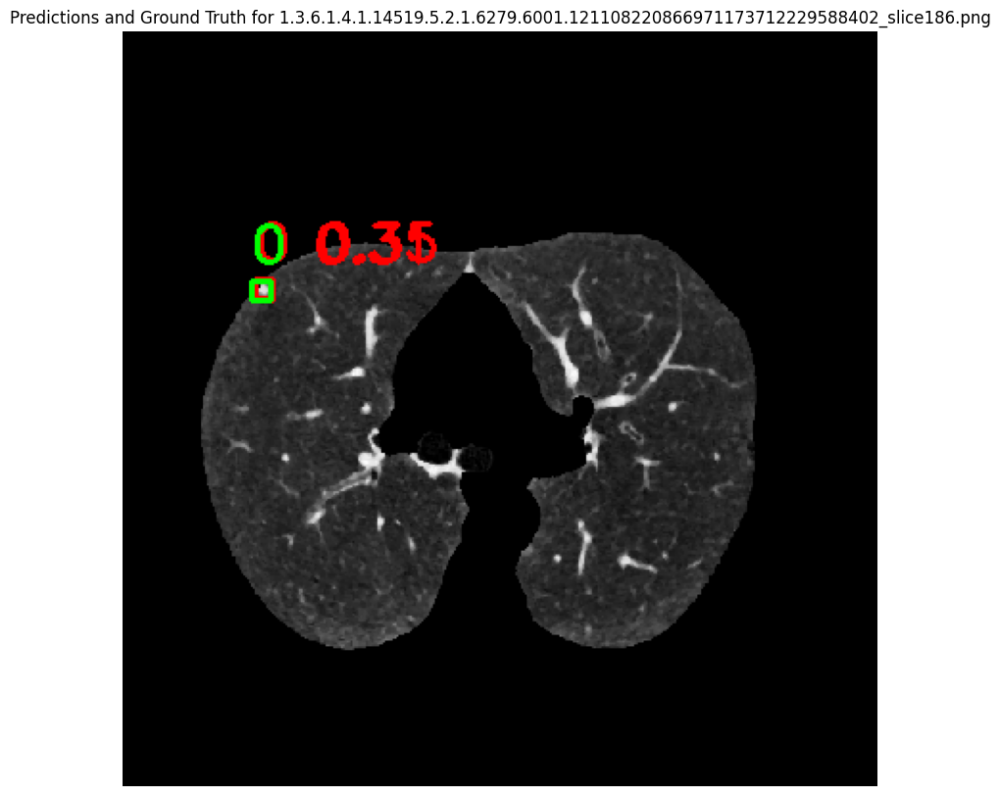


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.167661207884826429102690781600_slice169.png: 512x512 1 nodule, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[292.9857, 213.1153, 313.0206, 231.3725]], device='cuda:0')


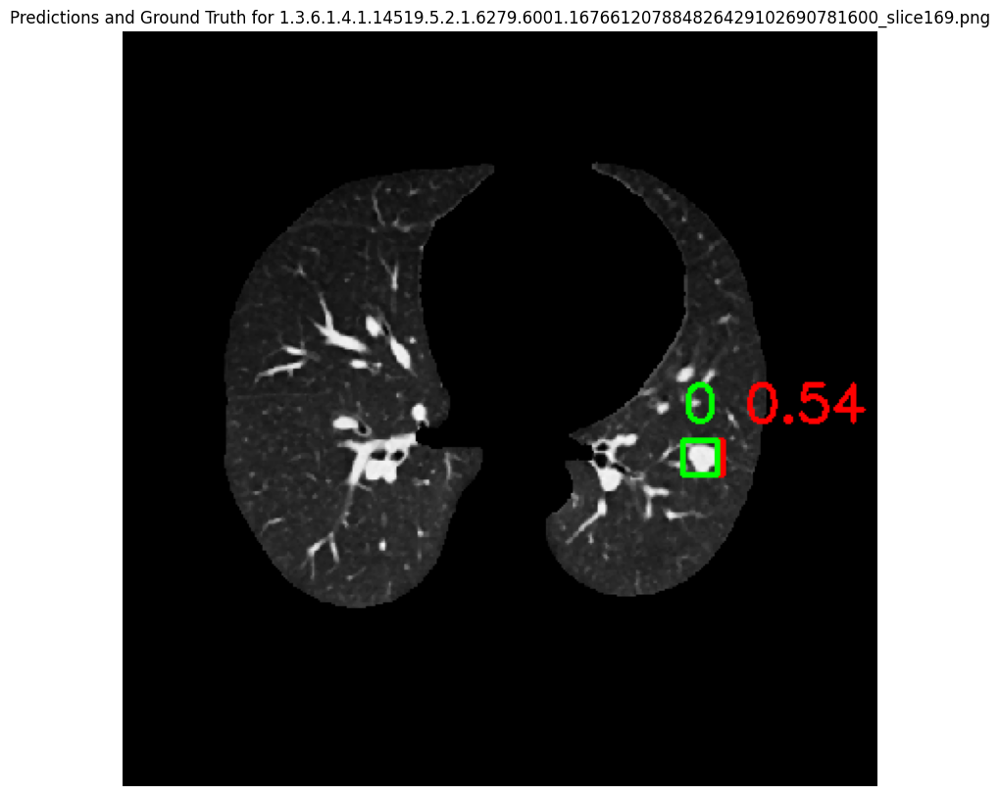


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.215104063467523905369326175410_slice60.png: 512x512 1 nodule, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 39.7669, 213.6353,  50.6130, 224.8621]], device='cuda:0')


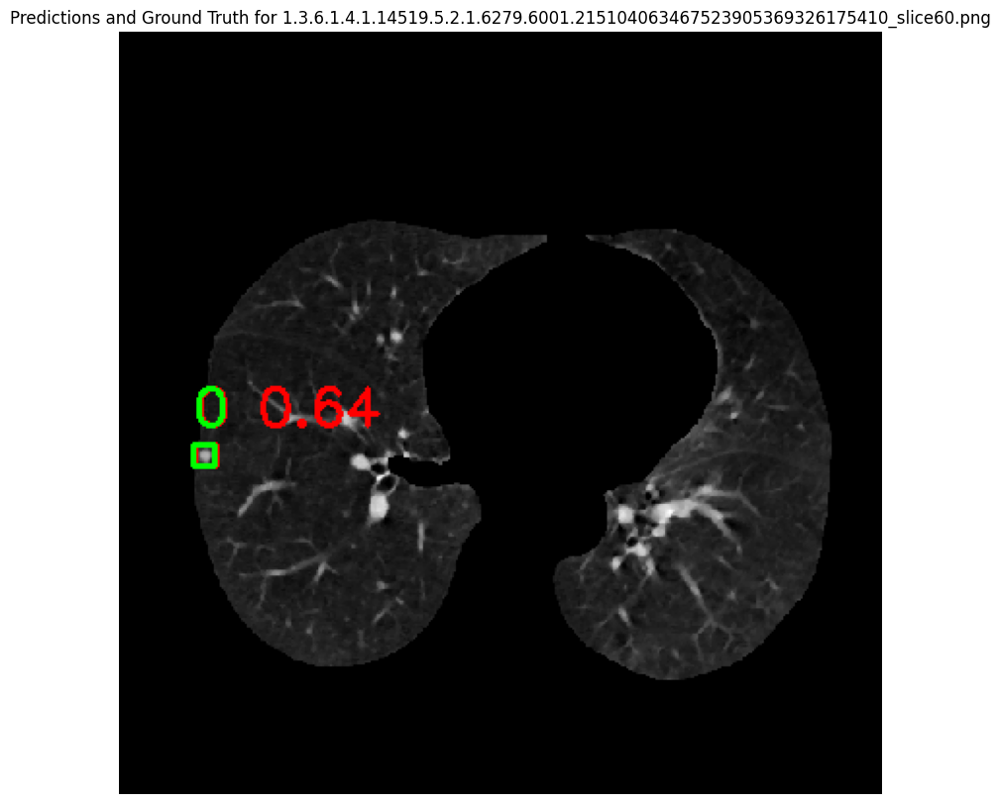


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.340158437895922179455019686521_slice86.png: 512x512 2 nodules, 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 57.3887, 193.6162,  69.1355, 204.2840]], device='cuda:0')
box.xyxy: tensor([[ 55.3086, 193.1919,  67.4371, 204.5695]], device='cuda:0')


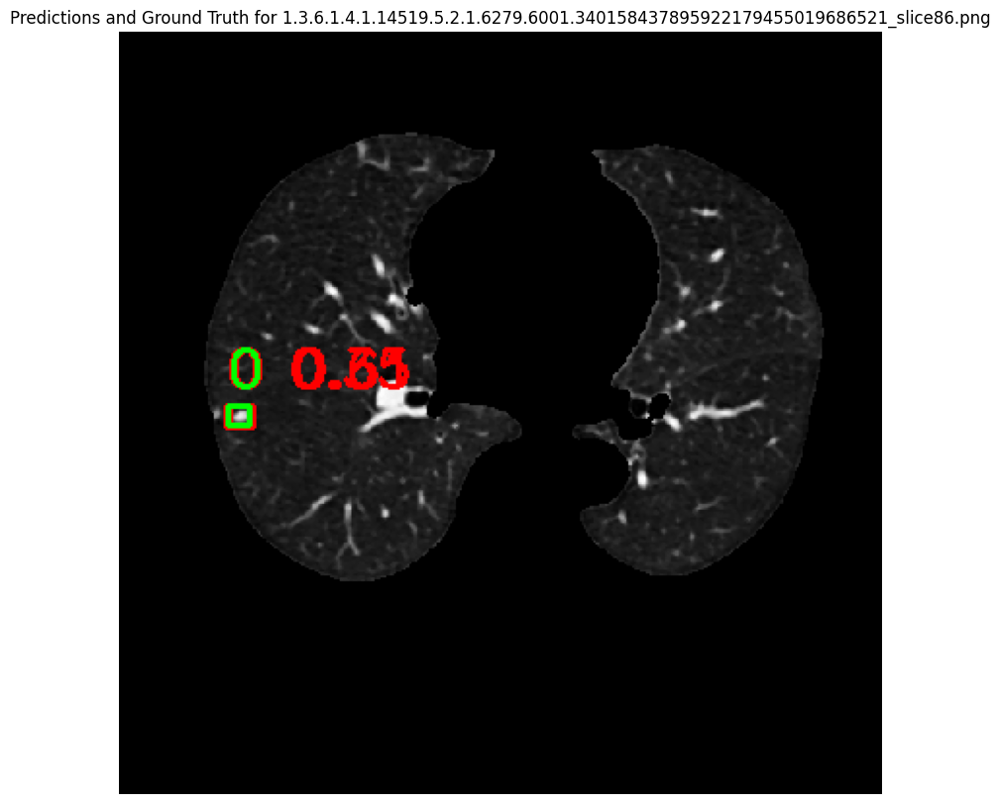


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.603126300703296693942875967838_slice72.png: 512x512 (no detections), 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


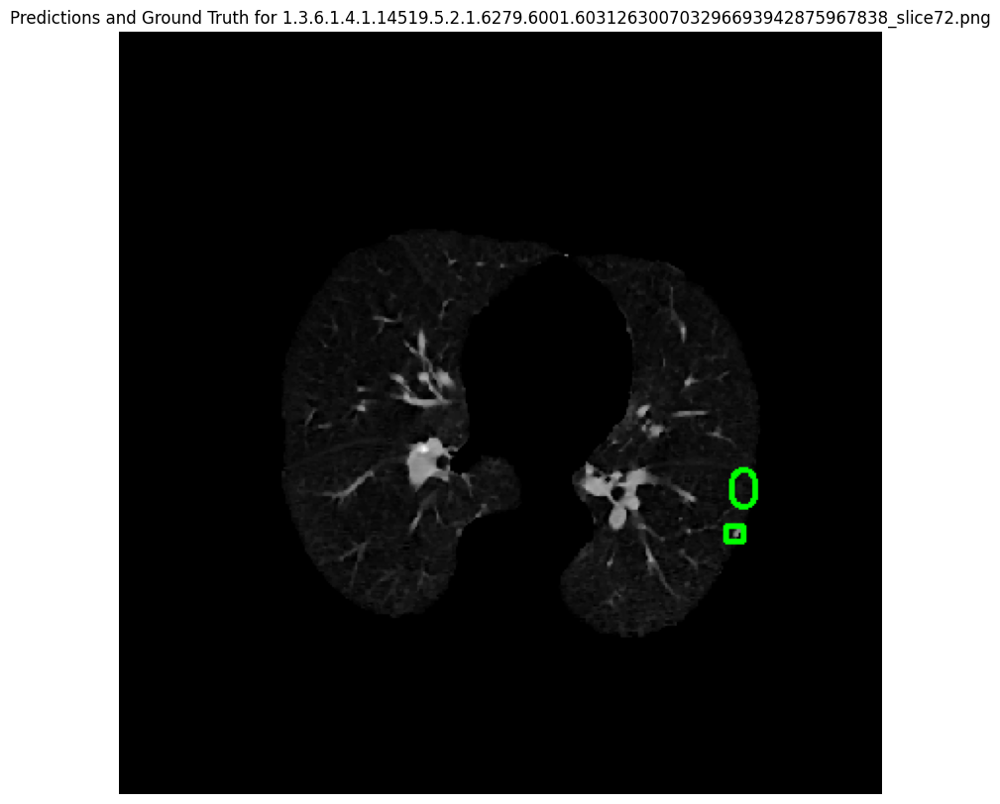


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.229860476925100292554329427970_slice60.png: 512x512 (no detections), 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 512)


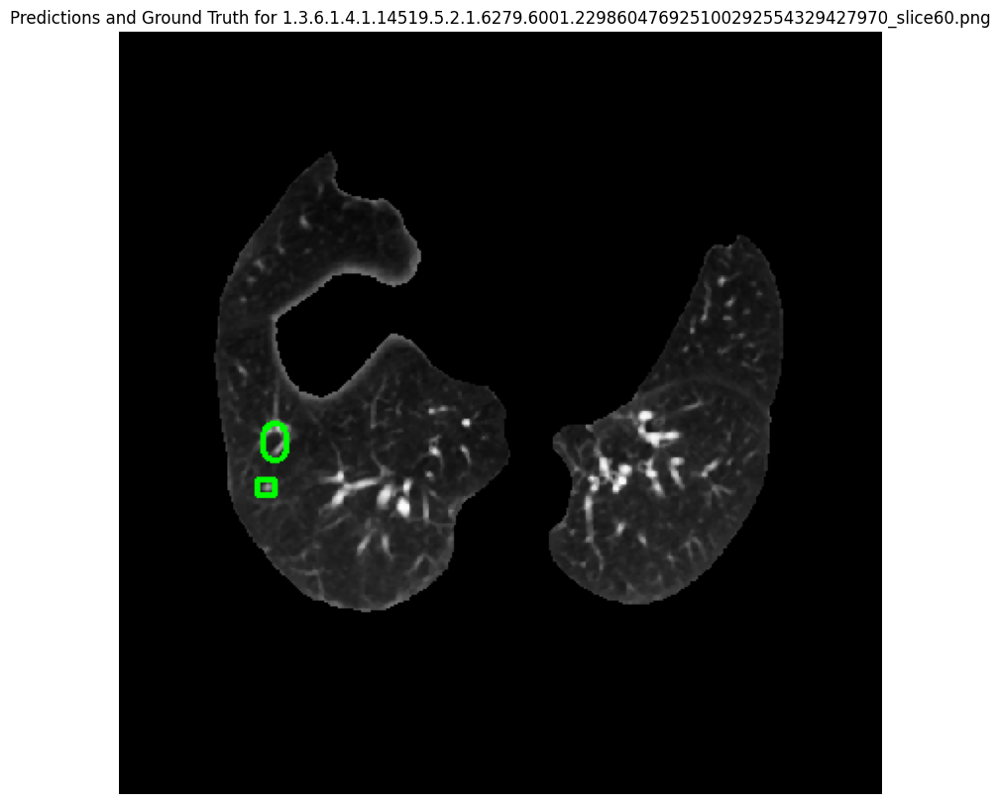


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.212608679077007918190529579976_slice54.png: 512x512 (no detections), 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


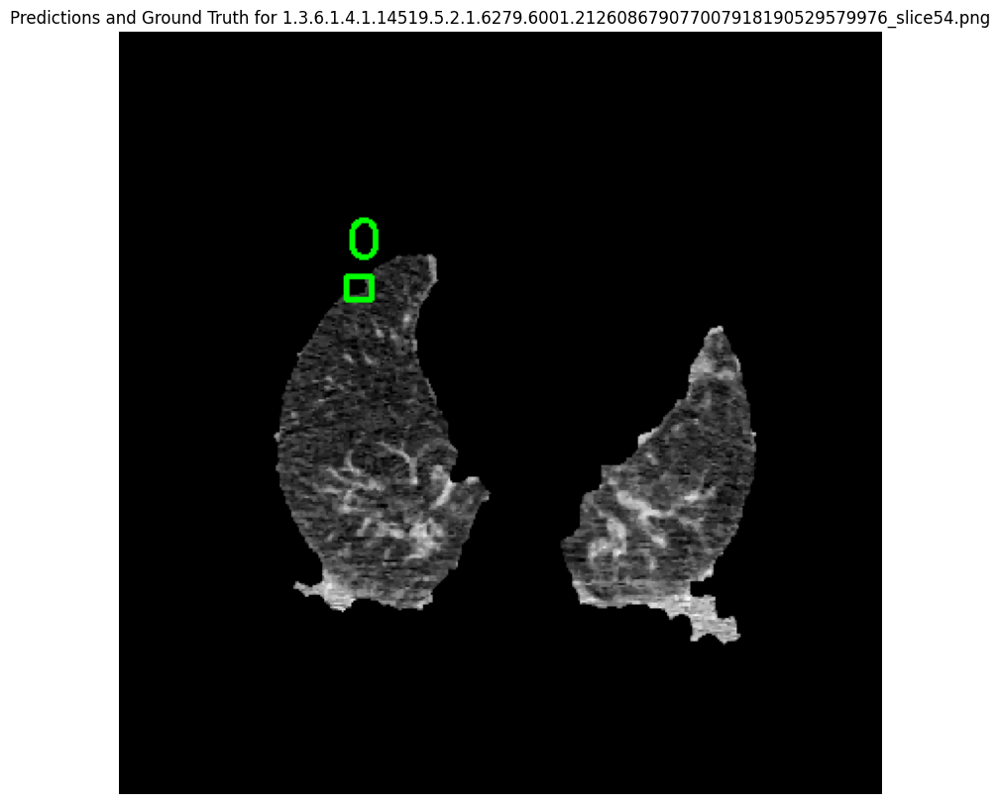


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.112767175295249119452142211437_slice88.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[134.0076, 241.6730, 144.7679, 251.5104]], device='cuda:0')


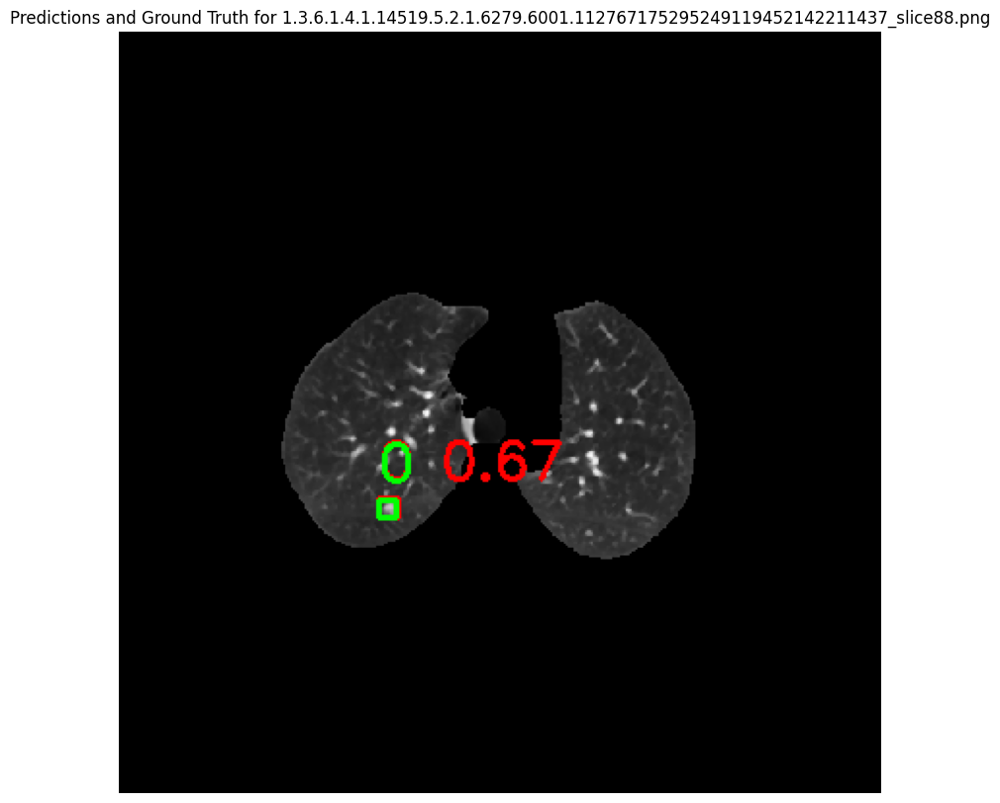


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.176869045992276345870480098568_slice82.png: 512x512 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


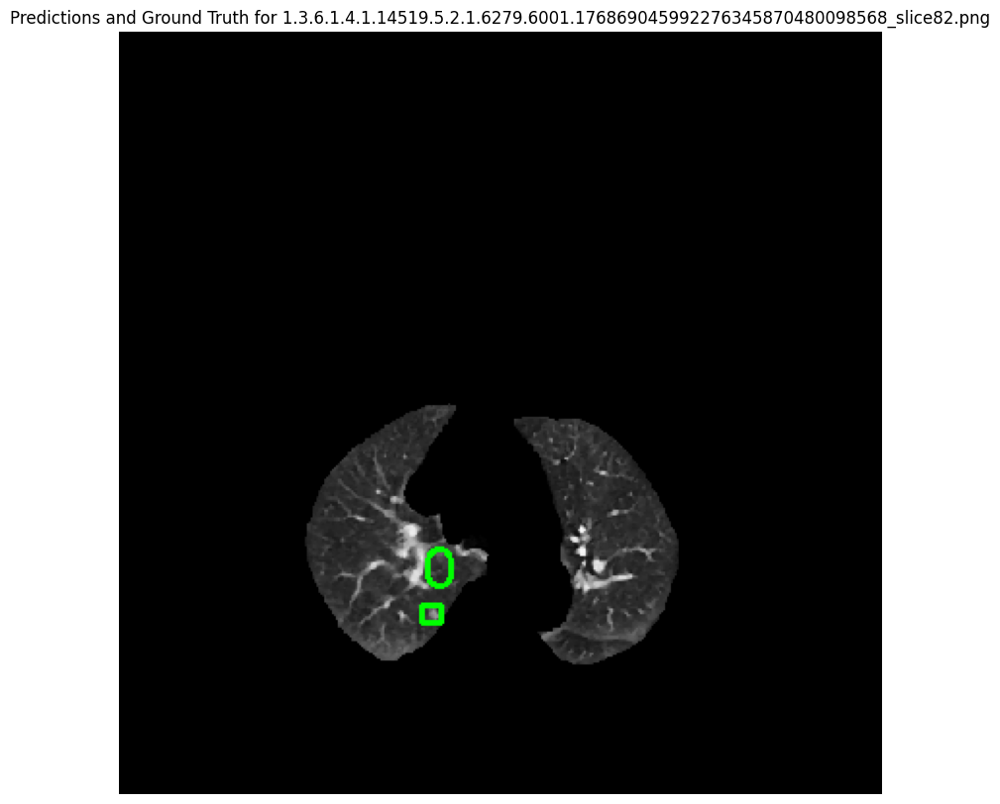


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.112767175295249119452142211437_slice57.png: 512x512 (no detections), 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


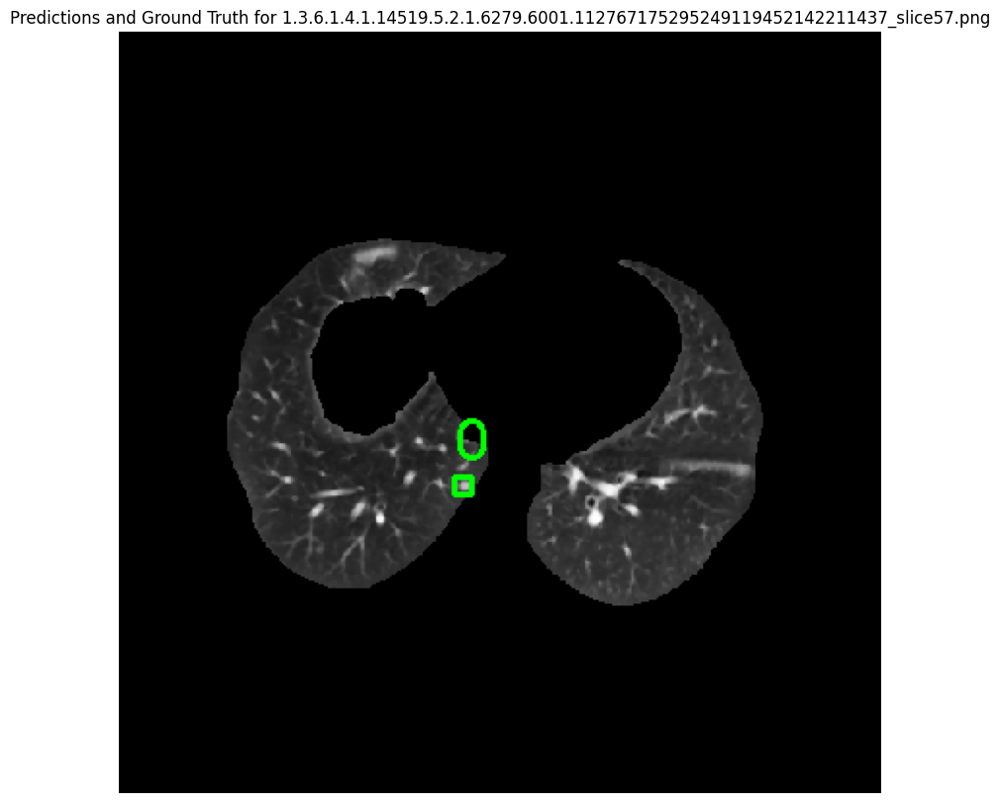


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.387954549120924524005910602207_slice169.png: 512x512 1 nodule, 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 57.4077, 210.2213,  67.4232, 220.4738]], device='cuda:0')


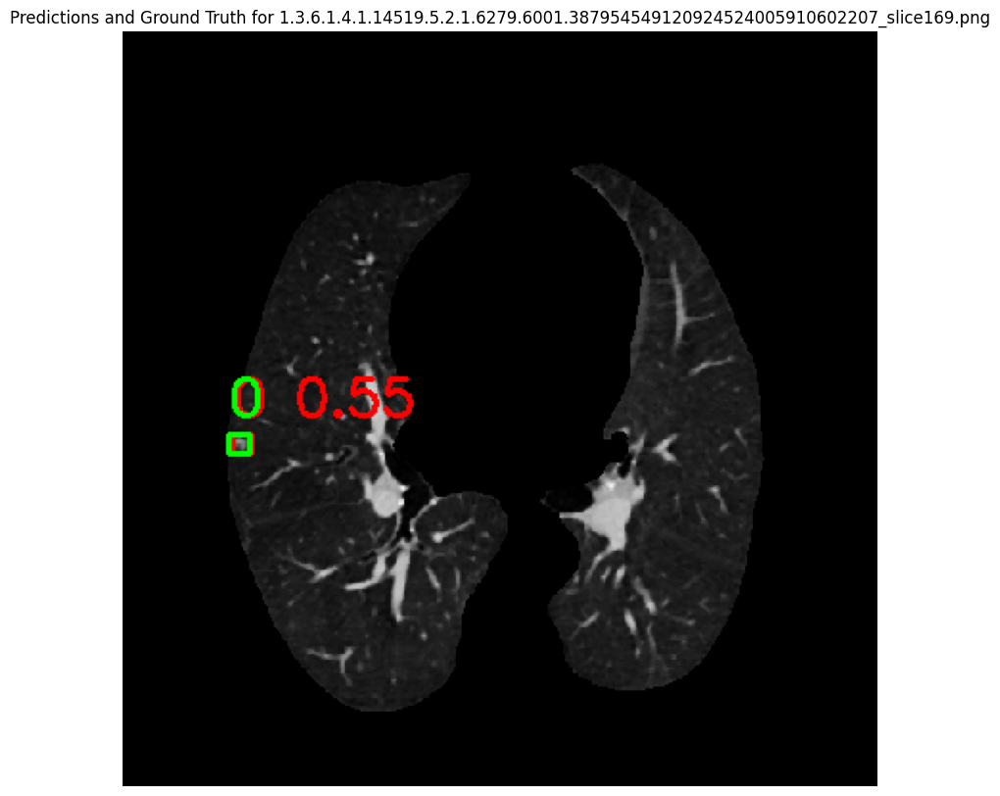


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.195557219224169985110295082004_slice149.png: 512x512 (no detections), 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


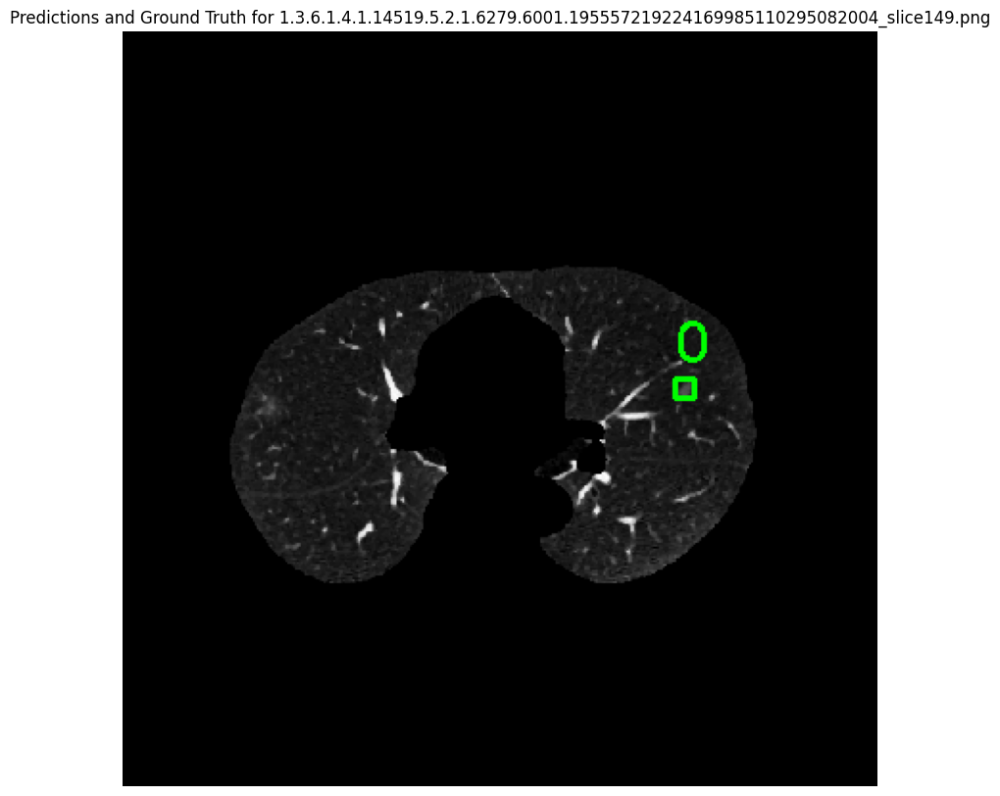


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.946129570505893110165820050204_slice159.png: 512x512 1 nodule, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[324.8031, 110.5198, 339.8856, 125.5059]], device='cuda:0')


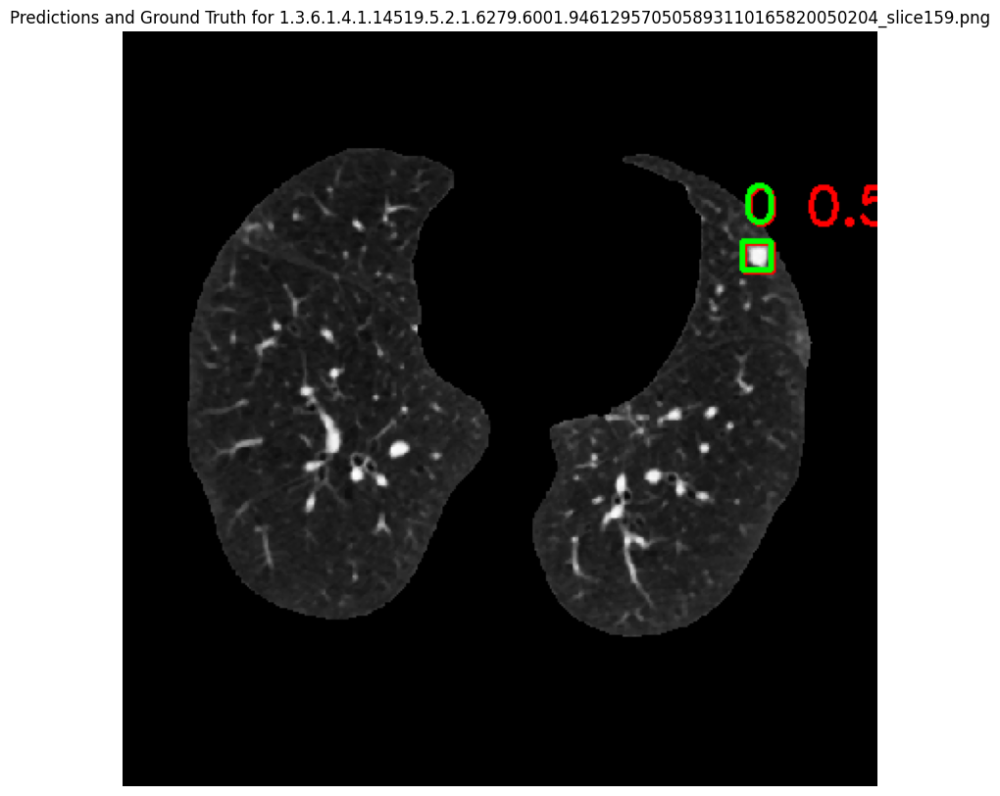


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.250481236093201801255751845296_slice267.png: 512x512 (no detections), 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


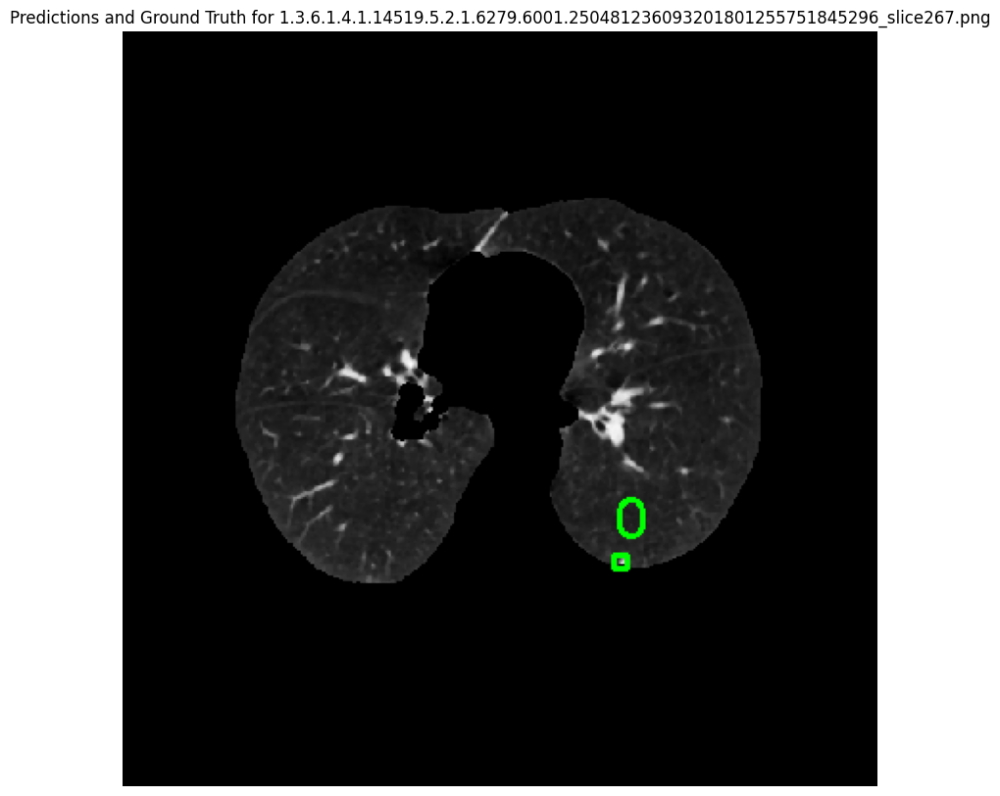


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.182192086929819295877506541021_slice255.png: 512x512 (no detections), 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


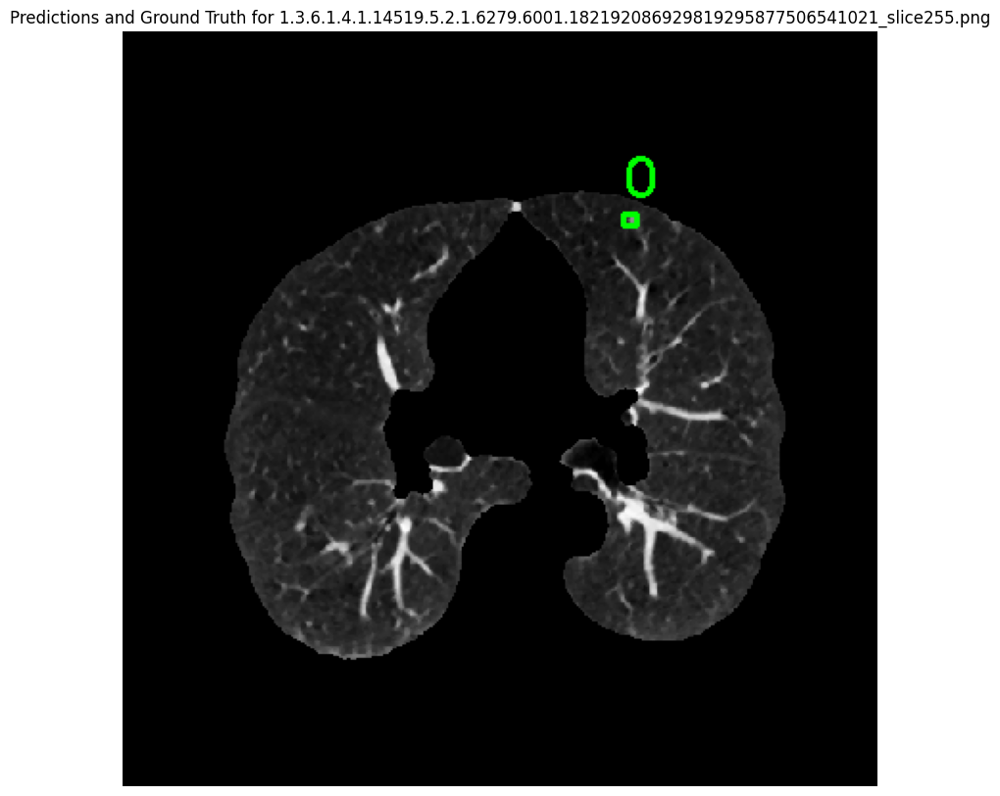


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.134519406153127654901640638633_slice231.png: 512x512 1 nodule, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[162.5131, 231.4867, 171.5727, 240.7708]], device='cuda:0')


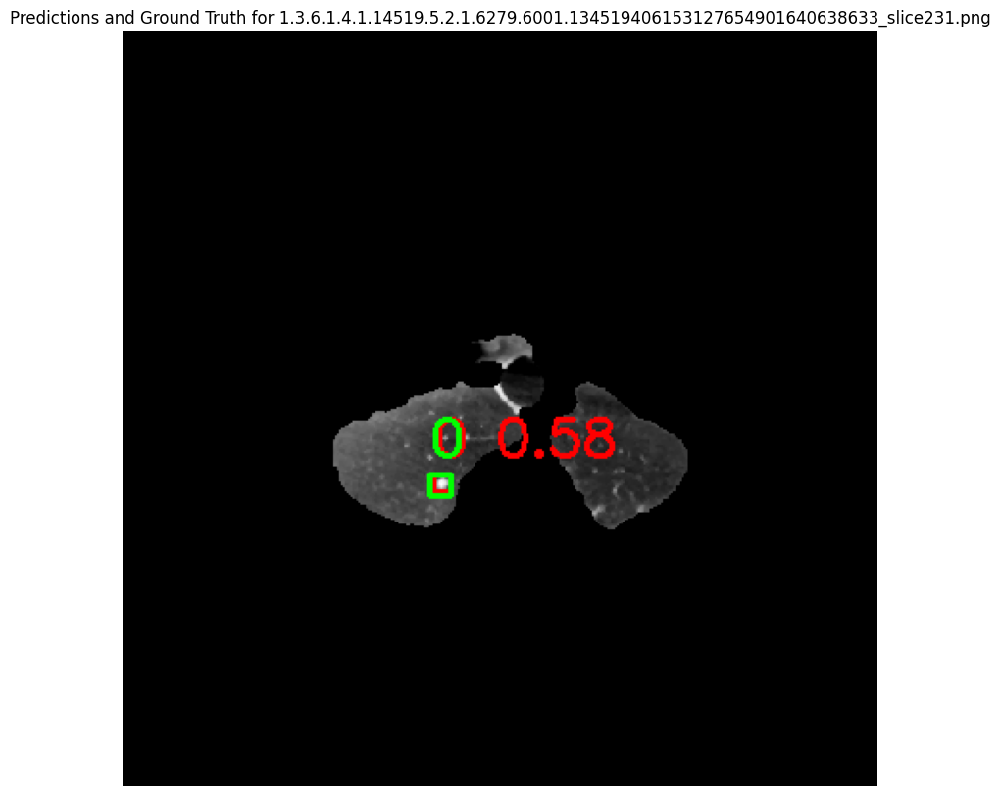


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.188385286346390202873004762827_slice146.png: 512x512 1 nodule, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 70.7849, 112.2444,  79.7648, 121.3456]], device='cuda:0')


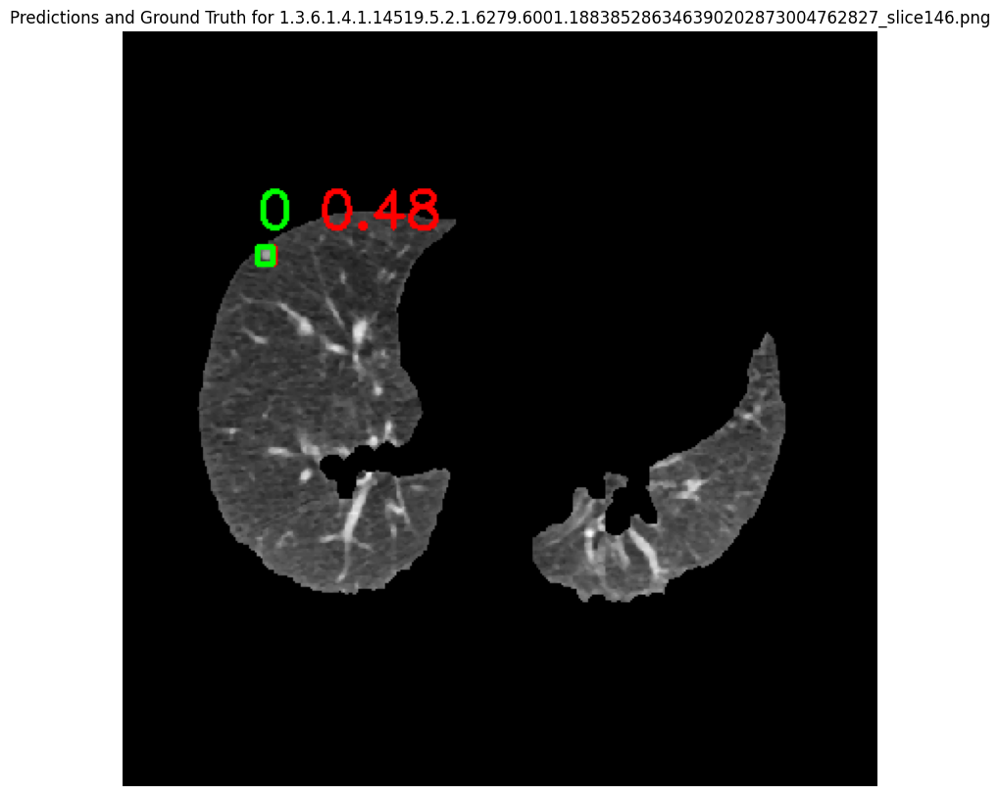


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.222052723822248889877676736332_slice298.png: 512x512 (no detections), 11.2ms
Speed: 1.8ms preprocess, 11.2ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


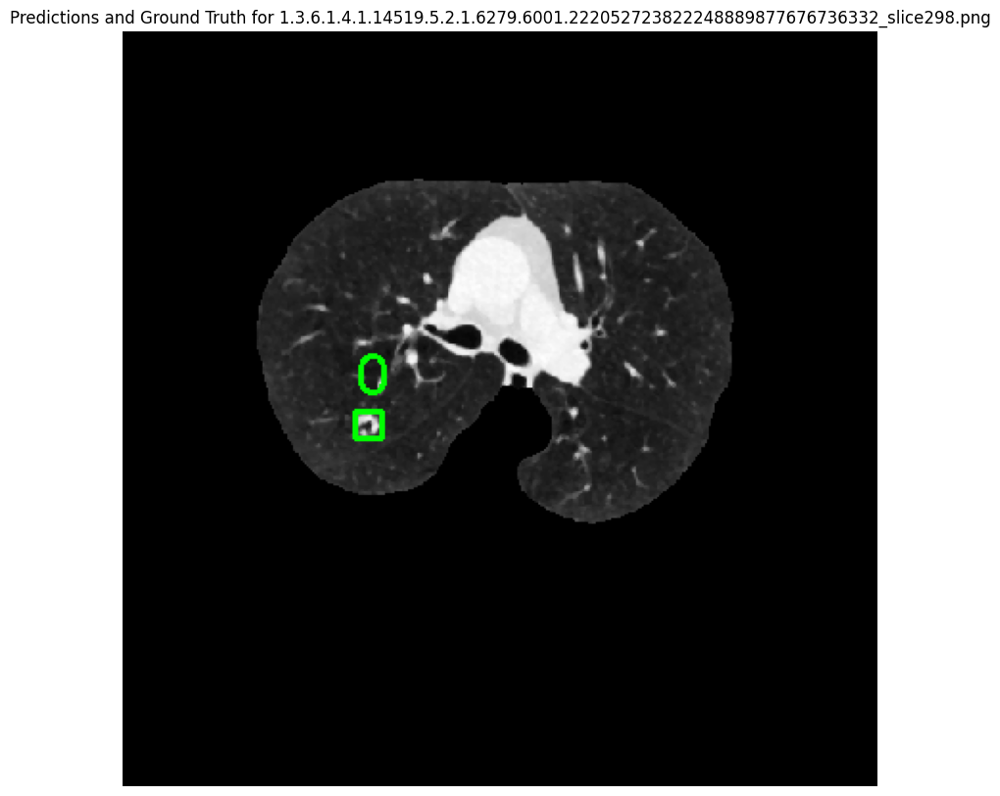


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.153985109349433321657655488650_slice256.png: 512x512 1 nodule, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[122.2938, 188.0002, 151.2549, 223.2054]], device='cuda:0')


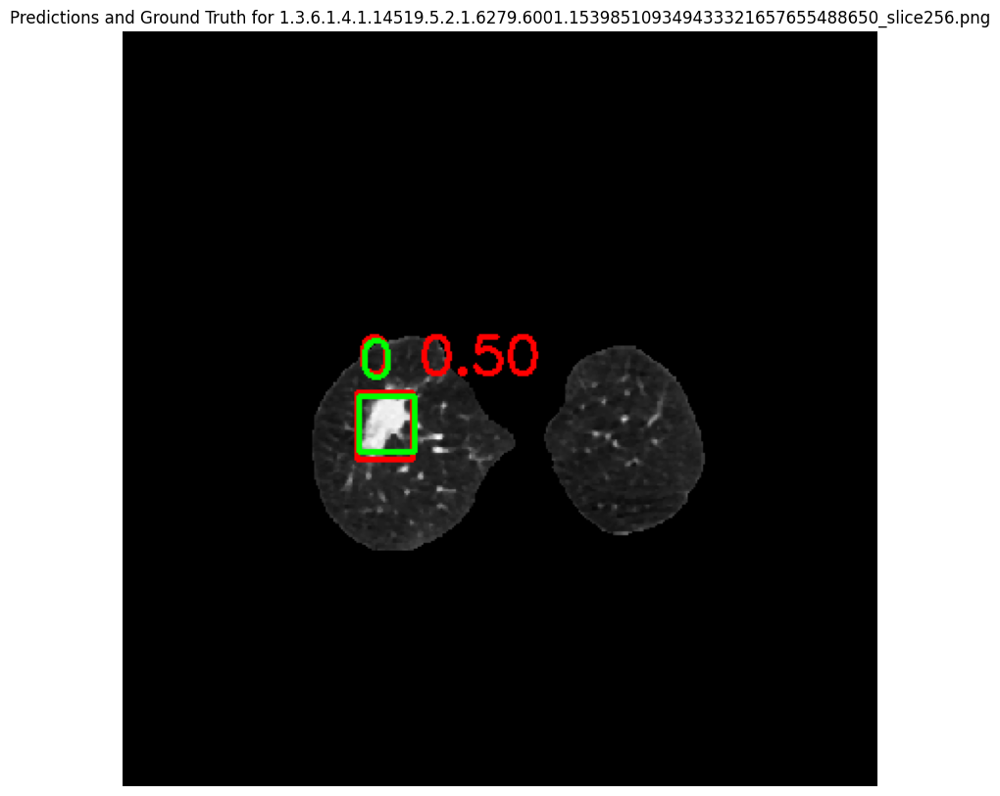


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.765459236550358748053283544075_slice240.png: 512x512 (no detections), 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


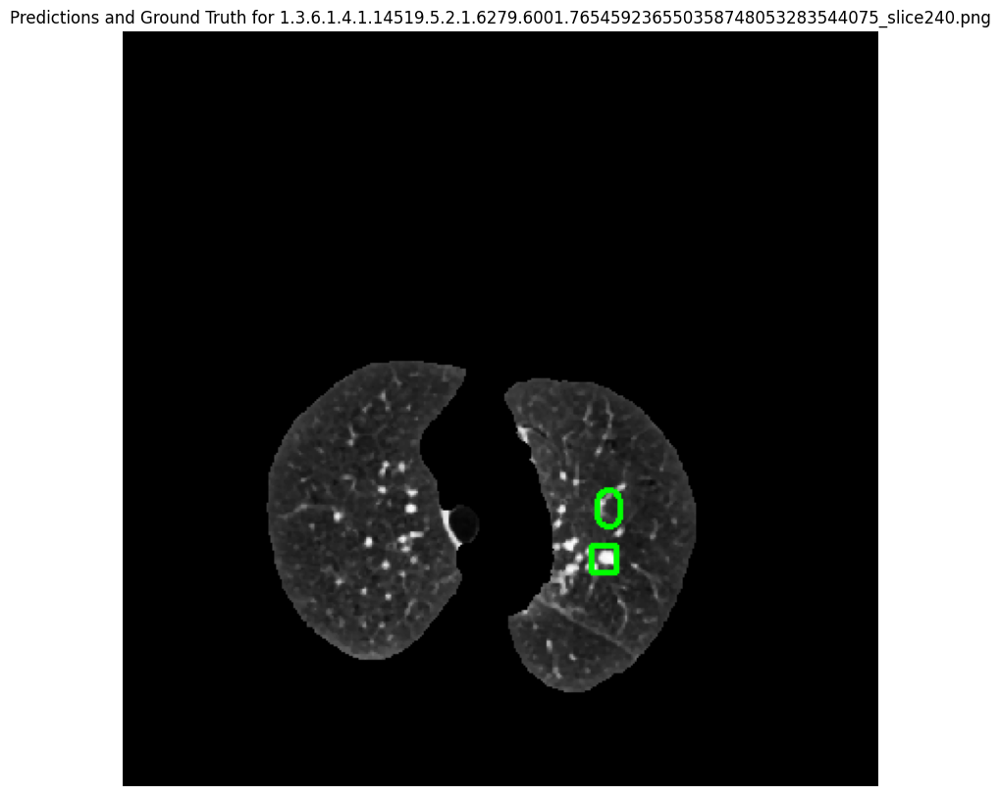


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.229096941293122177107846044795_slice104.png: 512x512 3 nodules, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 90.6649, 112.9778, 104.1511, 127.5354]], device='cuda:0')
box.xyxy: tensor([[299.1271, 125.8247, 310.9062, 138.5524]], device='cuda:0')
box.xyxy: tensor([[134.4357, 312.3716, 143.4805, 320.6834]], device='cuda:0')


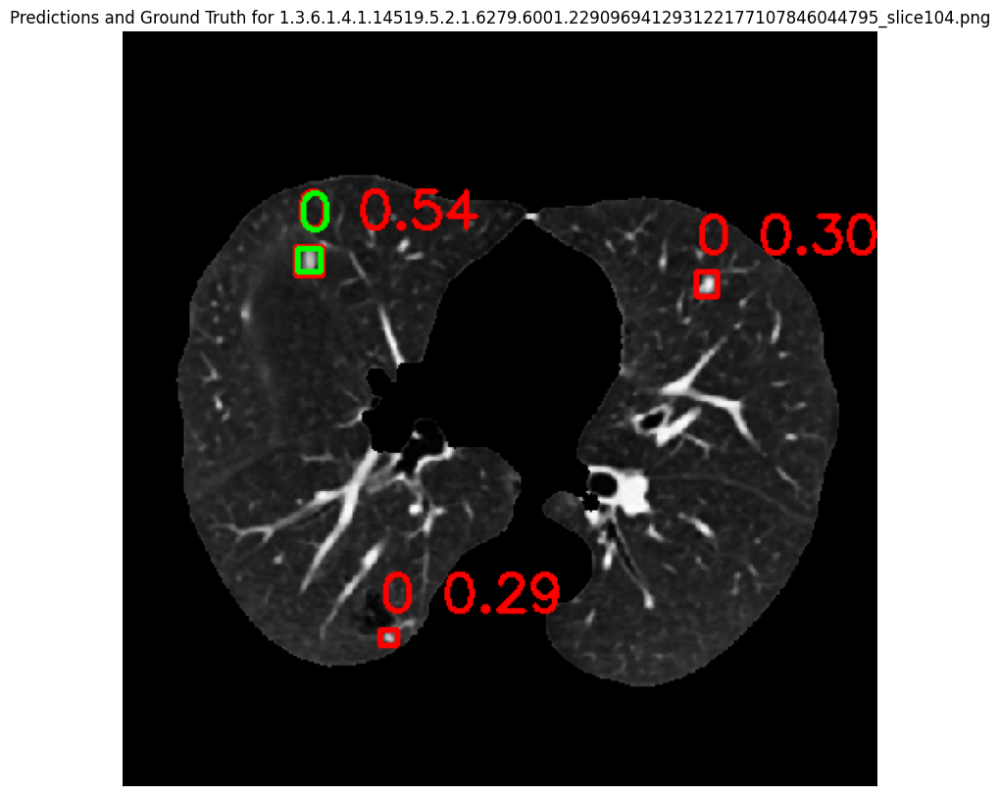


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.112767175295249119452142211437_slice69.png: 512x512 1 nodule, 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[297.1227, 213.9662, 310.5188, 227.2933]], device='cuda:0')


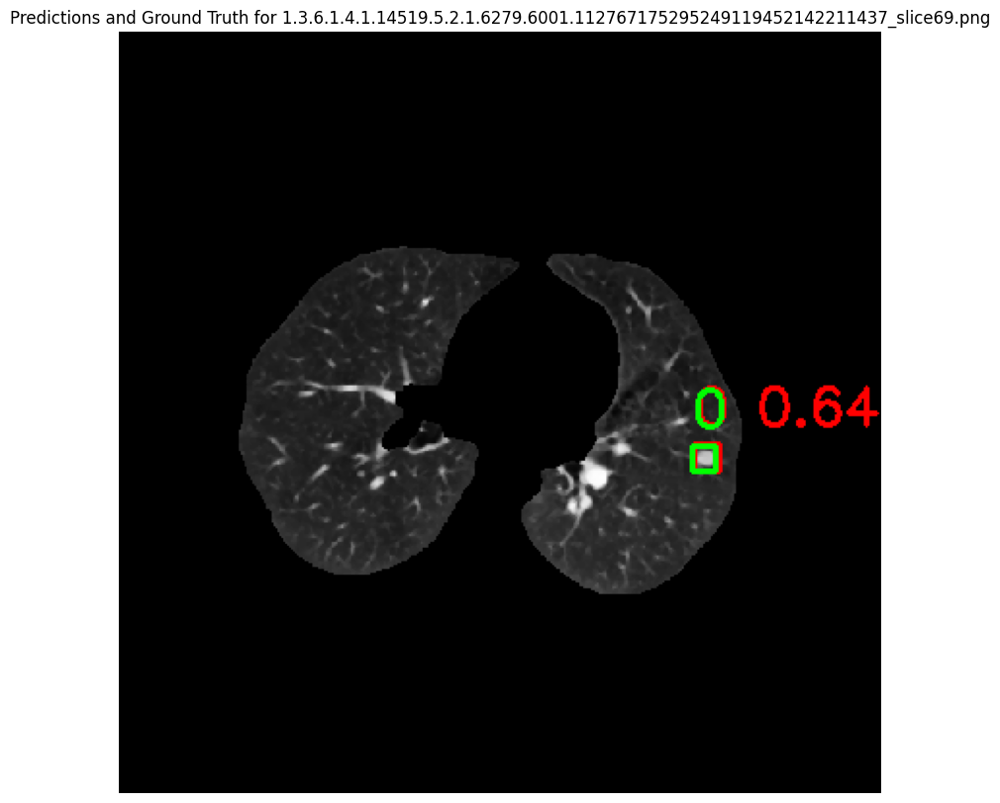


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.124822907934319930841506266464_slice304.png: 512x512 2 nodules, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[127.2104, 326.9145, 136.8890, 337.5147]], device='cuda:0')
box.xyxy: tensor([[125.1802, 326.5854, 135.1098, 337.8852]], device='cuda:0')


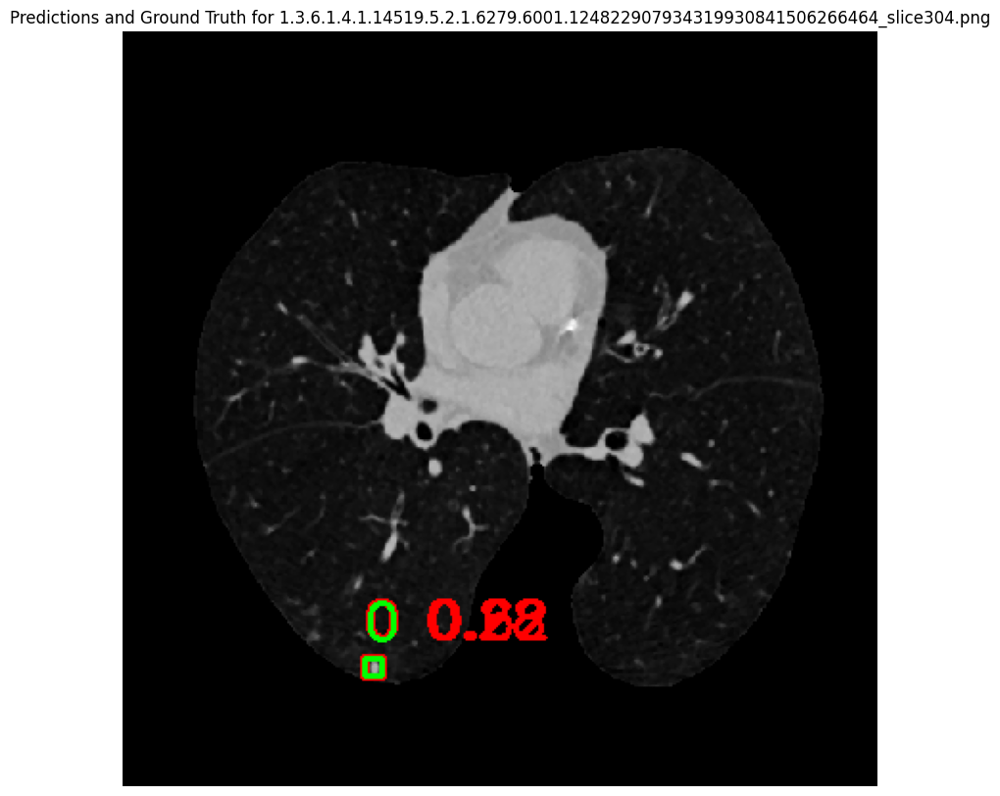


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.230491296081537726468075344411_slice86.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[274.8576, 263.3725, 288.2029, 276.1466]], device='cuda:0')


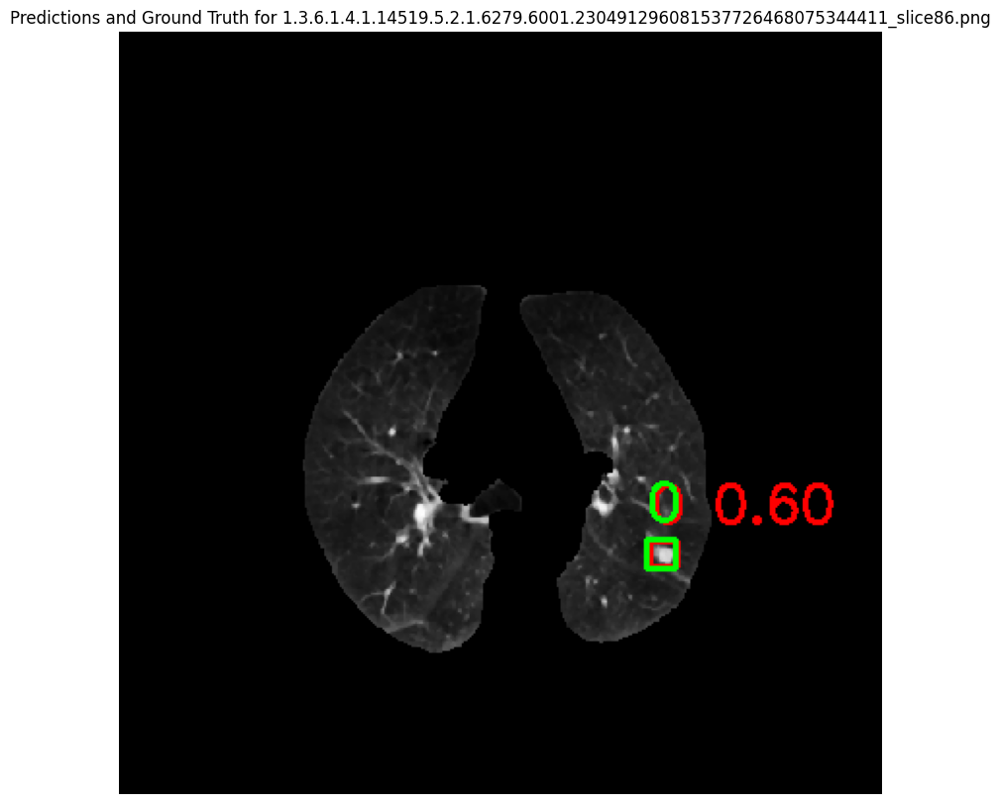


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.309901913847714156367981722205_slice52.png: 512x512 (no detections), 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


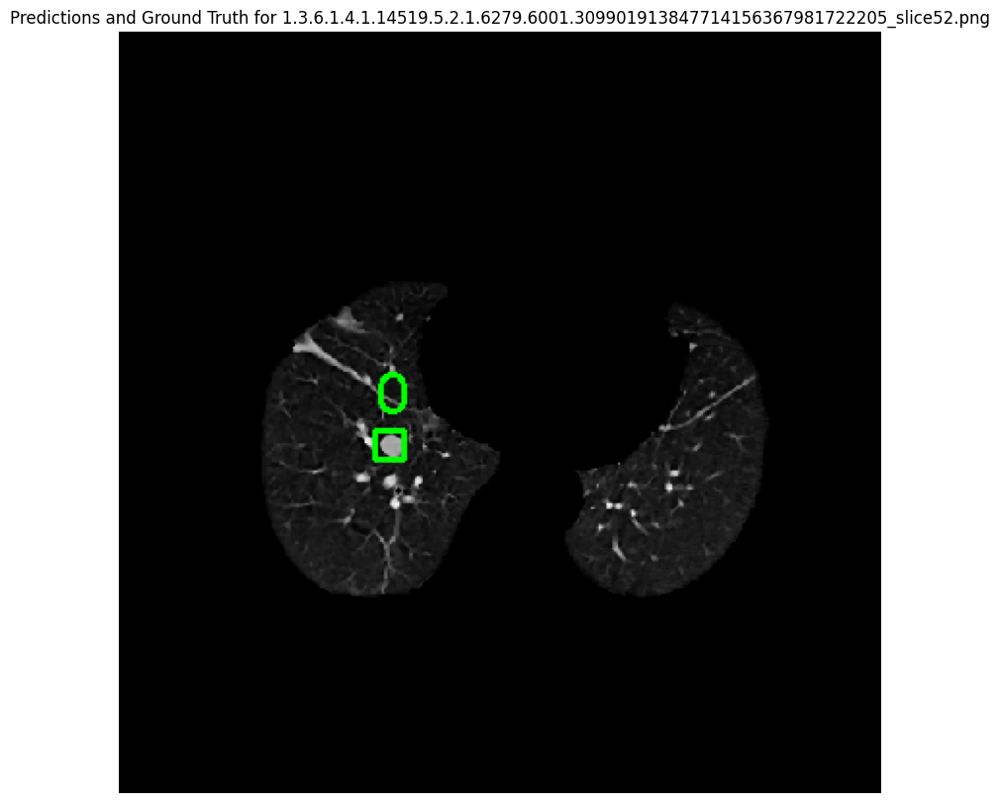


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.765930210026773090100532964804_slice247.png: 512x512 (no detections), 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


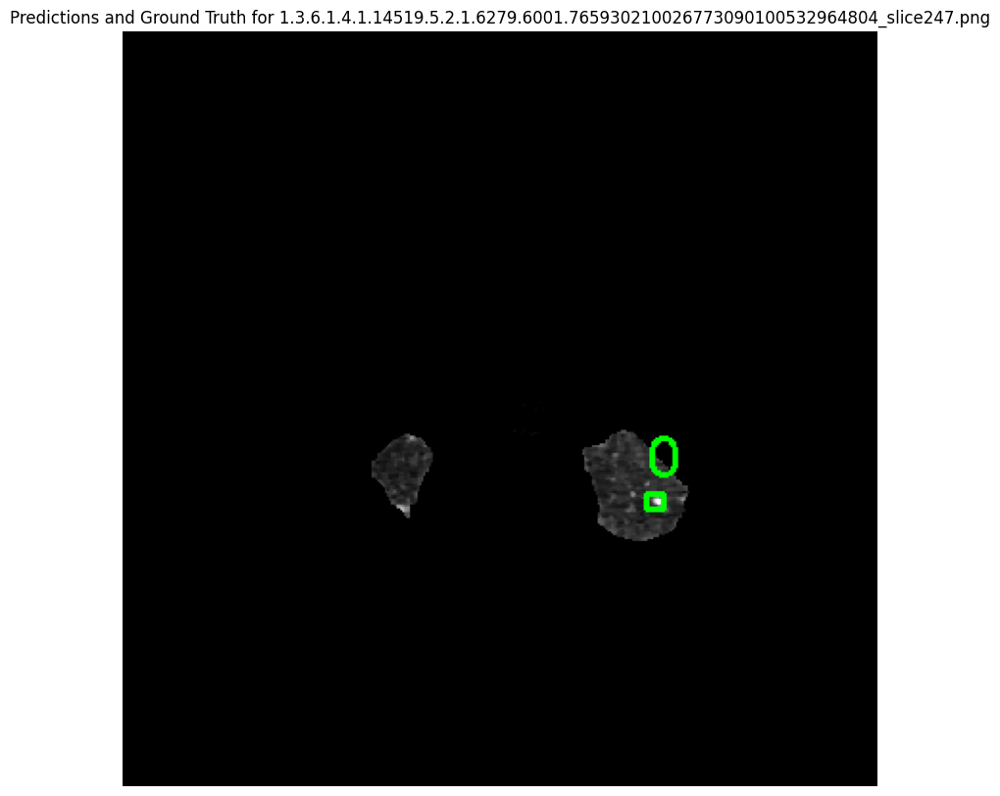


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.102681962408431413578140925249_slice121.png: 512x512 3 nodules, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[262.4954, 204.5549, 283.6027, 225.2074]], device='cuda:0')
box.xyxy: tensor([[119.4158, 237.2015, 129.5523, 248.4575]], device='cuda:0')
box.xyxy: tensor([[118.2351, 237.1451, 127.0488, 247.1635]], device='cuda:0')


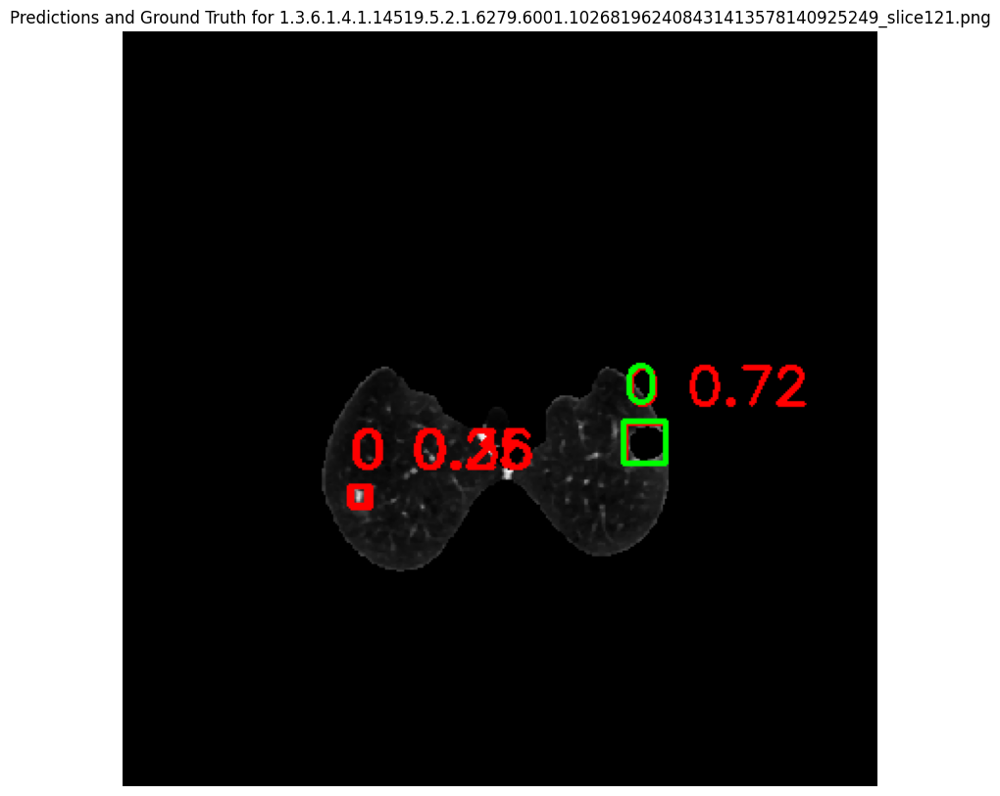


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.558286136379689377915919180358_slice205.png: 512x512 (no detections), 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


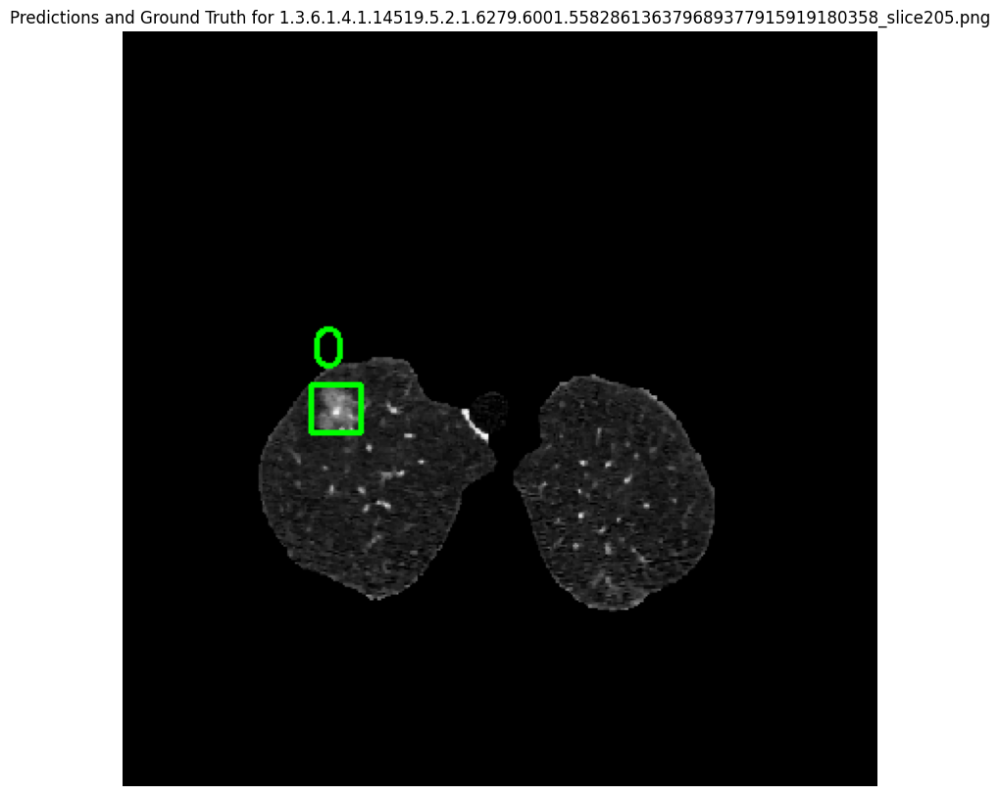


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.124822907934319930841506266464_slice420.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[293.3496, 135.0255, 301.9148, 144.8470]], device='cuda:0')


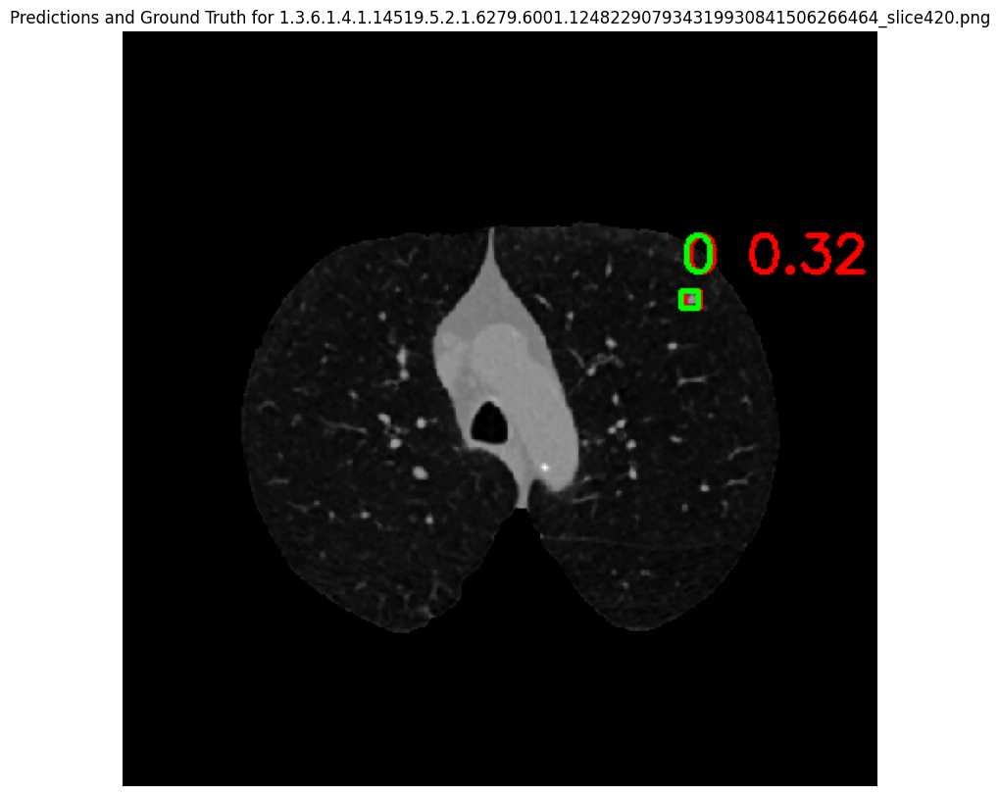


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.292994770358625142596171316474_slice101.png: 512x512 1 nodule, 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[318.9427, 195.1328, 329.0203, 204.6100]], device='cuda:0')


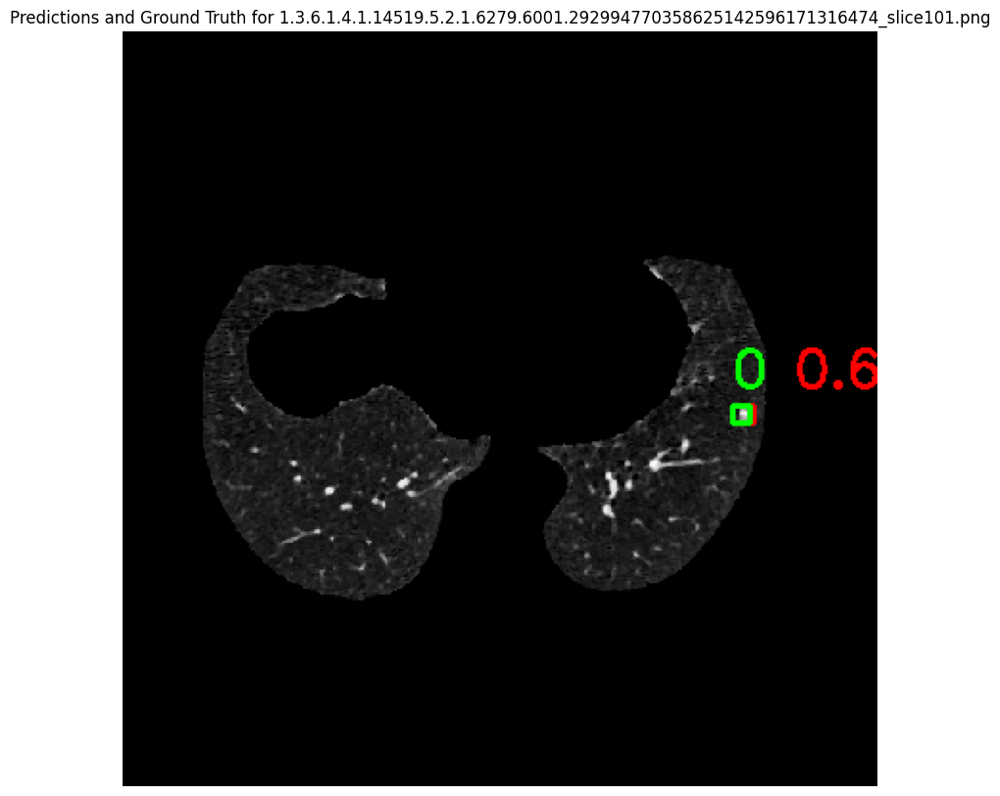


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.747803439040091794717626507402_slice74.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[265.8184, 204.0433, 285.9945, 221.9119]], device='cuda:0')


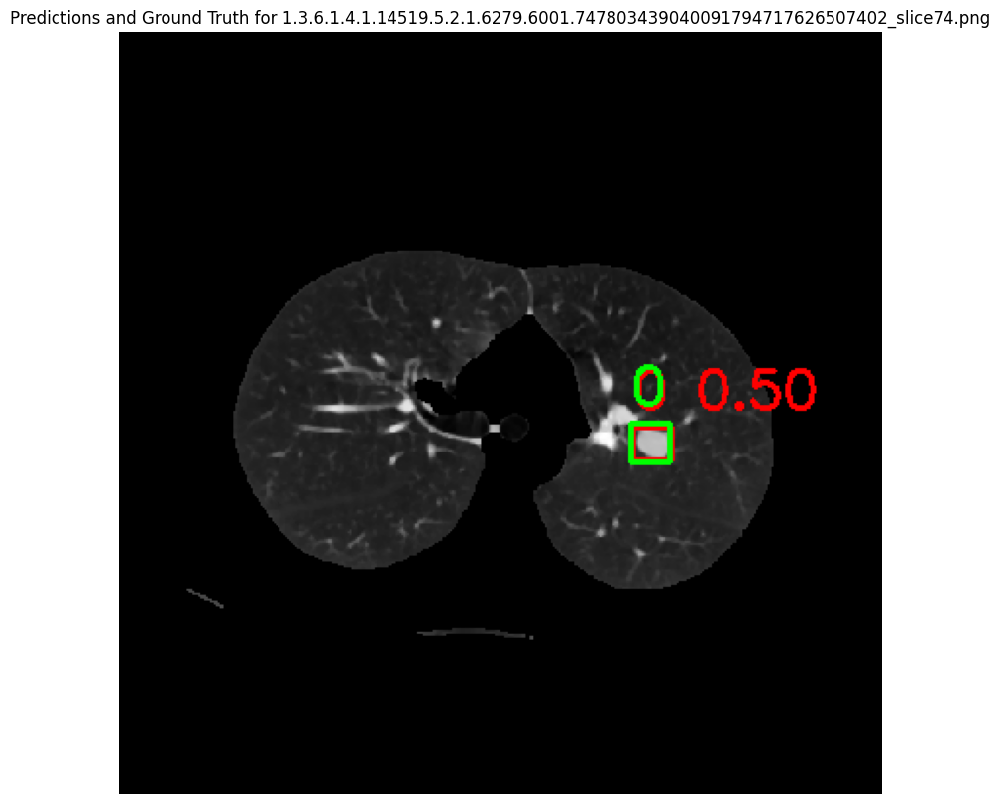


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.195557219224169985110295082004_slice142.png: 512x512 1 nodule, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[287.1783, 200.9722, 297.4706, 211.7002]], device='cuda:0')


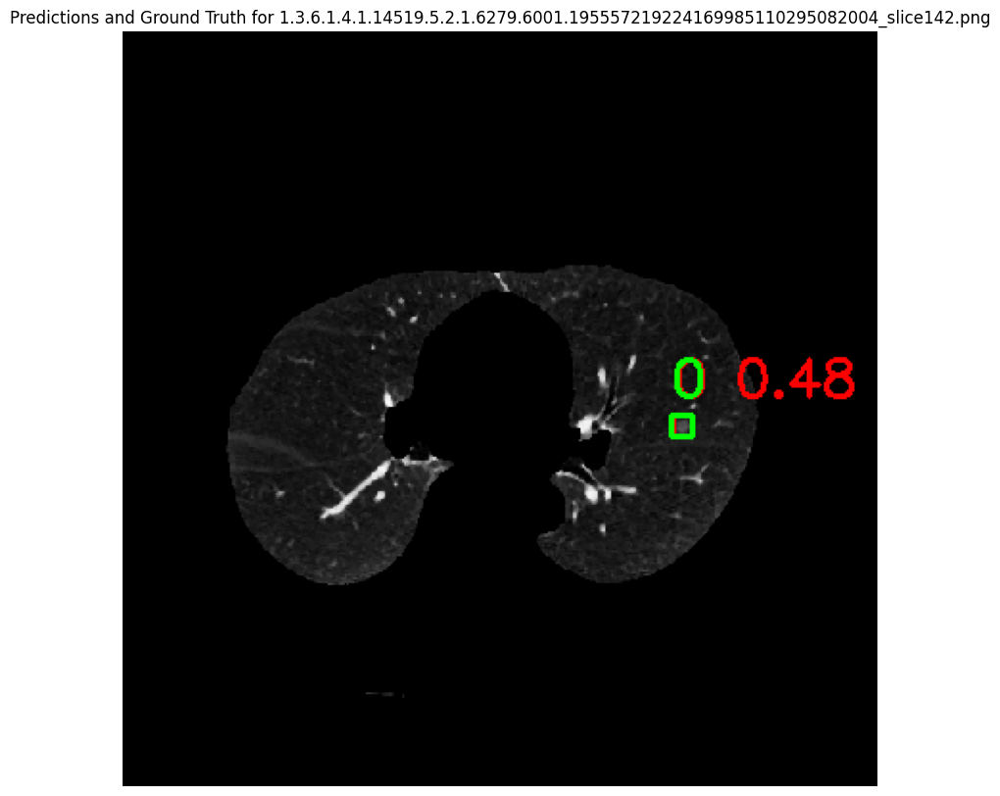


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.337005960787660957389988207064_slice160.png: 512x512 1 nodule, 11.2ms
Speed: 2.0ms preprocess, 11.2ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[118.1266, 122.6517, 125.8971, 130.4556]], device='cuda:0')


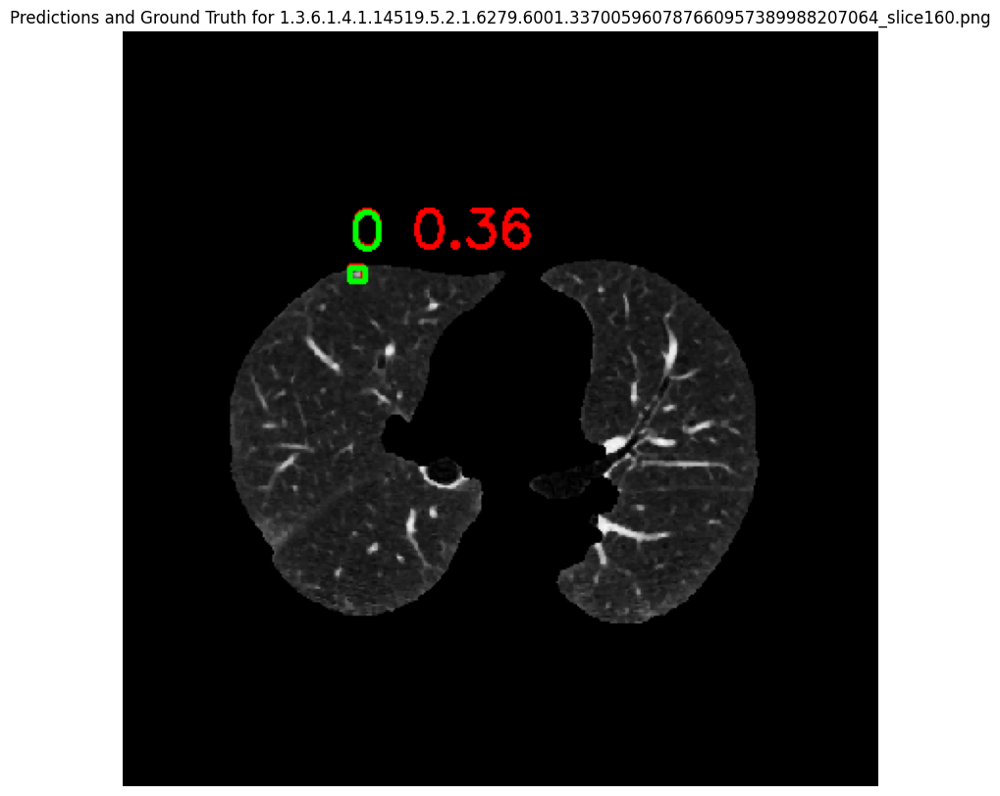


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.229096941293122177107846044795_slice103.png: 512x512 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)


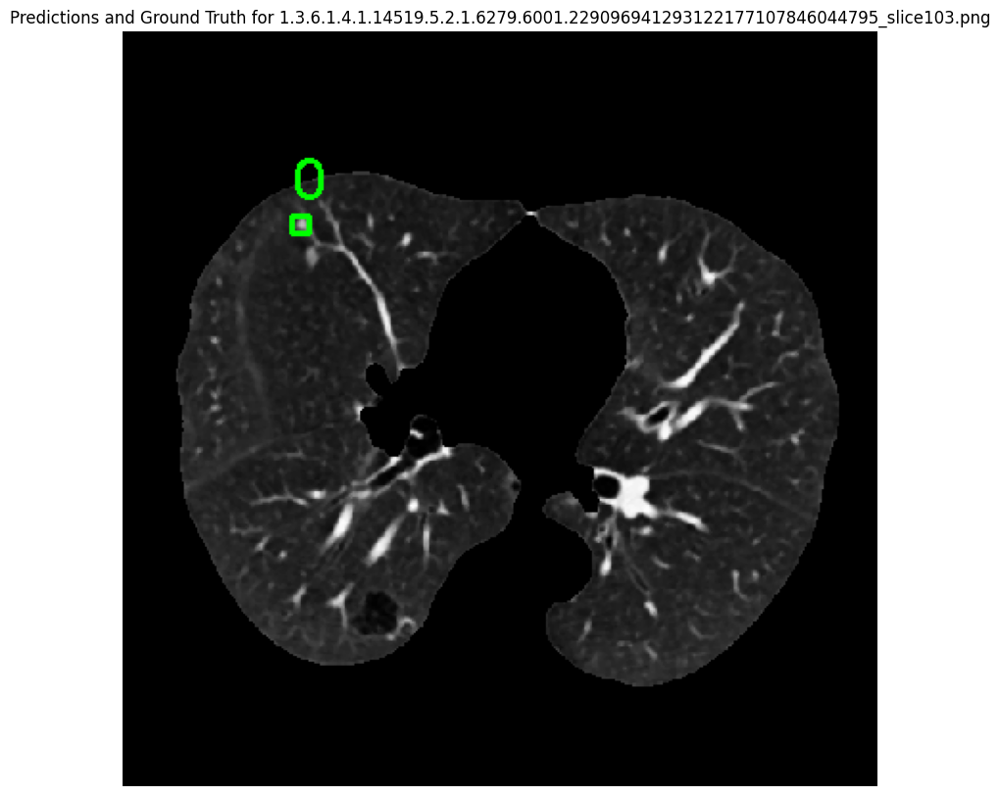


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.212608679077007918190529579976_slice128.png: 512x512 2 nodules, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[132.4653, 204.2065, 139.8511, 212.6940]], device='cuda:0')
box.xyxy: tensor([[131.1087, 204.4662, 138.4986, 212.4789]], device='cuda:0')


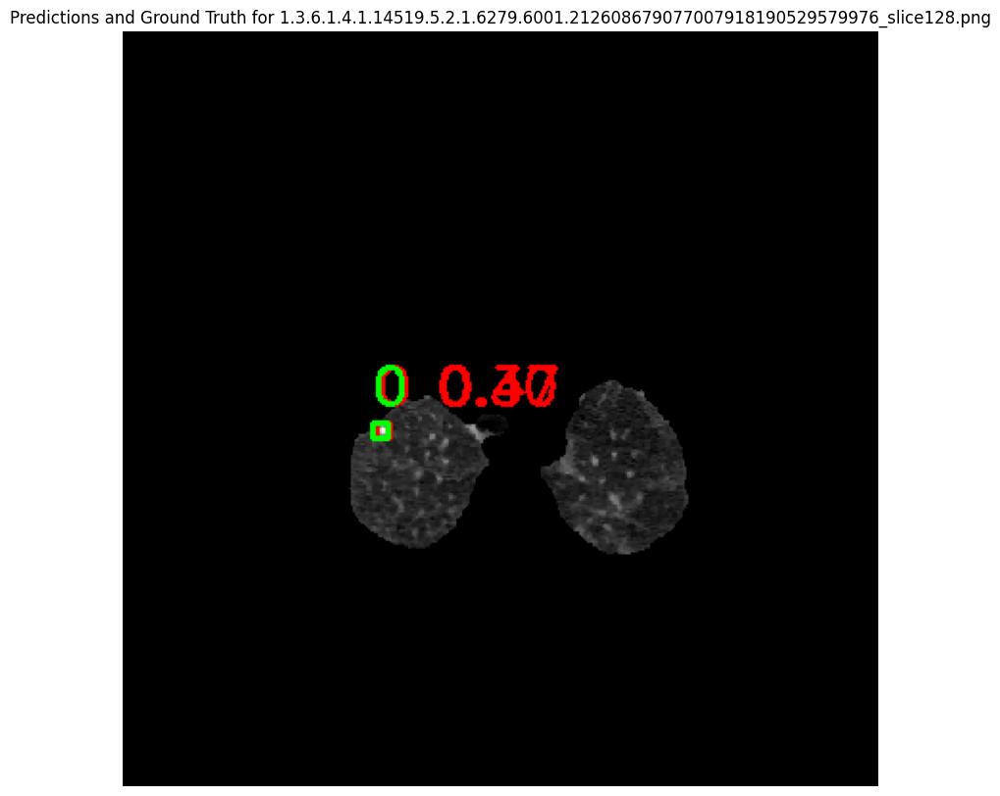


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.229096941293122177107846044795_slice115.png: 512x512 3 nodules, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[102.7178, 302.6695, 126.1824, 327.2395]], device='cuda:0')
box.xyxy: tensor([[109.1571,  99.4248, 120.6173, 110.1245]], device='cuda:0')
box.xyxy: tensor([[ 77.1197, 254.0564,  93.8154, 269.8531]], device='cuda:0')


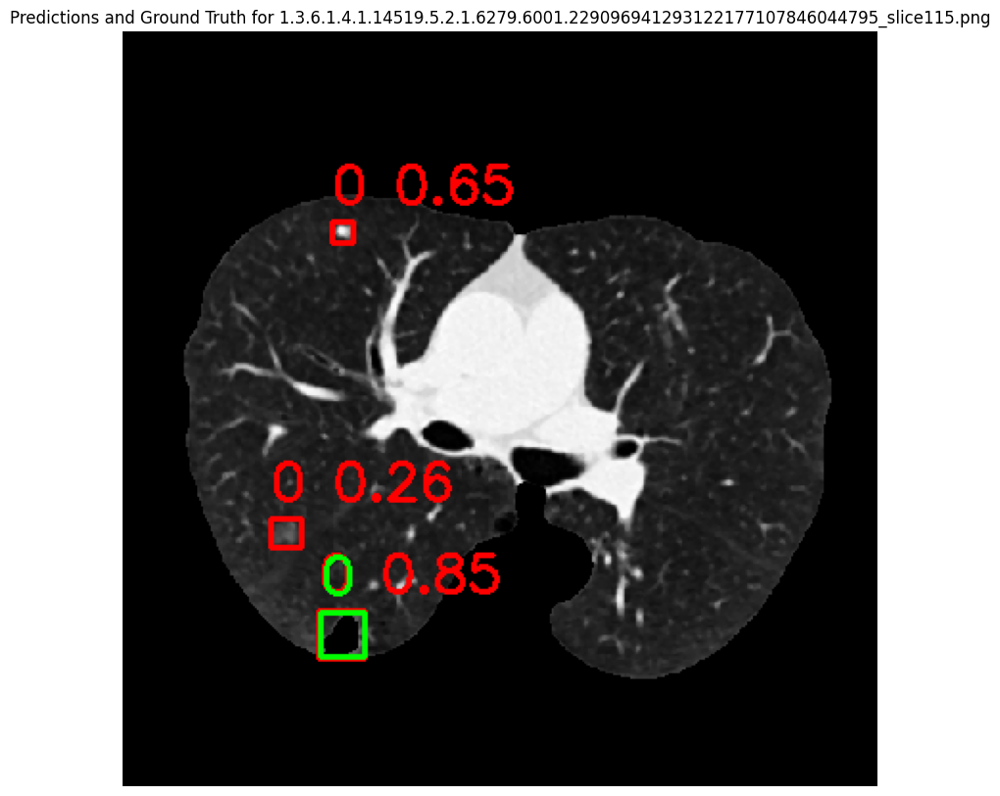


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.272344603176687884771013620823_slice103.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[282.2350, 183.4180, 304.5941, 212.4729]], device='cuda:0')


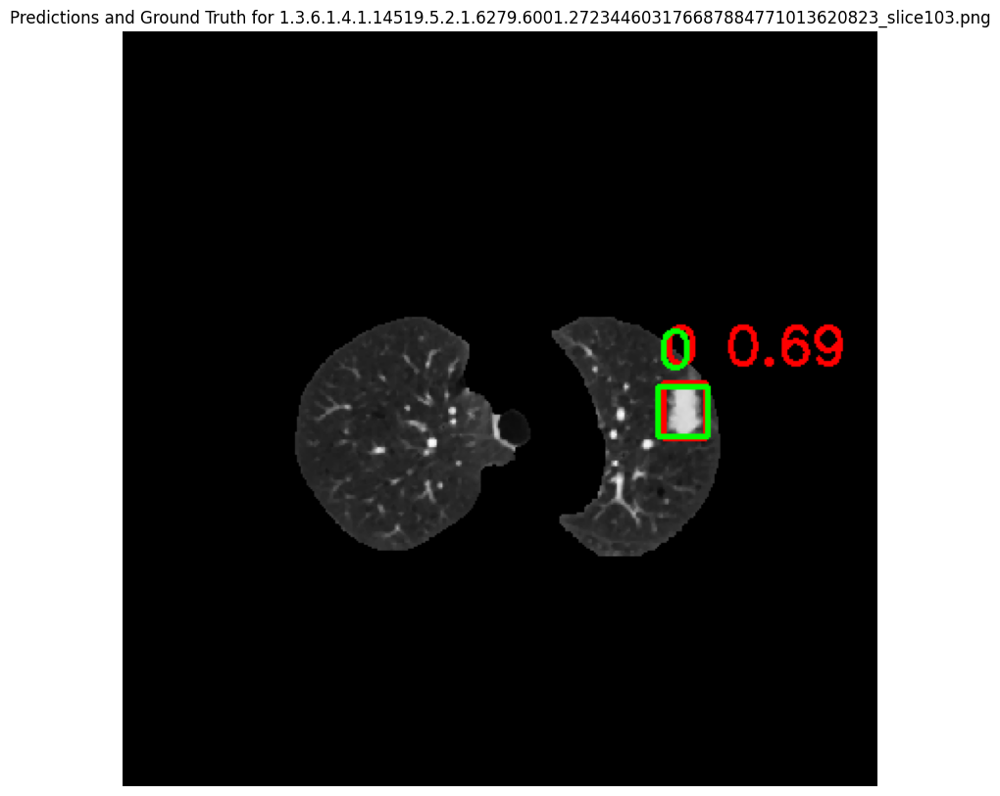


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.328944769569002417592093467626_slice56.png: 512x512 1 nodule, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 83.7061, 186.9052,  92.5933, 195.1174]], device='cuda:0')


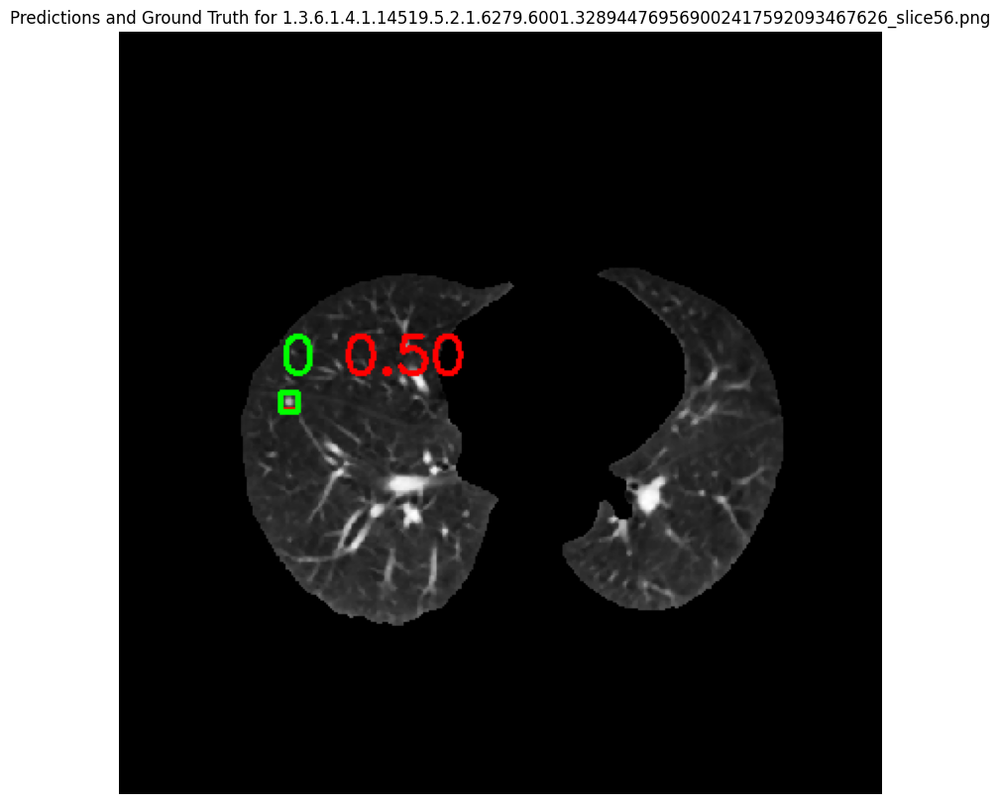


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.124822907934319930841506266464_slice259.png: 512x512 2 nodules, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[287.3351, 323.4748, 296.6946, 332.9492]], device='cuda:0')
box.xyxy: tensor([[133.3502, 329.3733, 141.9795, 337.3336]], device='cuda:0')


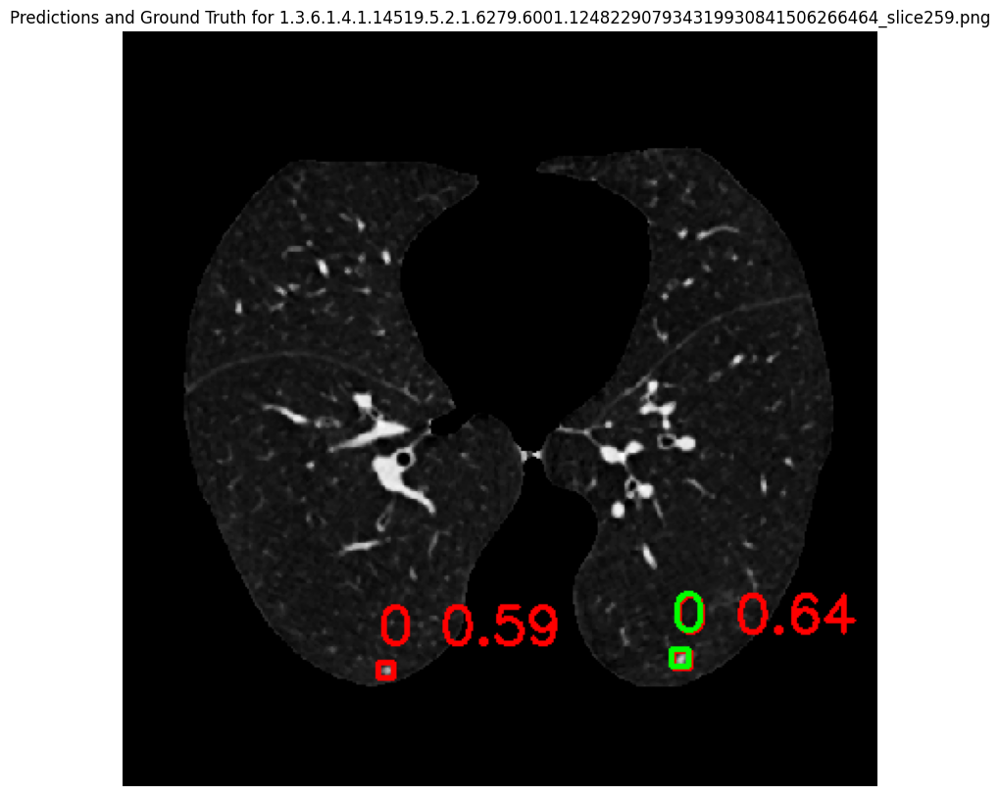


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.188619674701053082195613114069_slice234.png: 512x512 1 nodule, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 94.9481, 243.4727, 107.7607, 256.5360]], device='cuda:0')


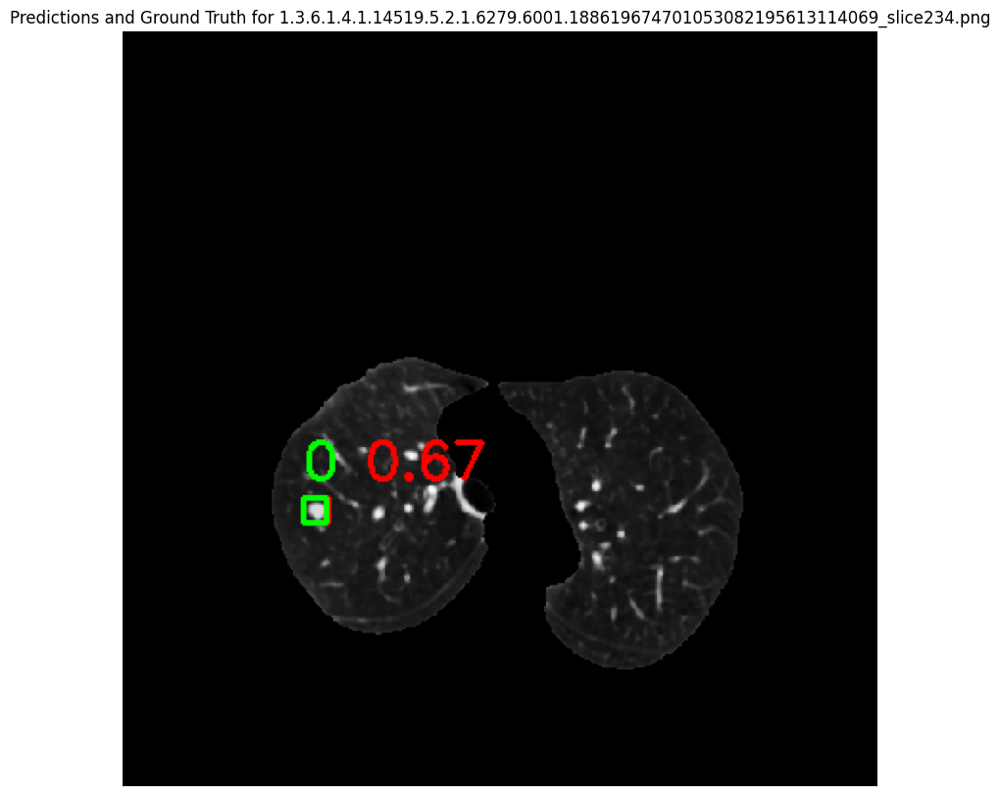


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.265780642925621389994857727416_slice141.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 57.9648, 166.8999,  77.6162, 186.2880]], device='cuda:0')


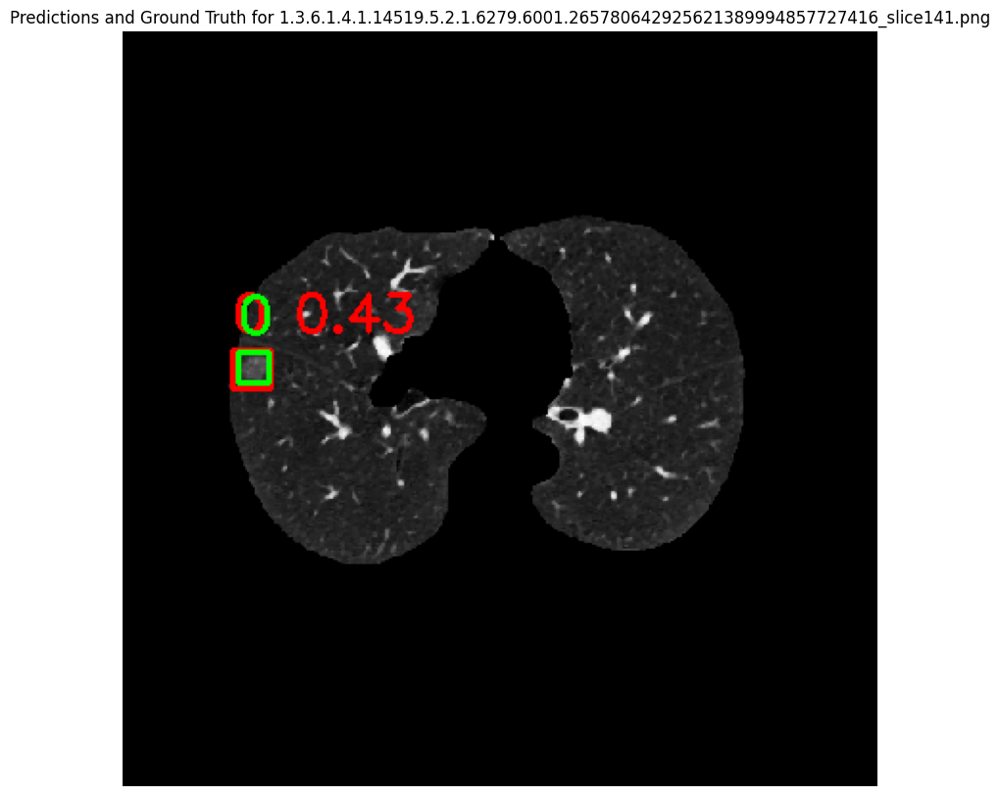


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.195557219224169985110295082004_slice133.png: 512x512 2 nodules, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[107.2646, 152.0255, 116.4711, 162.2084]], device='cuda:0')
box.xyxy: tensor([[106.0745, 152.2465, 114.9348, 161.7272]], device='cuda:0')


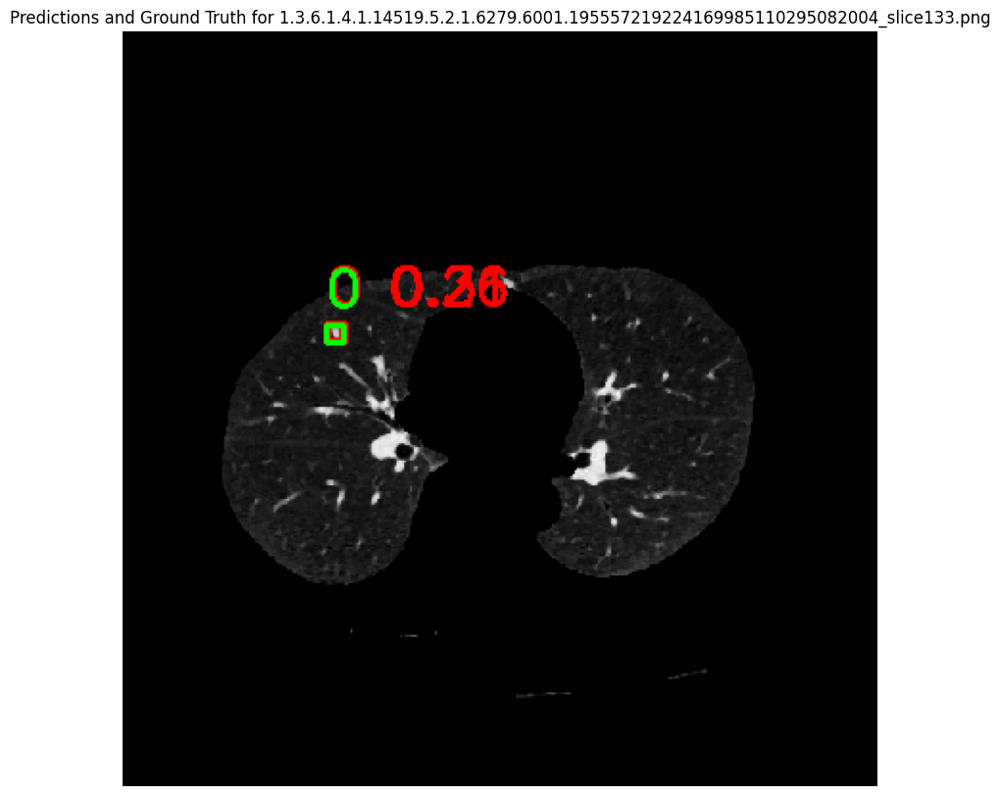


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.237215747217294006286437405216_slice158.png: 512x512 1 nodule, 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[133.5697, 136.8379, 142.3256, 145.5064]], device='cuda:0')


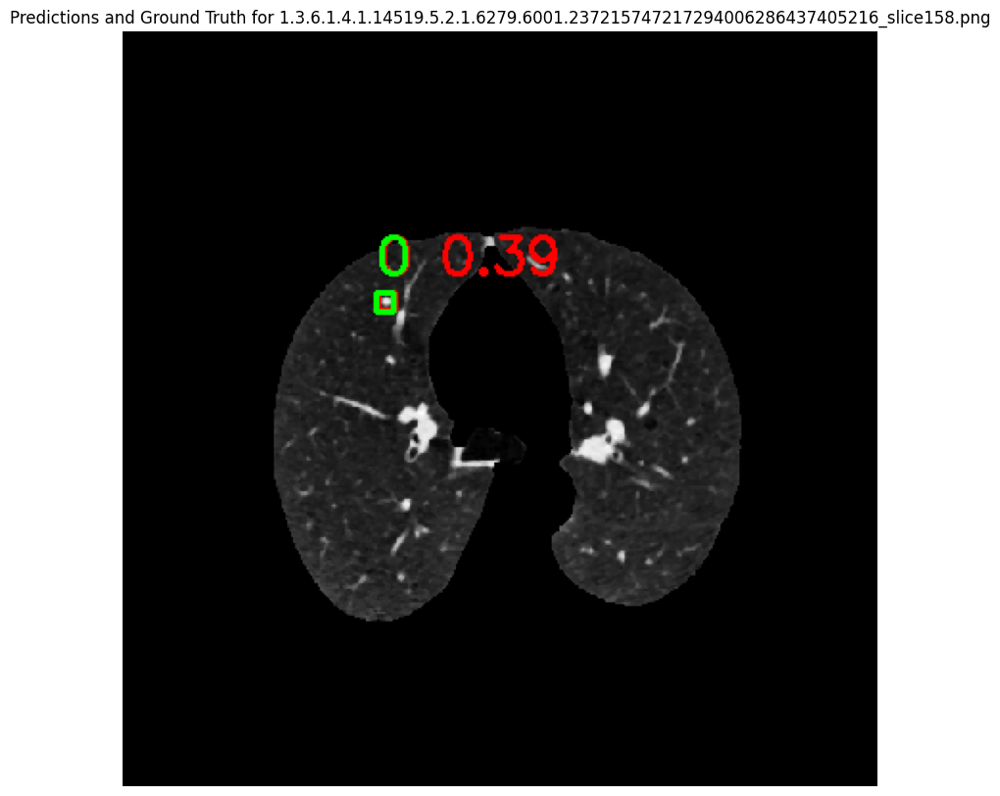


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.229860476925100292554329427970_slice74.png: 512x512 1 nodule, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 78.1012, 115.4875,  85.3256, 123.0880]], device='cuda:0')


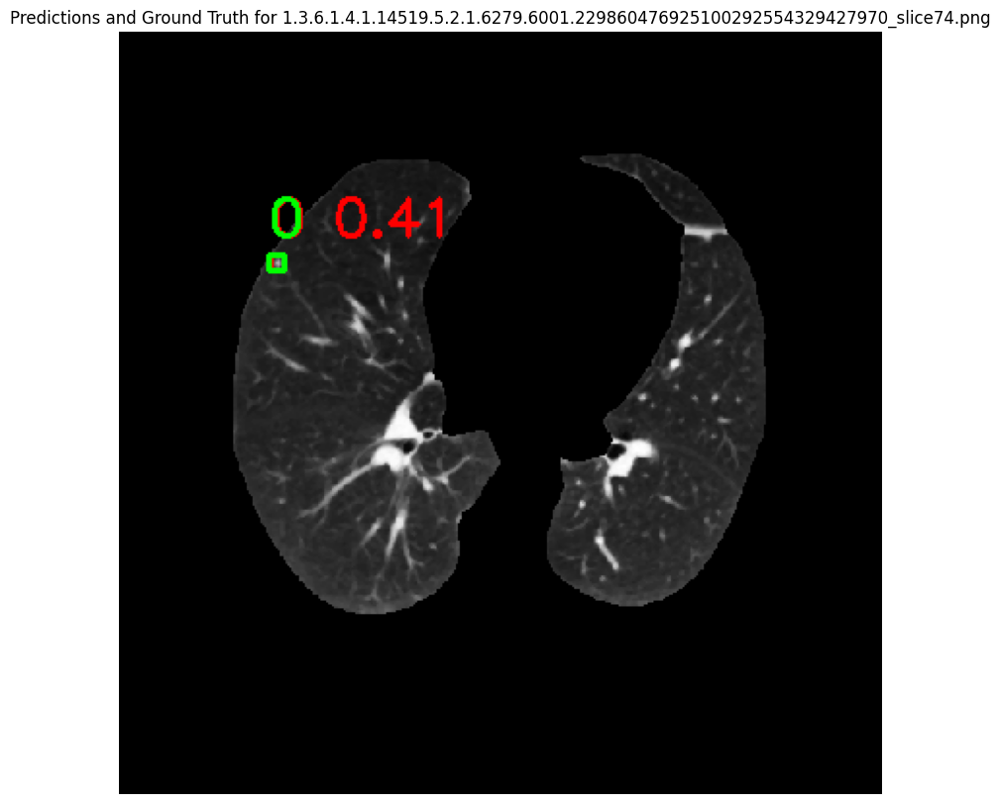


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.268030488196493755113553009785_slice341.png: 512x512 1 nodule, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[286.5139, 255.8858, 298.3891, 268.6649]], device='cuda:0')


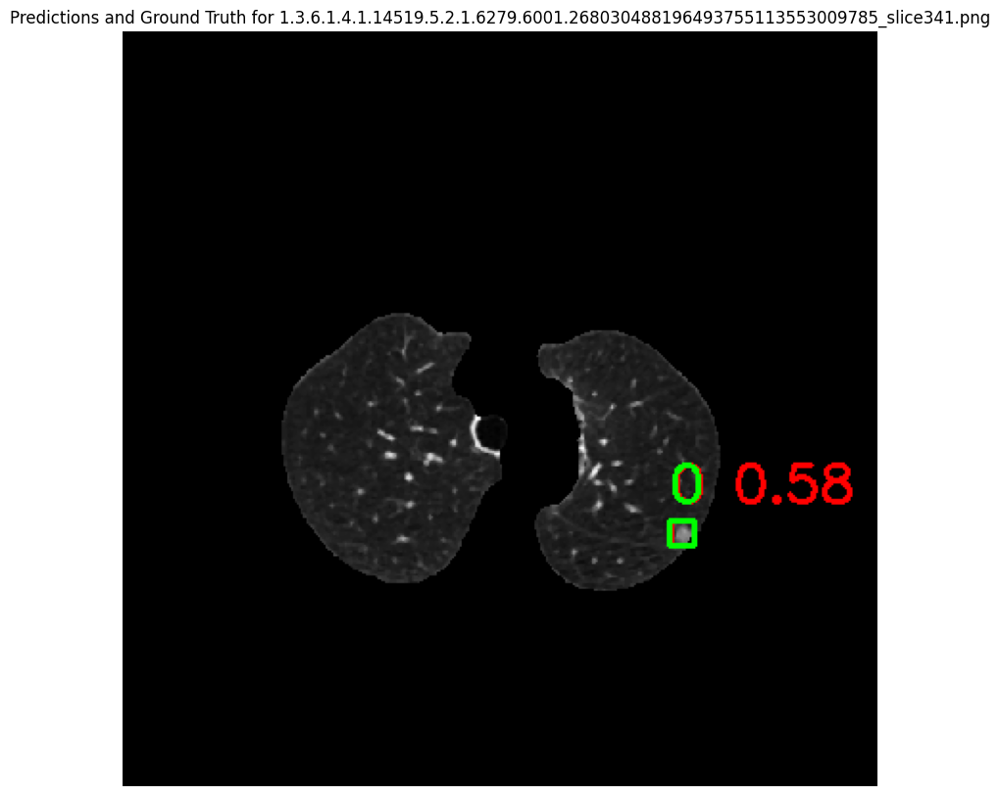


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.114914167428485563471327801935_slice381.png: 512x512 1 nodule, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[103.9187, 225.5573, 114.0508, 235.1500]], device='cuda:0')


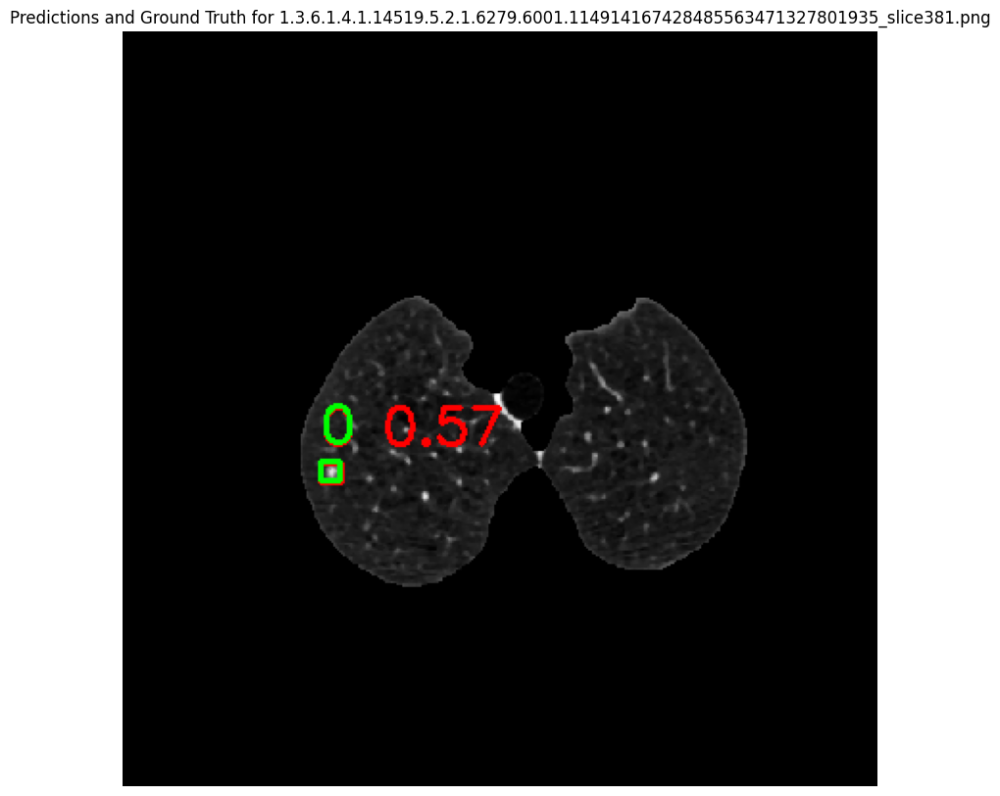


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.312127933722985204808706697221_slice88.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 59.8014, 193.8090,  69.4100, 202.9921]], device='cuda:0')


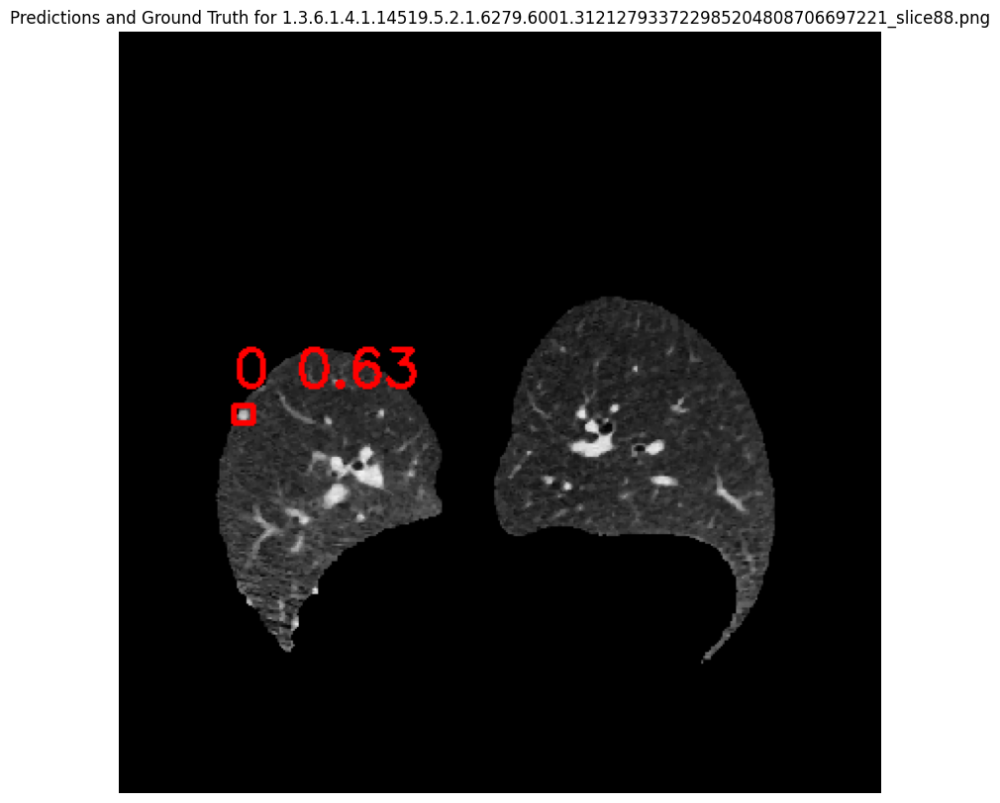


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.112767175295249119452142211437_slice64.png: 512x512 (no detections), 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


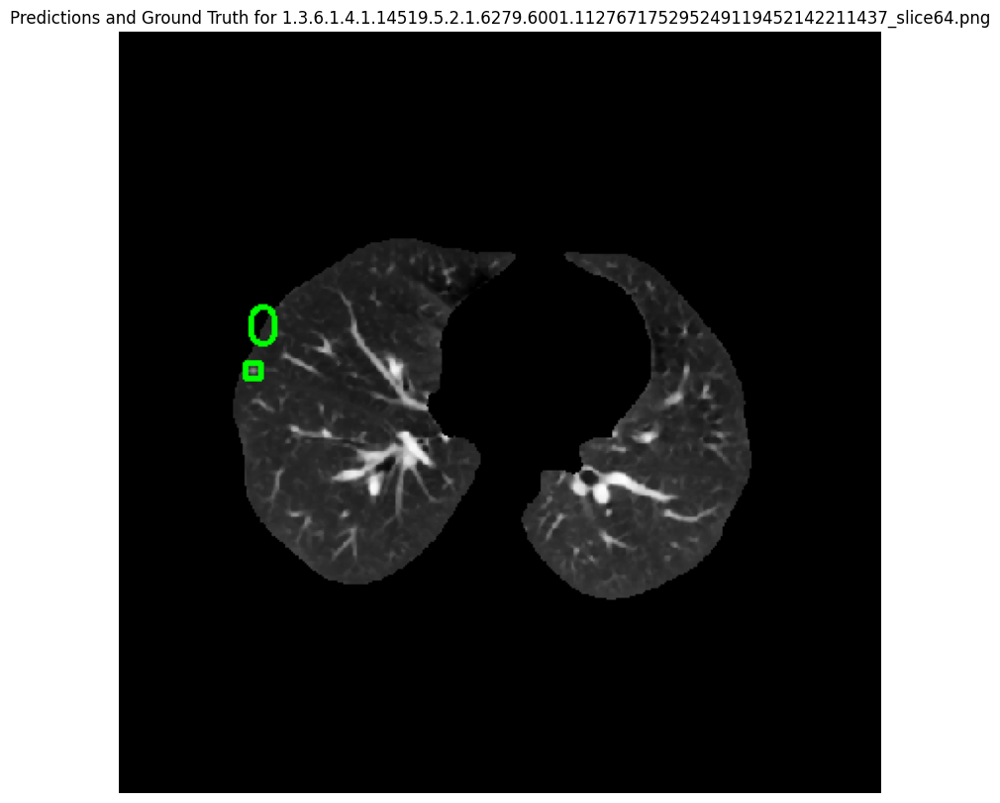


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.195557219224169985110295082004_slice195.png: 512x512 2 nodules, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[303.0503, 197.8090, 312.9314, 207.4005]], device='cuda:0')
box.xyxy: tensor([[303.9772, 197.0921, 315.0610, 207.7871]], device='cuda:0')


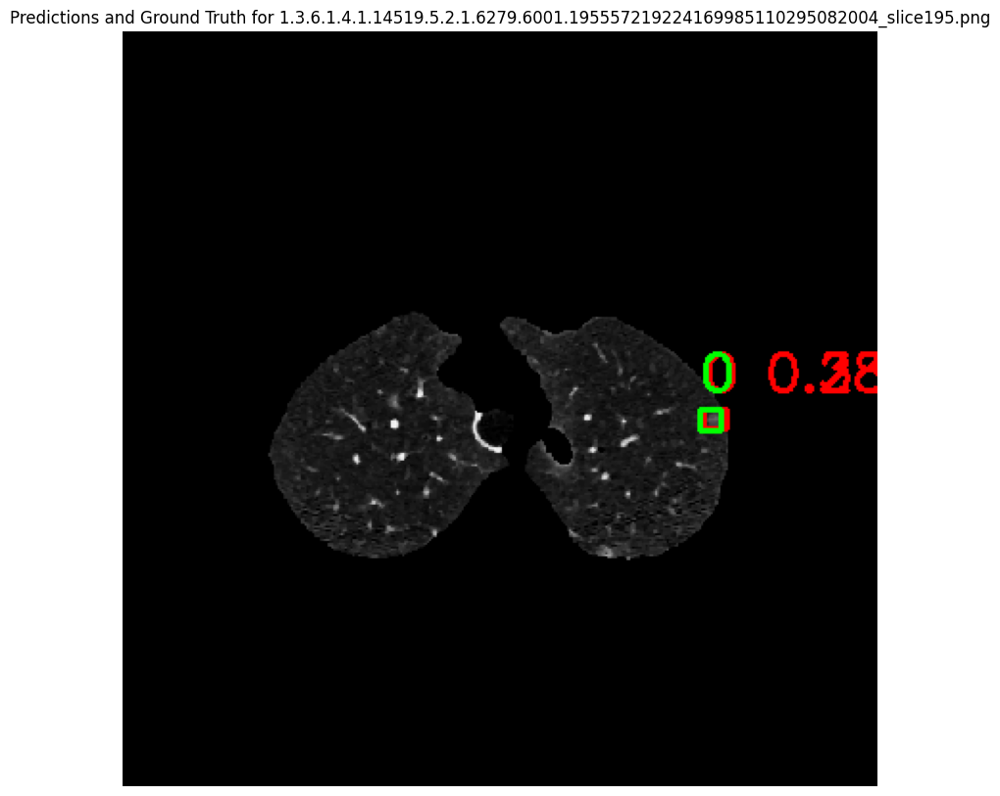


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.215785045378334625097907422785_slice223.png: 512x512 (no detections), 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


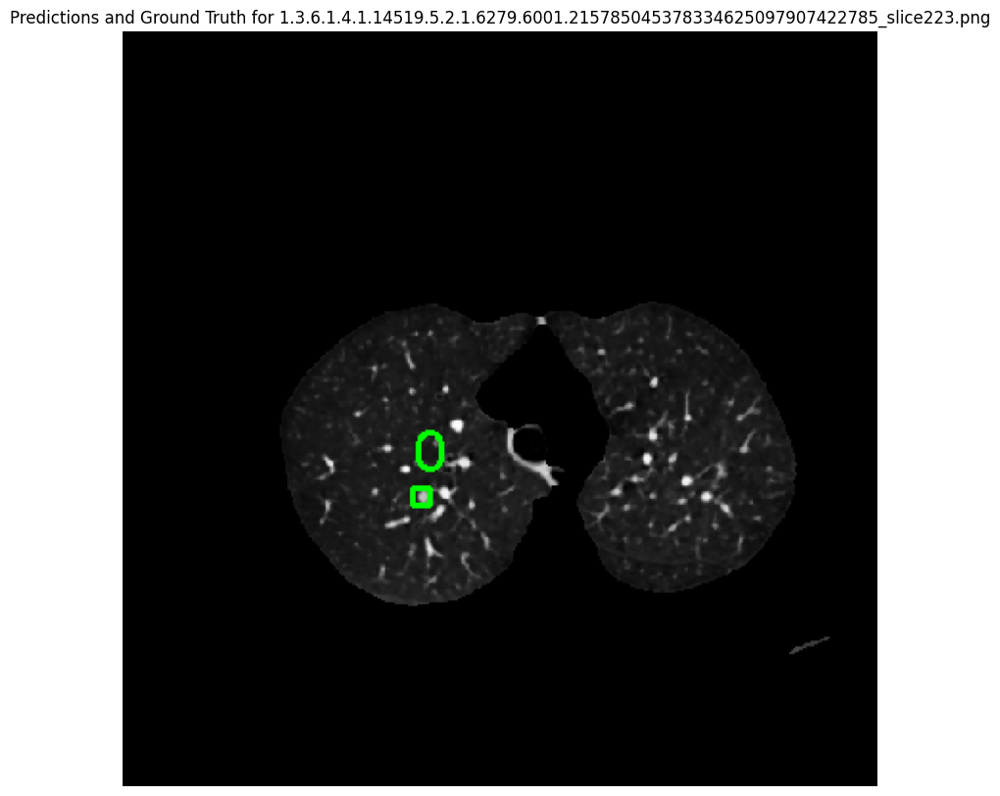


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.194632613233275988184244485809_slice107.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[128.4706, 175.8782, 155.3519, 200.9203]], device='cuda:0')


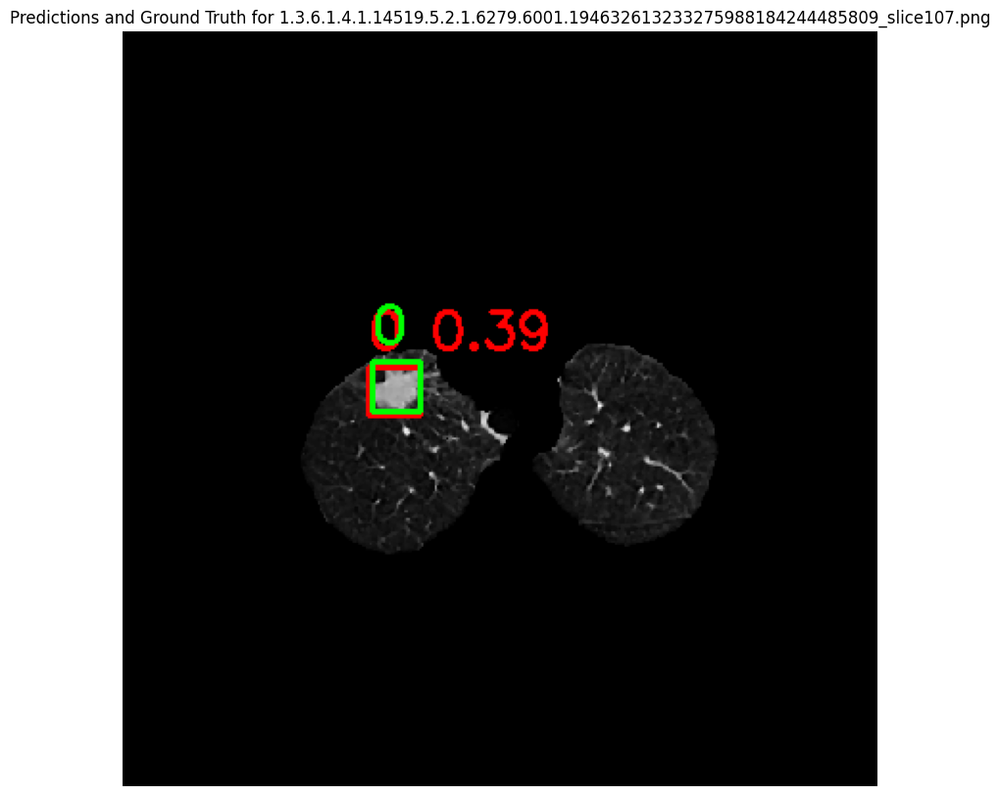


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.771741891125176943862272696845_slice133.png: 512x512 (no detections), 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


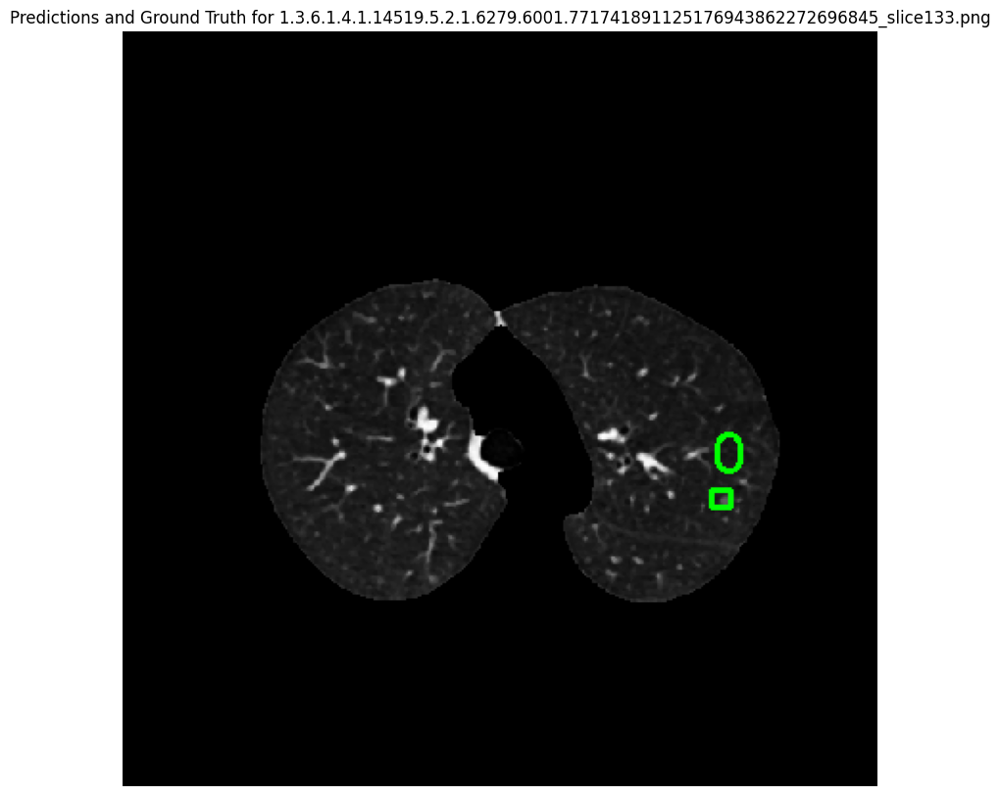


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.195557219224169985110295082004_slice120.png: 512x512 (no detections), 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 512)


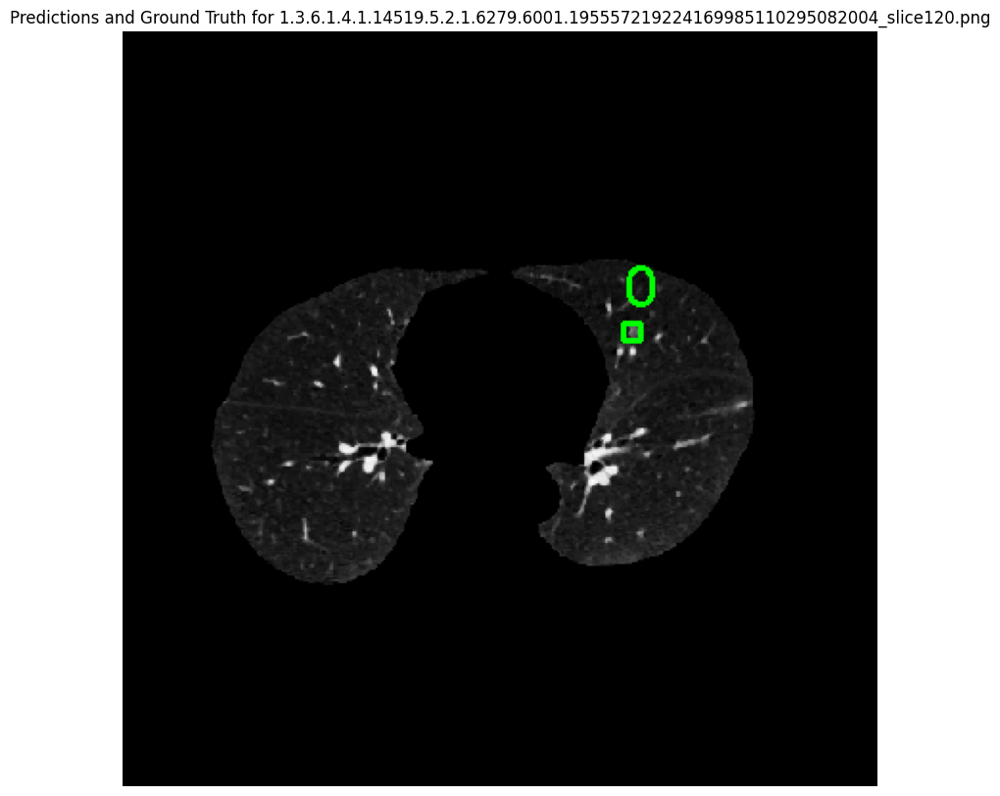


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.112767175295249119452142211437_slice90.png: 512x512 4 nodules, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[270.4061, 202.8350, 279.5643, 211.3723]], device='cuda:0')
box.xyxy: tensor([[243.3370, 248.0833, 251.4005, 256.2101]], device='cuda:0')
box.xyxy: tensor([[242.0604, 248.2343, 249.9433, 256.4204]], device='cuda:0')
box.xyxy: tensor([[271.6829, 202.5147, 281.0973, 211.6349]], device='cuda:0')


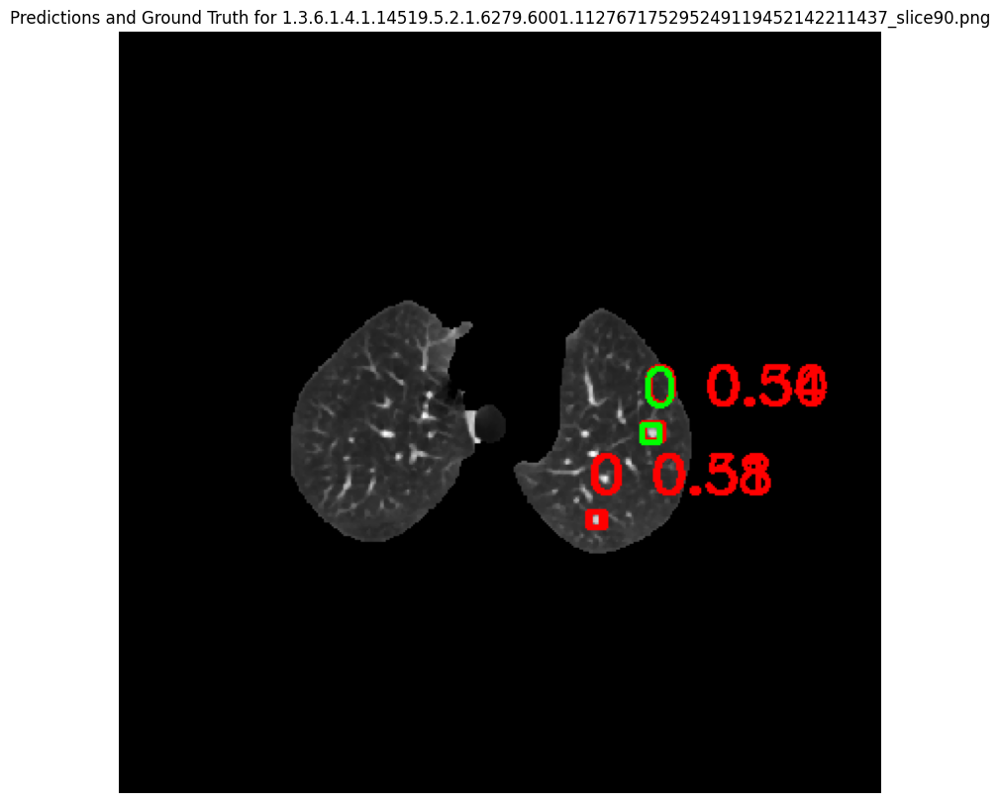


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.229860476925100292554329427970_slice75.png: 512x512 (no detections), 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


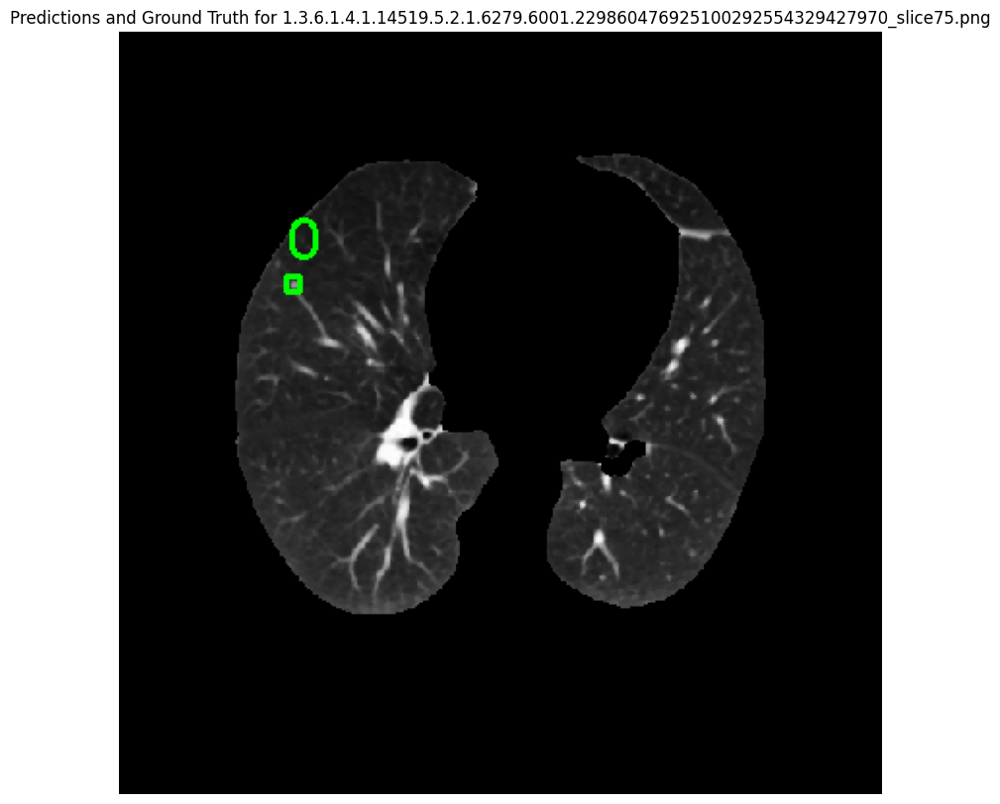


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.124822907934319930841506266464_slice499.png: 512x512 2 nodules, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[236.3981, 246.2932, 244.9432, 255.5801]], device='cuda:0')
box.xyxy: tensor([[234.3948, 246.2587, 243.6045, 255.4541]], device='cuda:0')


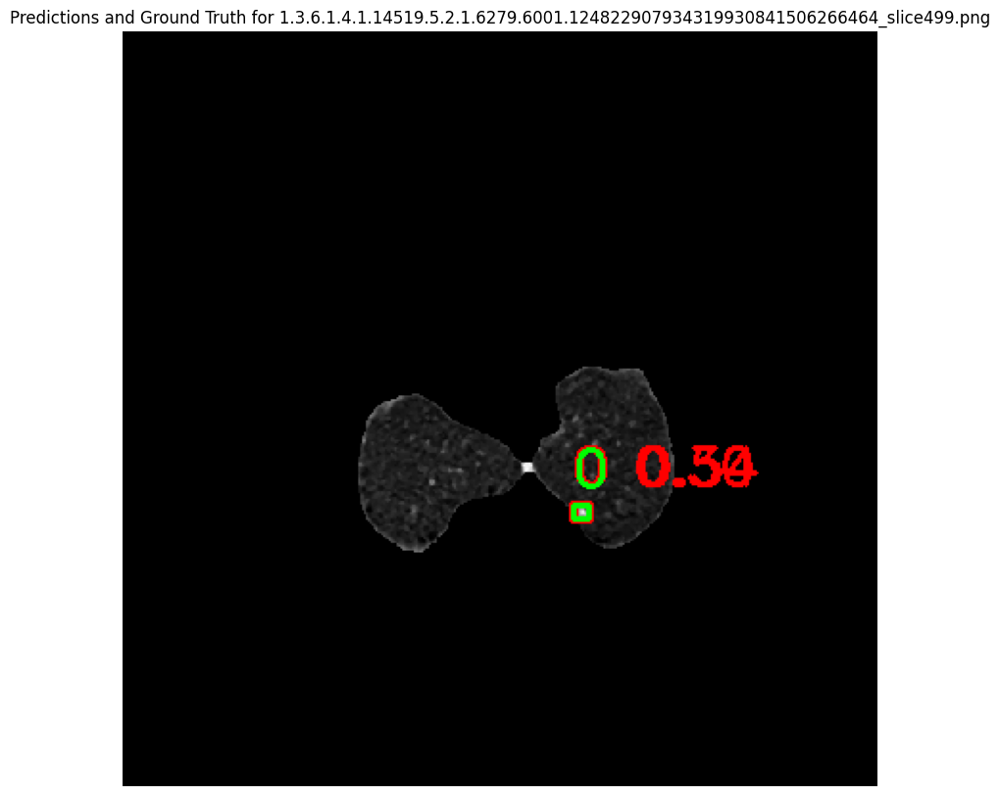


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.199261544234308780356714831537_slice190.png: 512x512 1 nodule, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 91.2808, 150.6272, 107.8493, 166.6864]], device='cuda:0')


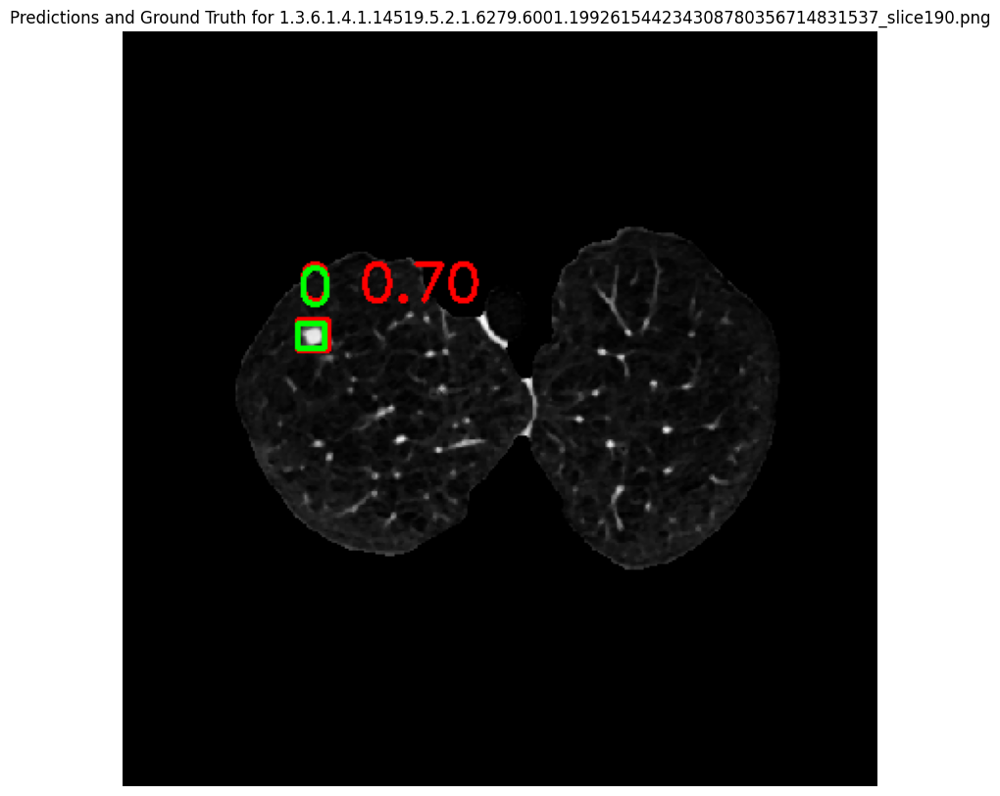


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.230491296081537726468075344411_slice89.png: 512x512 1 nodule, 11.1ms
Speed: 2.7ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[276.7226, 243.0504, 291.7617, 257.2750]], device='cuda:0')


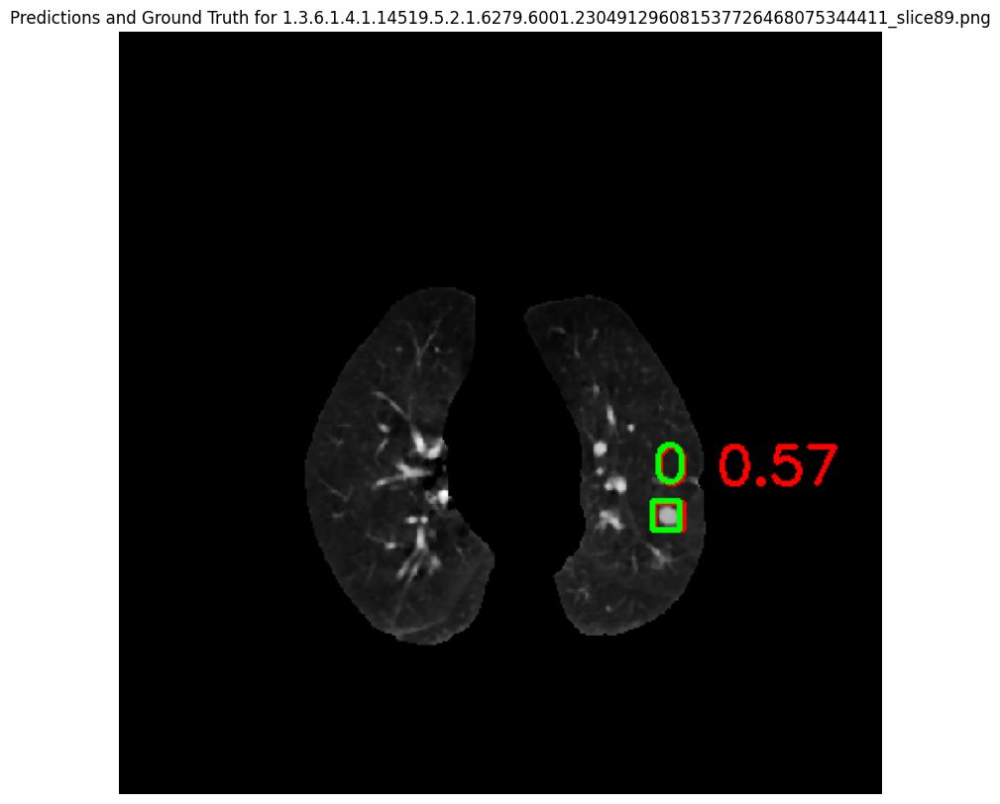


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.311476128731958142981941696518_slice94.png: 512x512 (no detections), 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


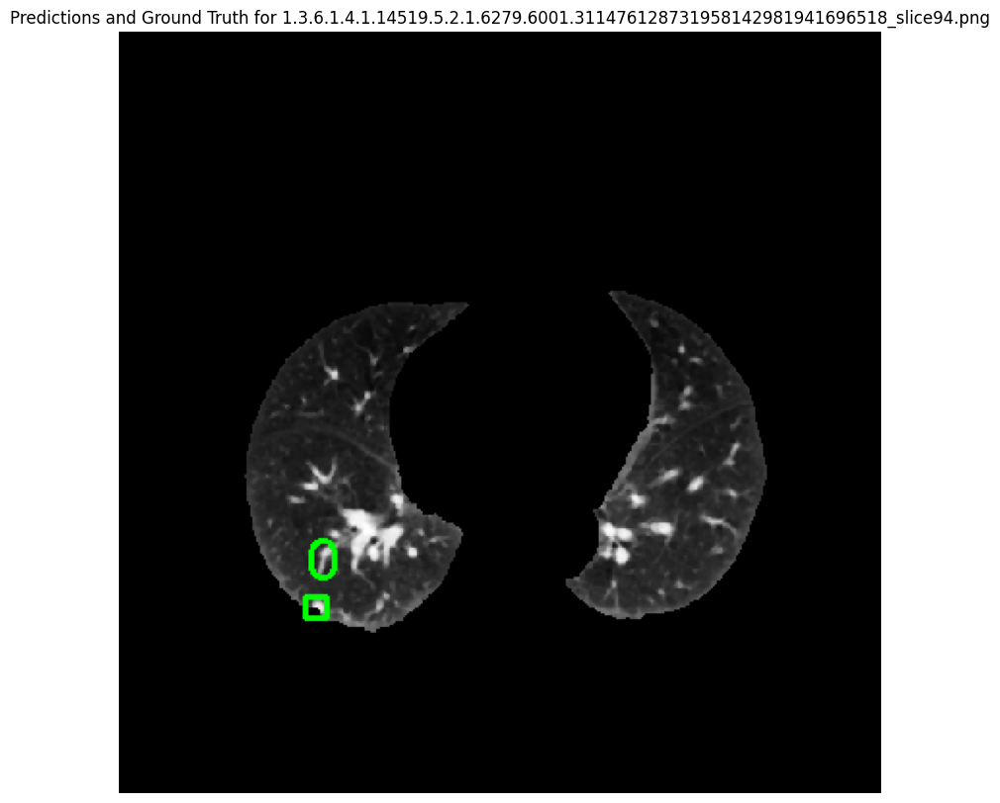


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.312127933722985204808706697221_slice79.png: 512x512 1 nodule, 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 56.8099, 206.0232,  68.2180, 217.7116]], device='cuda:0')


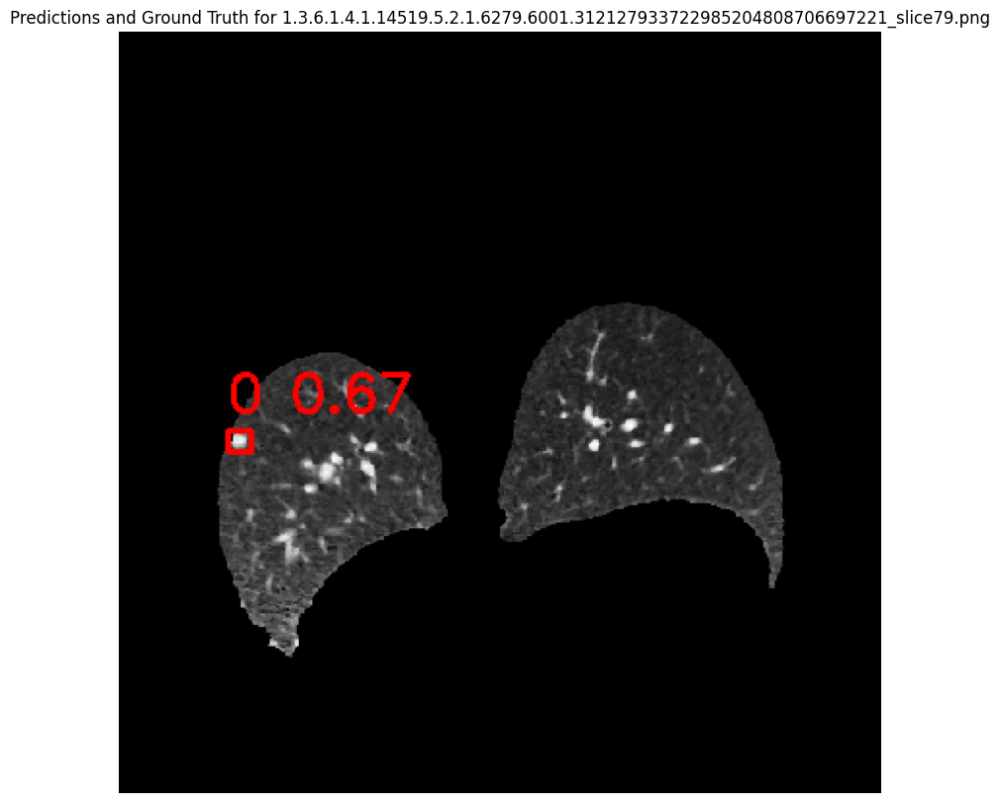


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.217754016294471278921686508169_slice132.png: 512x512 1 nodule, 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 72.4992, 159.3243,  81.5512, 168.3051]], device='cuda:0')


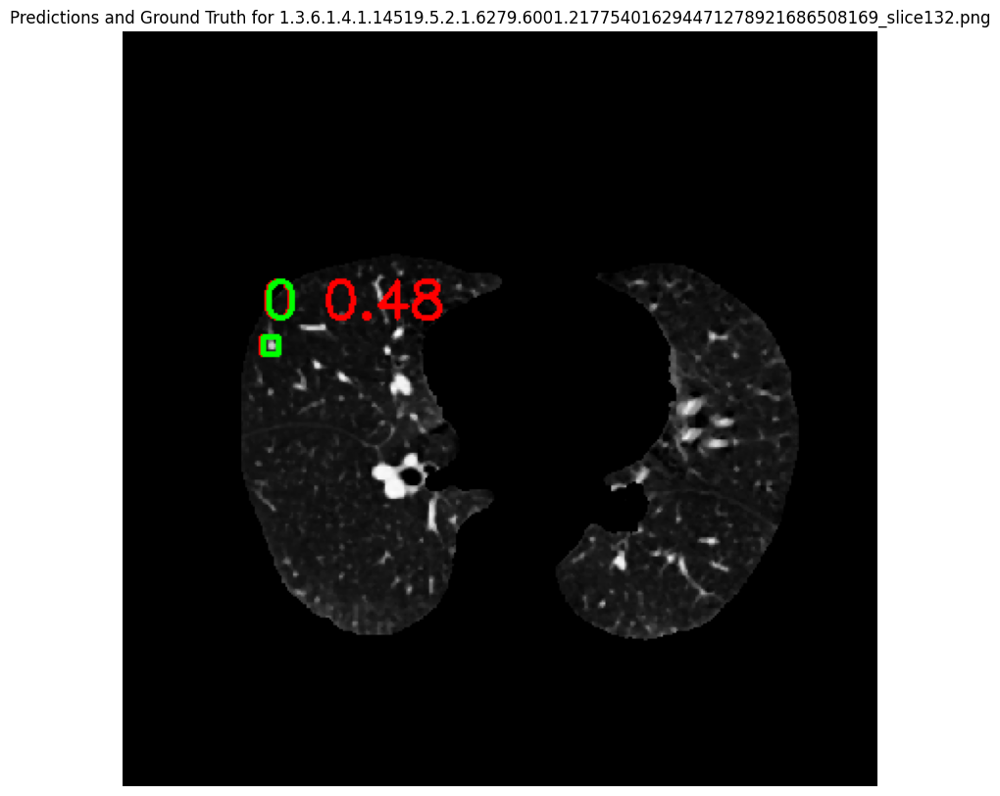


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.173931884906244951746140865701_slice78.png: 512x512 1 nodule, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[270.7210, 271.2045, 293.0797, 295.6473]], device='cuda:0')


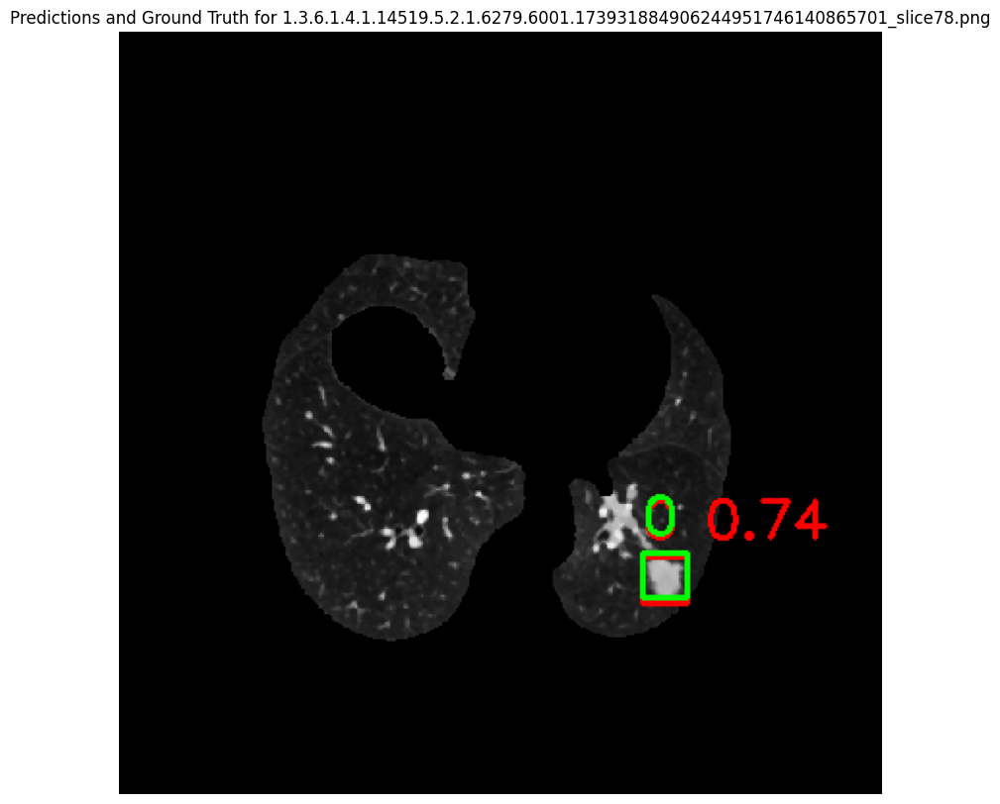


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.440226700369921575481834344455_slice149.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 77.5276, 218.1611,  95.5698, 235.5071]], device='cuda:0')


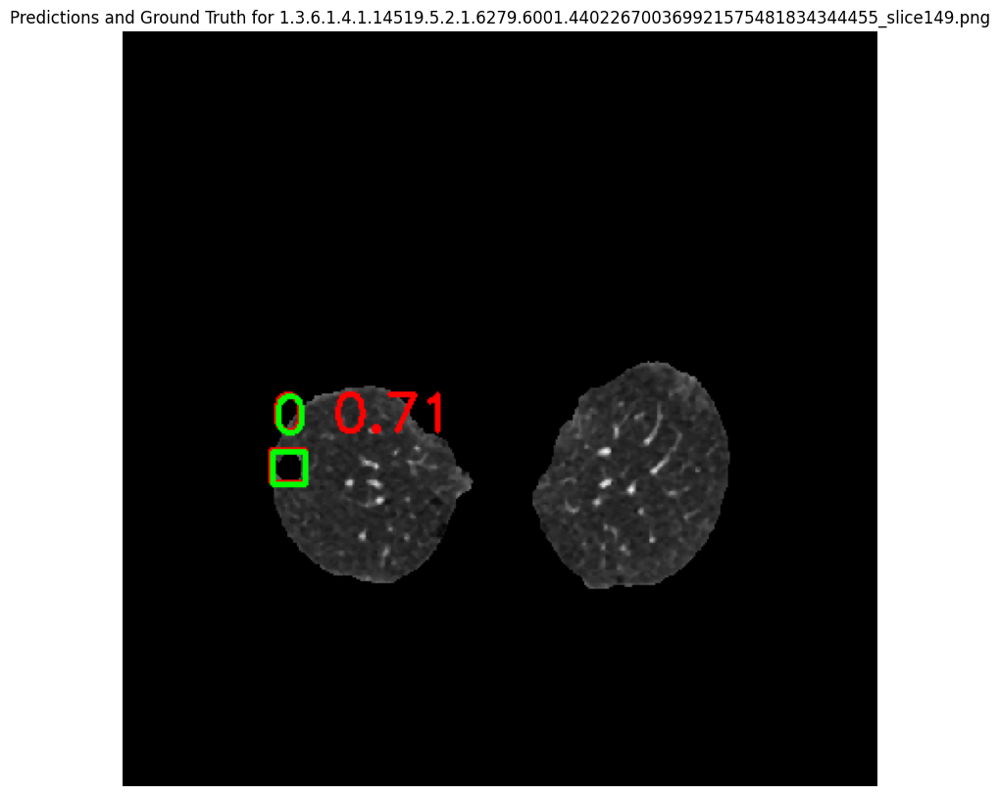


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.170706757615202213033480003264_slice84.png: 512x512 2 nodules, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[163.4430, 161.6531, 177.6841, 175.4644]], device='cuda:0')
box.xyxy: tensor([[ 80.0033, 253.3977,  94.1146, 270.3526]], device='cuda:0')


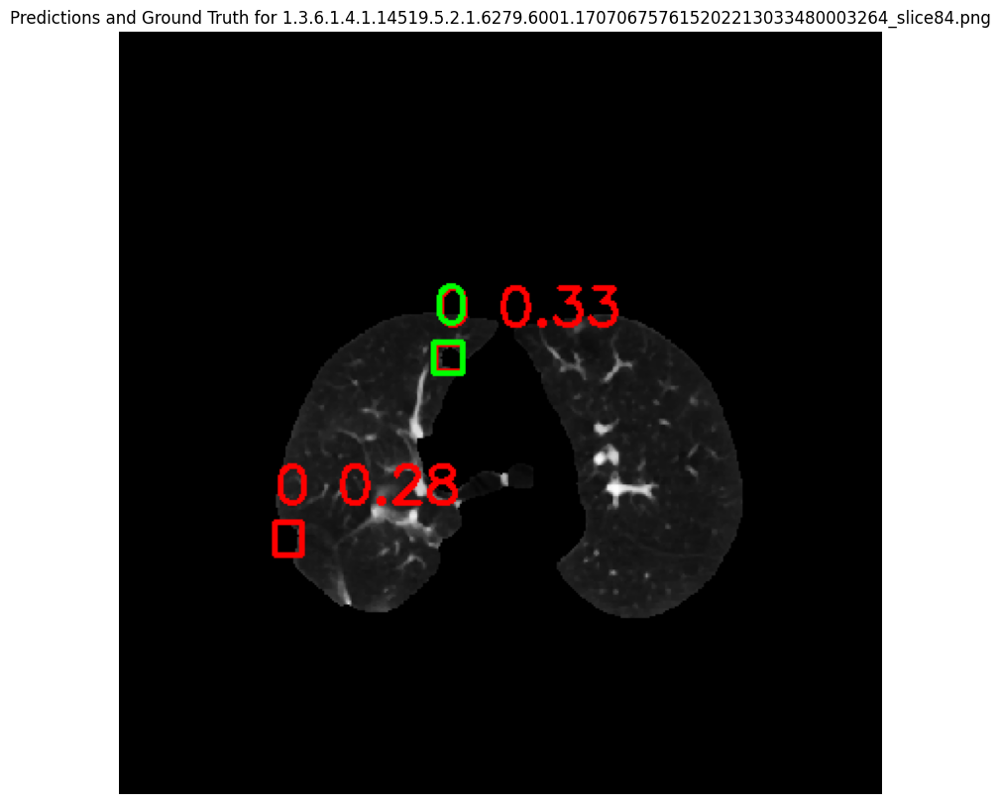


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.112767175295249119452142211437_slice91.png: 512x512 4 nodules, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[271.1154, 202.9610, 279.7307, 211.1967]], device='cuda:0')
box.xyxy: tensor([[243.2212, 247.7160, 252.2261, 256.5103]], device='cuda:0')
box.xyxy: tensor([[242.0266, 247.9236, 250.1377, 256.1891]], device='cuda:0')
box.xyxy: tensor([[272.4162, 202.6392, 281.0582, 211.5474]], device='cuda:0')


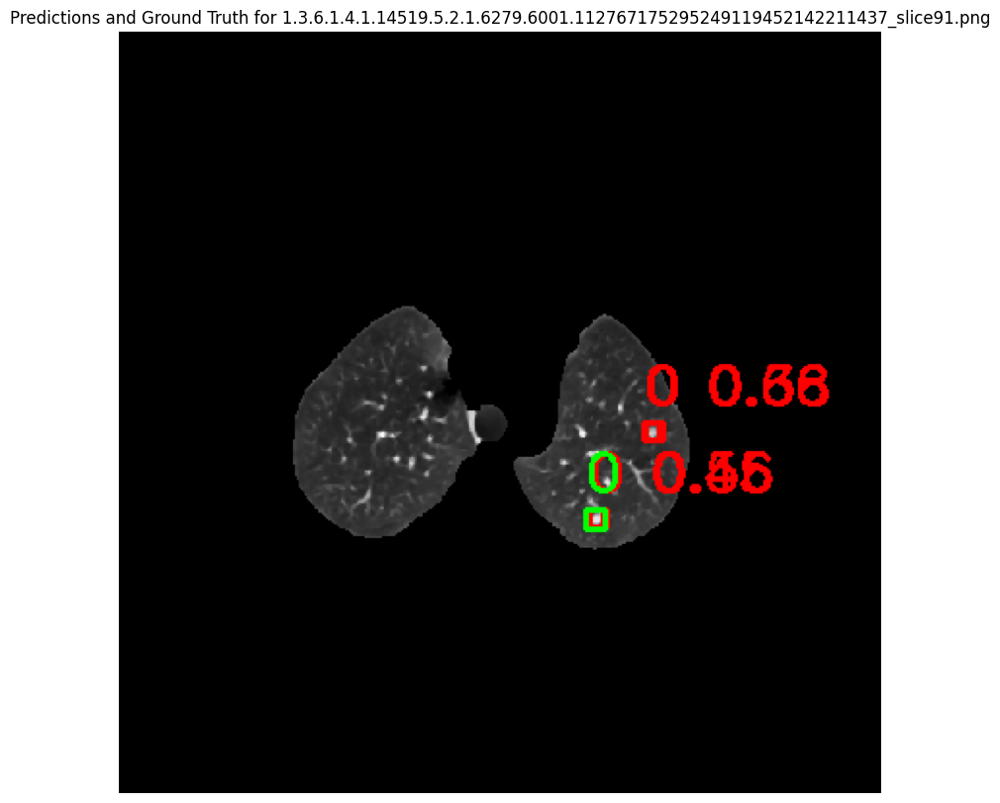


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.150097650621090951325113116280_slice80.png: 512x512 (no detections), 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


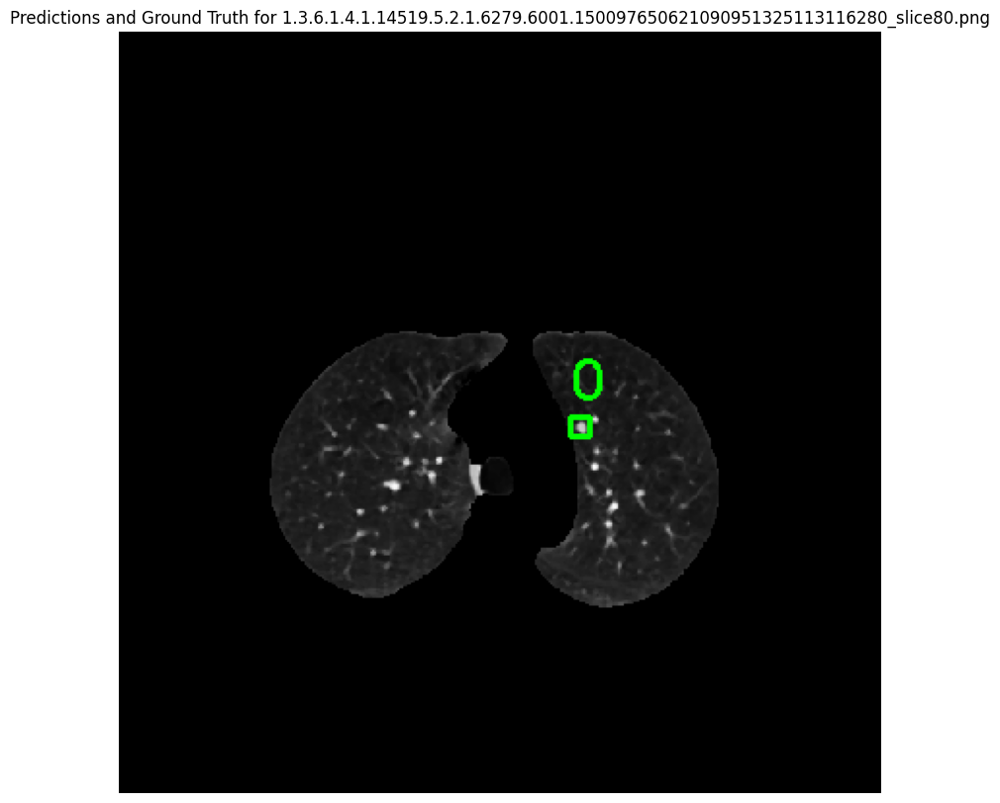


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.312127933722985204808706697221_slice120.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[118.6758, 216.4639, 147.5173, 242.0319]], device='cuda:0')


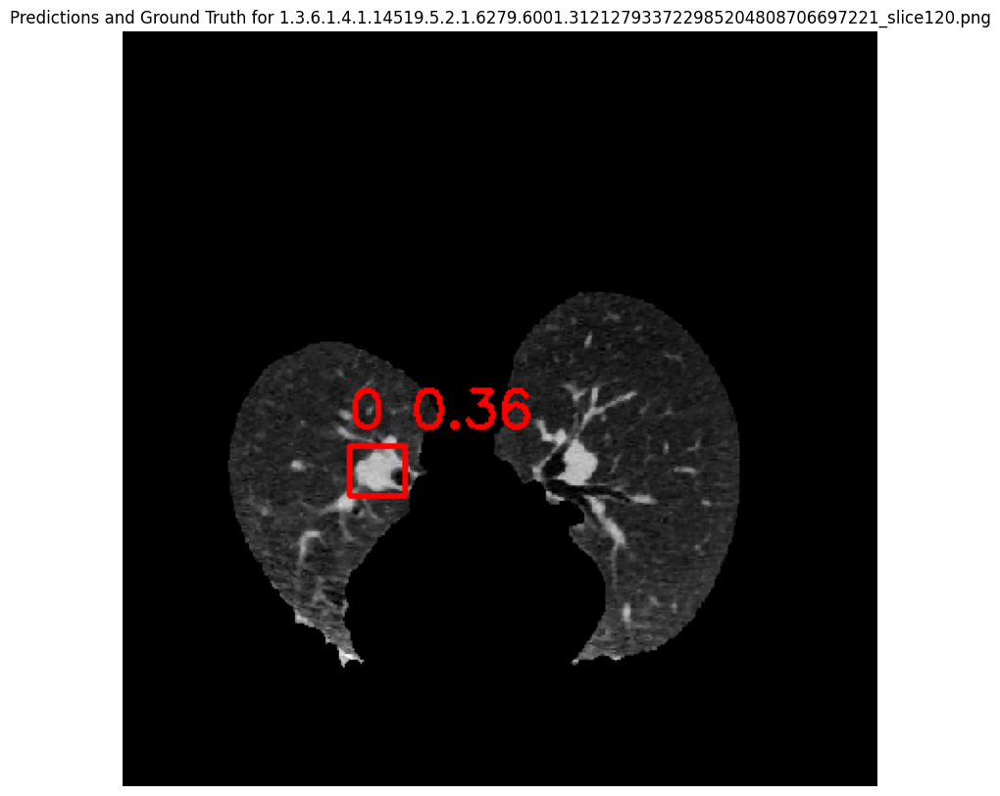


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.195557219224169985110295082004_slice192.png: 512x512 1 nodule, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[128.6261, 150.9936, 139.1262, 161.4728]], device='cuda:0')


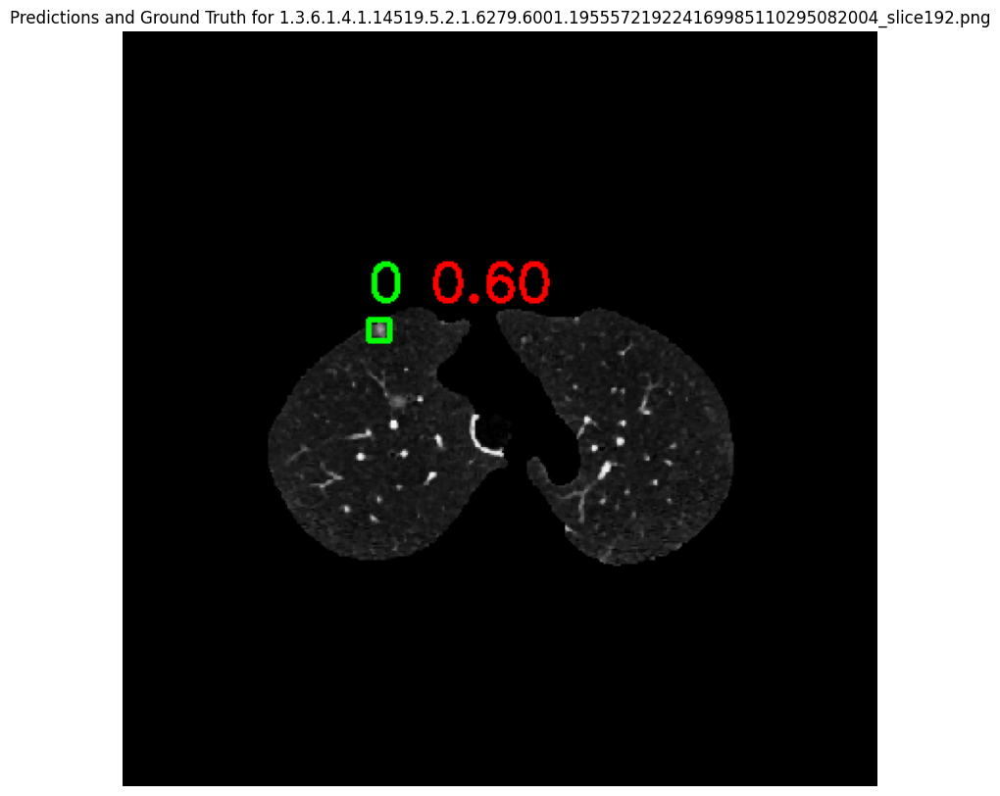


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.387954549120924524005910602207_slice107.png: 512x512 (no detections), 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


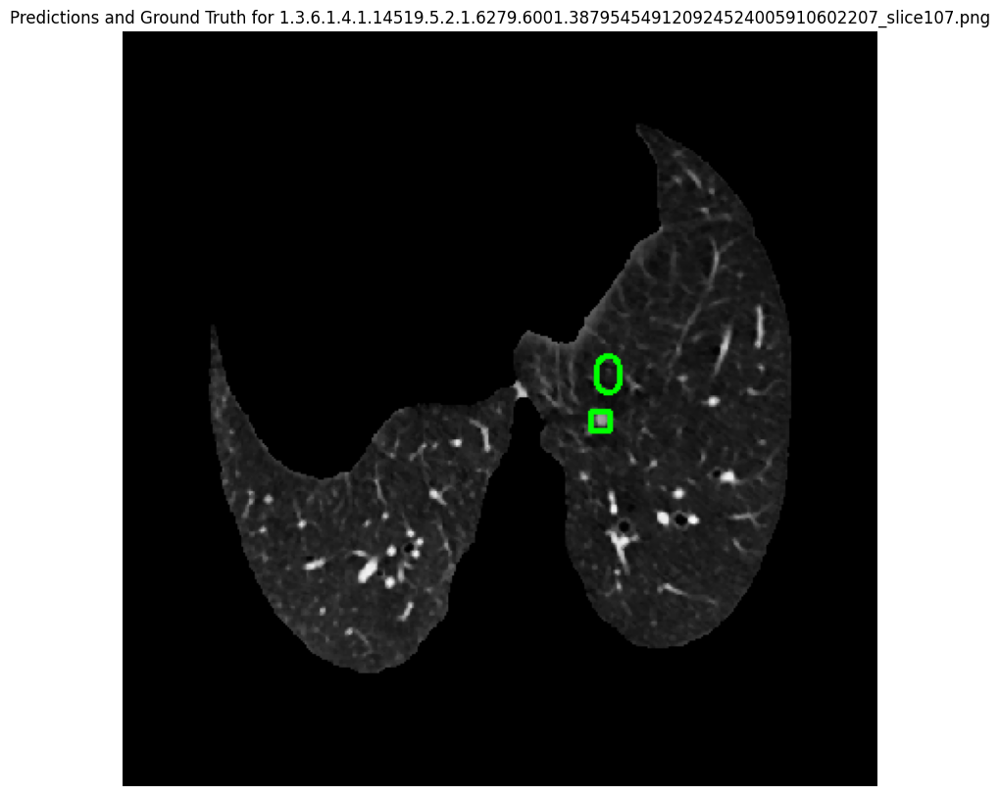


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.229096941293122177107846044795_slice108.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[116.5141, 291.0018, 129.0510, 303.9557]], device='cuda:0')


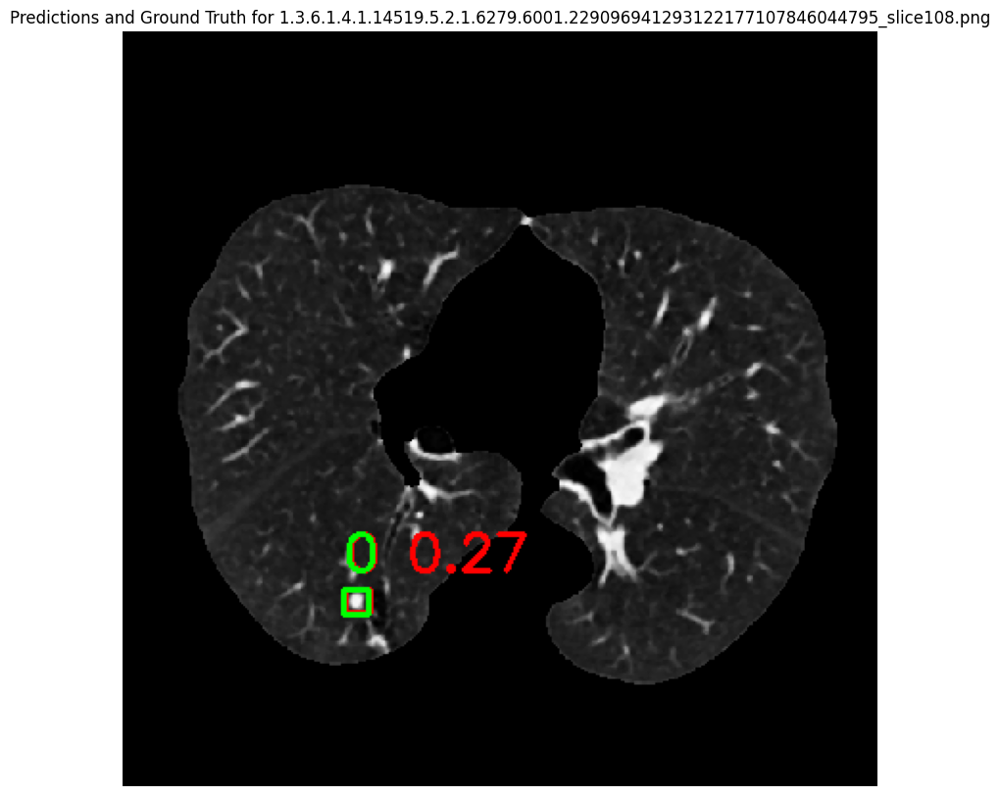


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.300270516469599170290456821227_slice53.png: 512x512 (no detections), 11.1ms
Speed: 2.6ms preprocess, 11.1ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


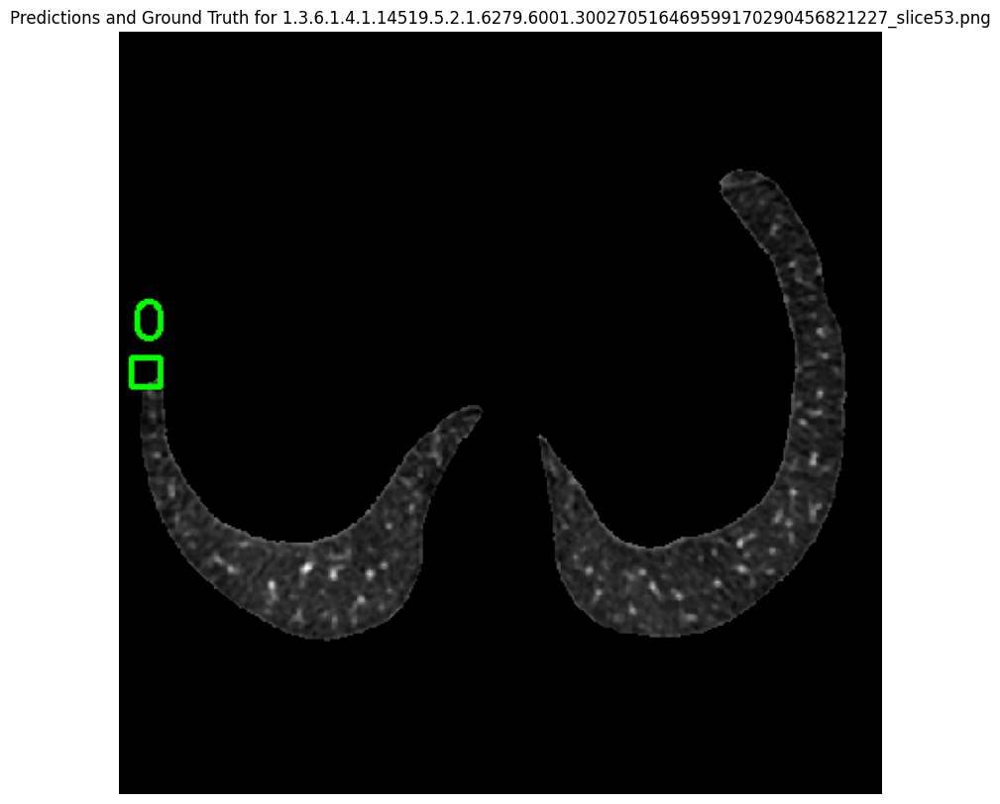


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.174449669706458092793093760291_slice85.png: 512x512 1 nodule, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[300.8886, 212.9943, 320.6057, 231.4821]], device='cuda:0')


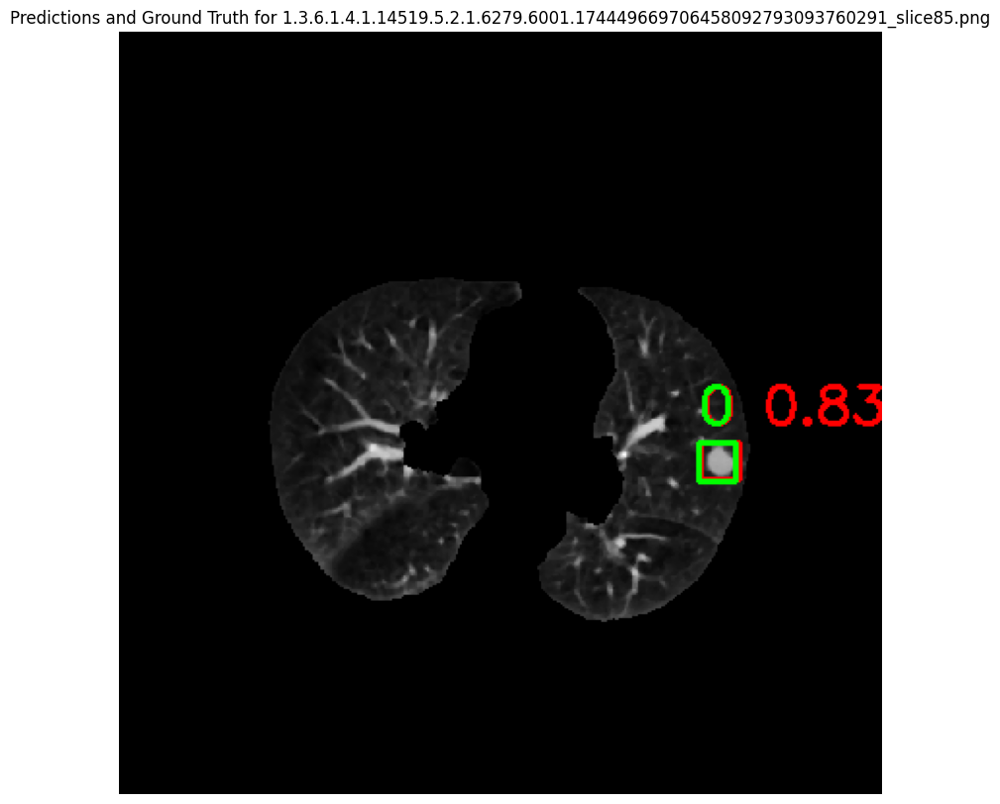


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.229096941293122177107846044795_slice114.png: 512x512 2 nodules, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[102.5743, 306.6840, 124.3965, 324.7910]], device='cuda:0')
box.xyxy: tensor([[108.8822,  99.7284, 120.8968, 110.4240]], device='cuda:0')


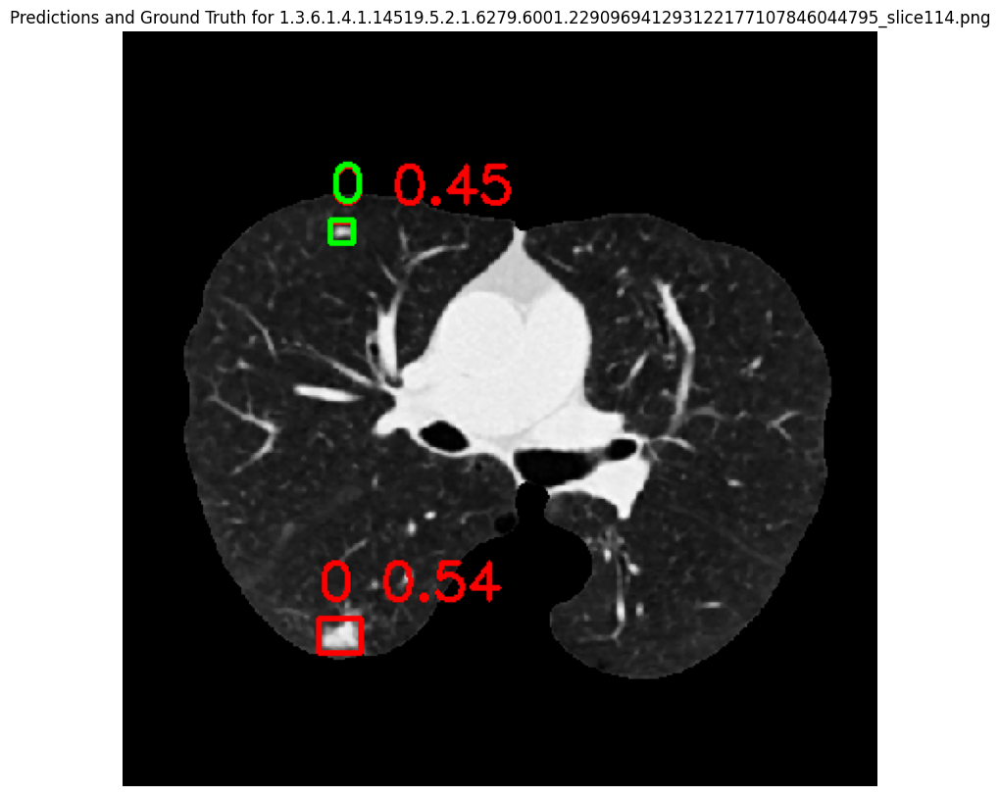


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.300270516469599170290456821227_slice200.png: 512x512 (no detections), 11.1ms
Speed: 1.8ms preprocess, 11.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


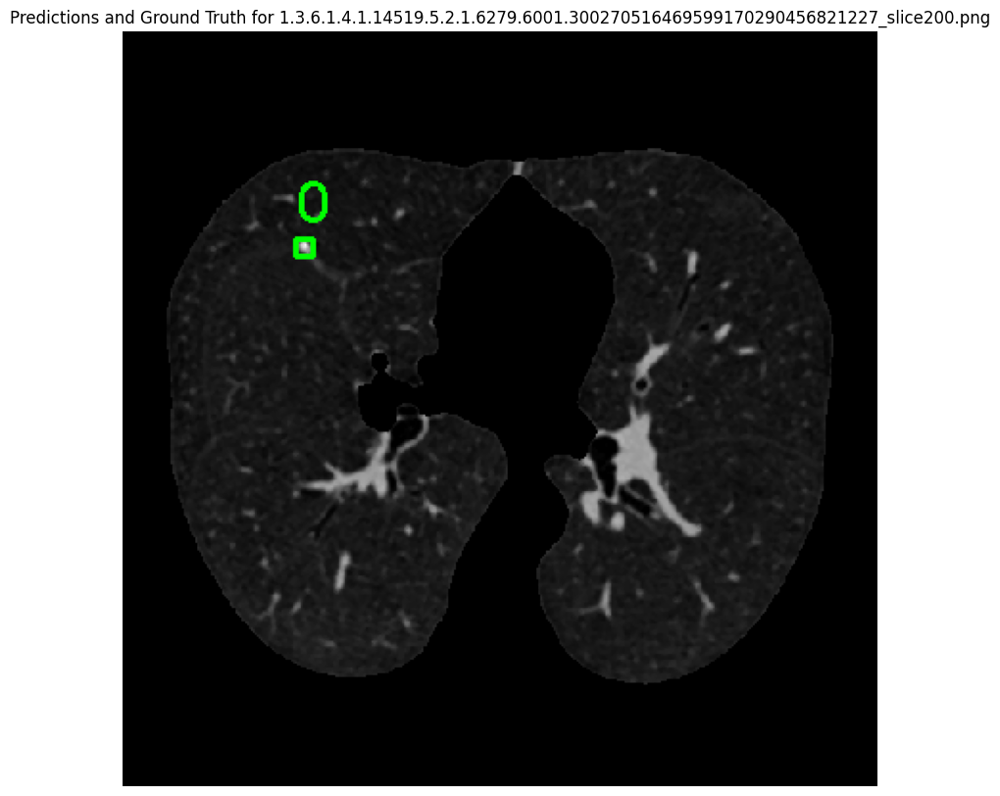


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.187694838527128312070807533473_slice147.png: 512x512 1 nodule, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[309.5837, 127.7990, 330.8611, 150.8497]], device='cuda:0')


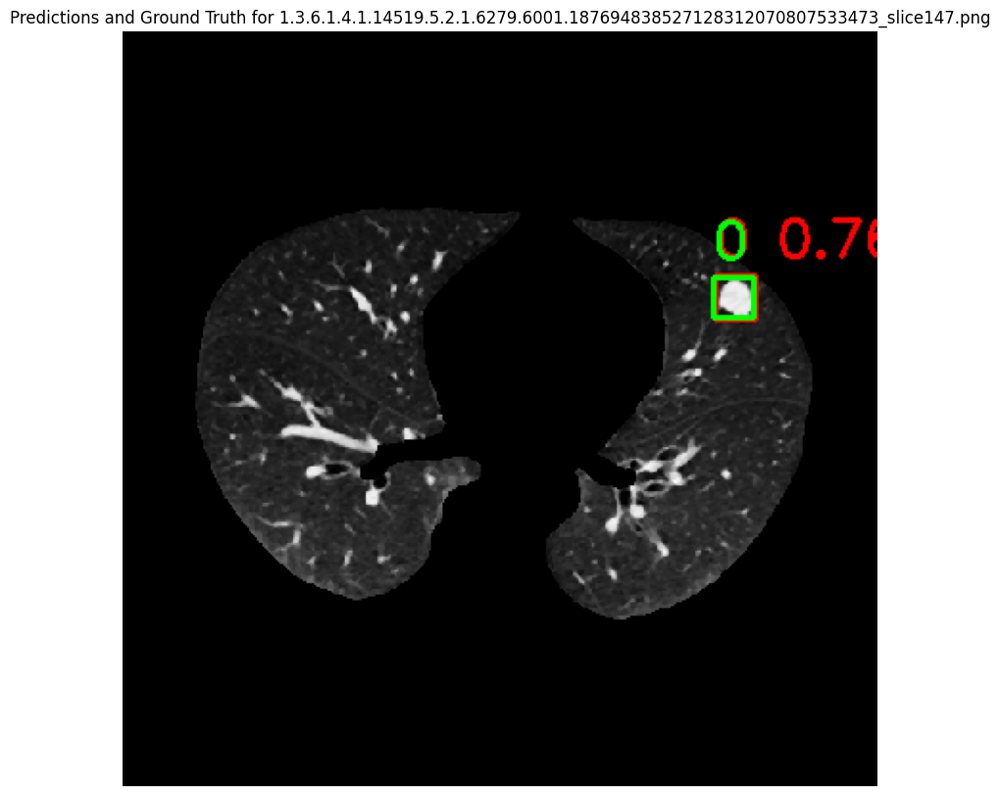


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.134519406153127654901640638633_slice110.png: 512x512 1 nodule, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[ 76.4083, 140.6459,  92.5959, 156.0529]], device='cuda:0')


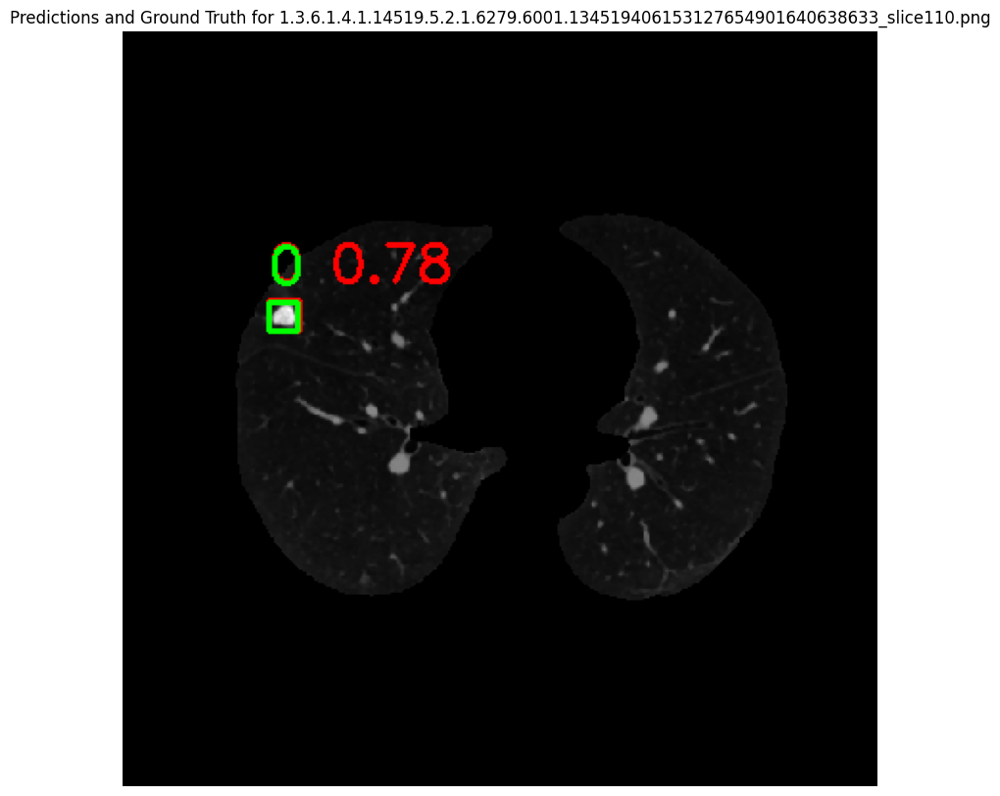


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.765930210026773090100532964804_slice102.png: 512x512 2 nodules, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[117.4626, 245.6027, 145.2686, 271.6622]], device='cuda:0')
box.xyxy: tensor([[348.4312, 197.4280, 355.2793, 204.9115]], device='cuda:0')


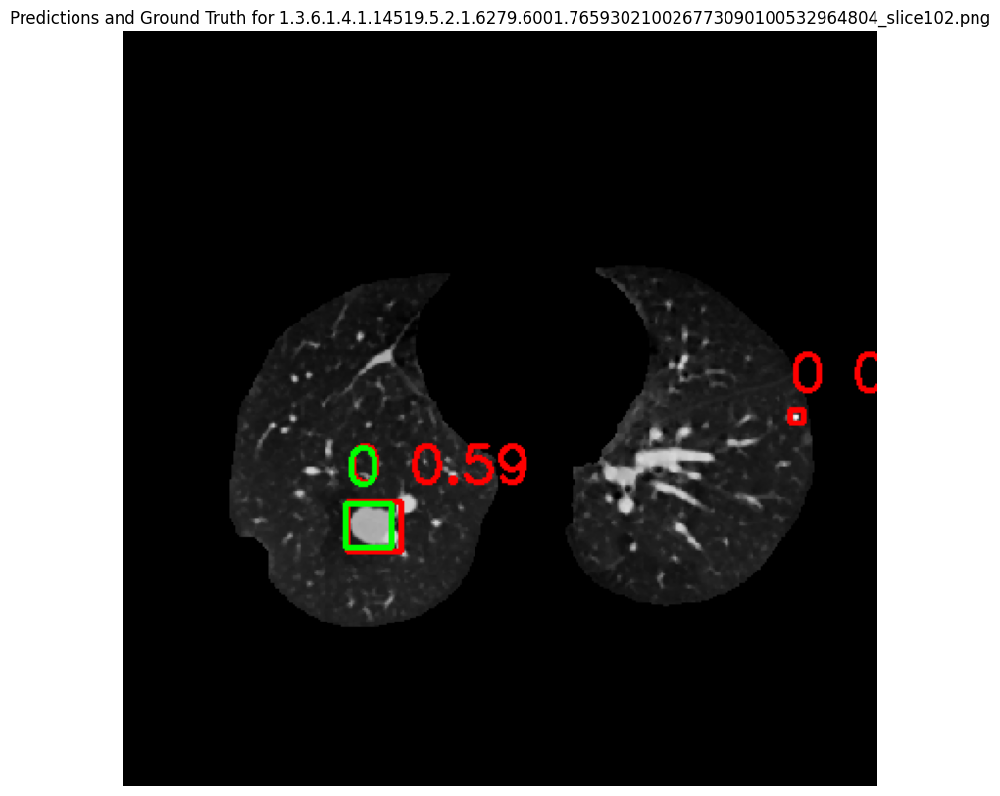


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.195557219224169985110295082004_slice125.png: 512x512 1 nodule, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[293.5727, 140.6722, 304.0447, 151.3176]], device='cuda:0')


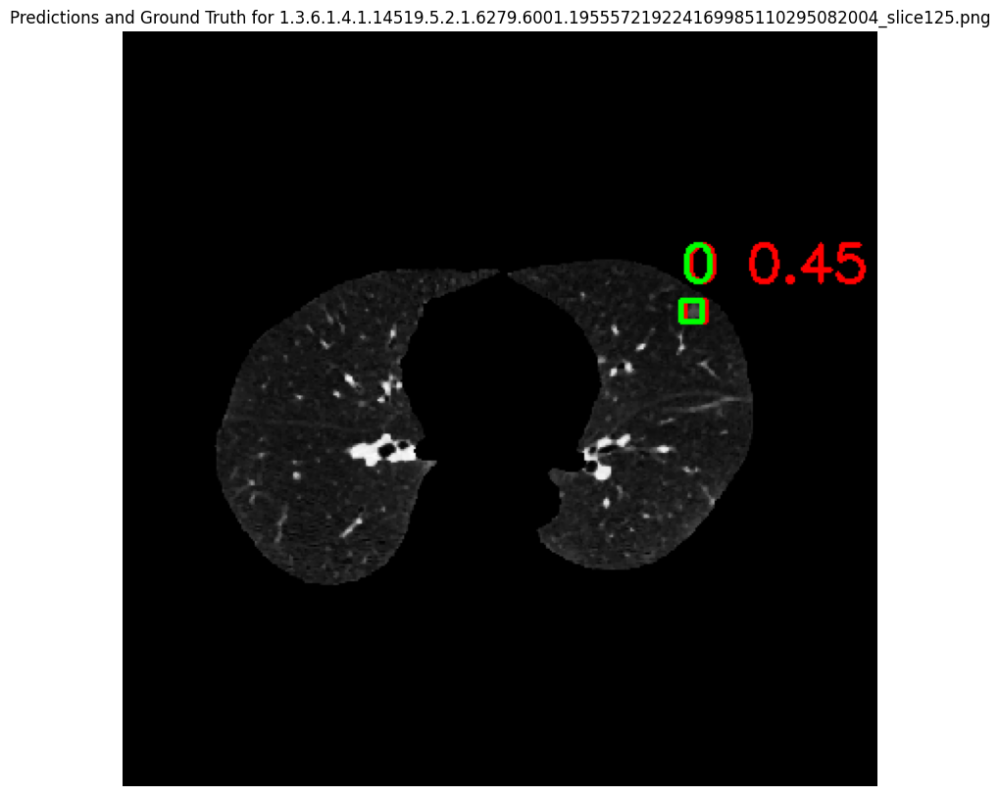


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.193964947698259739624715468431_slice389.png: 512x512 1 nodule, 11.1ms
Speed: 2.5ms preprocess, 11.1ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[221.2310, 265.3687, 229.7641, 272.9722]], device='cuda:0')


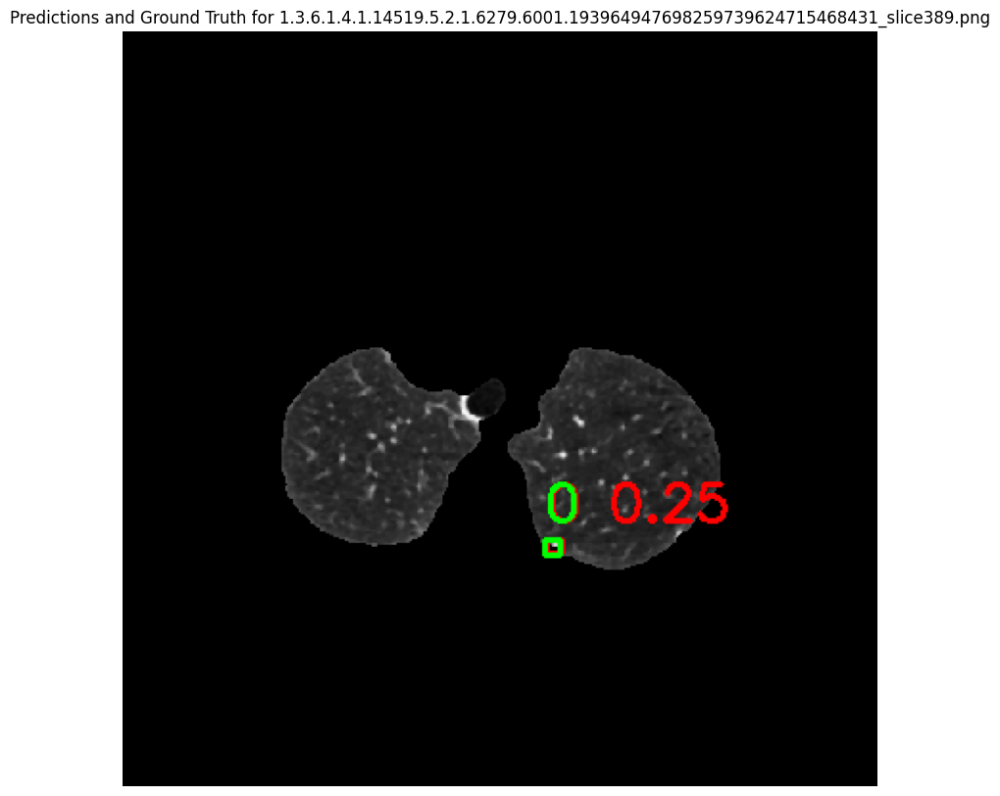


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.196251645377731223510086726530_slice373.png: 512x512 1 nodule, 11.1ms
Speed: 1.9ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)


box.xyxy: tensor([[288.3023, 124.0527, 298.2984, 133.5573]], device='cuda:0')


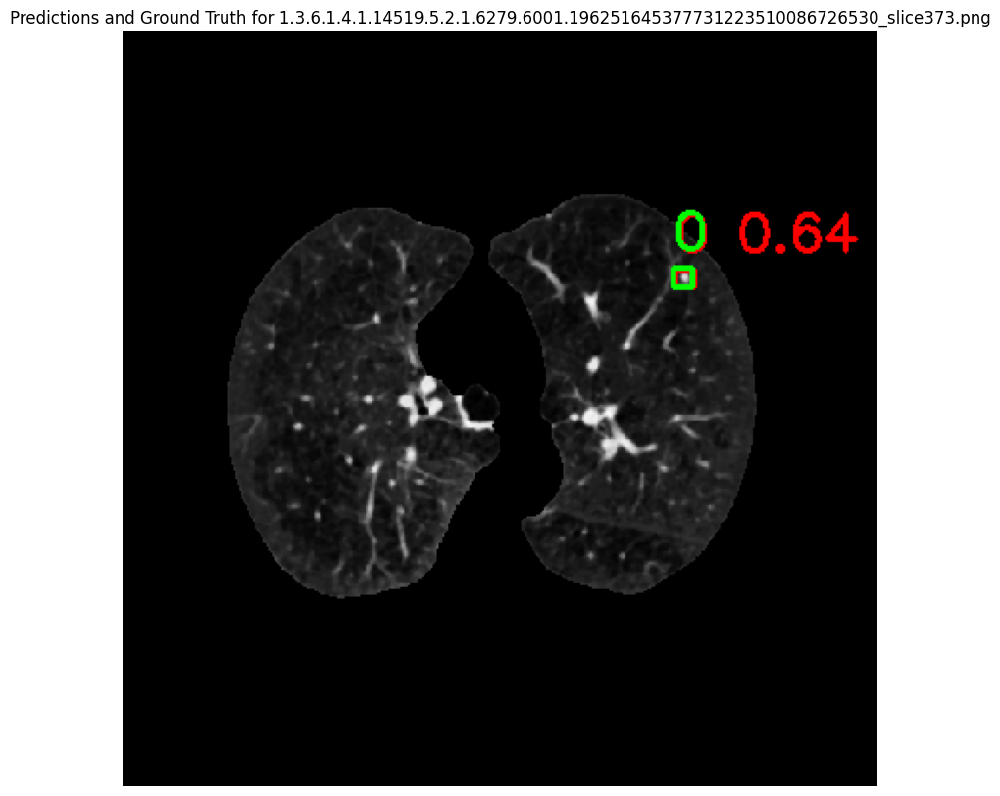


image 1/1 /content/datasets/50percentDATA/test/images/1.3.6.1.4.1.14519.5.2.1.6279.6001.167661207884826429102690781600_slice126.png: 512x512 (no detections), 11.2ms
Speed: 2.2ms preprocess, 11.2ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


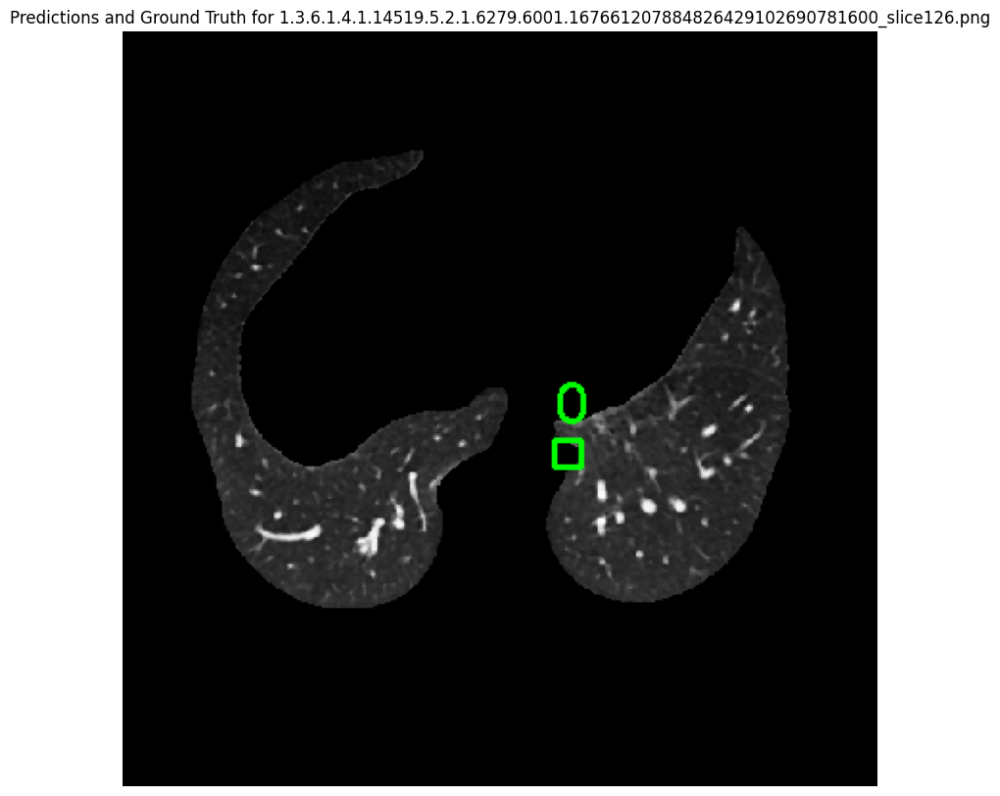

In [33]:
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO

def draw_ground_truth_labels(image, label_path):
    """
    Draw ground truth labels on the image.

    :param image: The image to draw labels on.
    :param label_path: The path to the label file.
    """
    # Read the label file
    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Image dimensions
    height, width = image.shape[:2]

    # Loop through each line in the label file
    for line in lines:
        if not line.strip():
            continue  # Skip empty lines
        parts = line.strip().split()
        class_id, cx, cy, w, h = map(float, parts)

        # Convert center x, center y, width, height to top-left and bottom-right coordinates
        x1 = int((cx - w / 2) * width)
        y1 = int((cy - h / 2) * height)
        x2 = int((cx + w / 2) * width)
        y2 = int((cy + h / 2) * height)

        # Draw the rectangle for ground truth
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        # Optionally, draw the class id or any other label information if needed
        cv2.putText(image, str(int(class_id)), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

# Load the trained YOLOv8 model
model = YOLO('/content/datasets/runs/detect/train3/weights/best.pt')

# Path to the directory containing test images and labels
test_images_dir = '/content/datasets/50percentDATA/test/images/'
test_labels_dir = '/content/datasets/50percentDATA/test/labels/'

# List all image files in the test directory
test_images = list(Path(test_images_dir).glob('*.png'))  # Adjust the file extension if necessary

# Counter to limit the number of images processed
count = 0

# Loop through each image in the directory
for img_path in test_images:
    # Convert the image path to string
    img_path_str = str(img_path)

    # Get the corresponding label file path
    label_path = Path(test_labels_dir) / f"{img_path.stem}.txt"

    # Check if the label file exists and is not empty
    if label_path.exists() and label_path.stat().st_size > 0:
        count += 1
        if count > 300:
            break

        # Make predictions
        results = model.predict(img_path_str, save=False)  # save=False to avoid saving the prediction image automatically

        # Extract the first result (assuming only one image is being processed at a time)
        result = results[0]

        # Load the image using OpenCV
        image = cv2.imread(img_path_str, cv2.IMREAD_UNCHANGED)  # Load the image without changing the format

        # Draw bounding boxes from the model's predictions on the image
        for box in result.boxes:
            # Debug print to check the structure of box.xyxy
            print('box.xyxy:', box.xyxy)

            # Ensure box.xyxy is a flat list of coordinates
            coords = box.xyxy.tolist()[0] if isinstance(box.xyxy.tolist()[0], list) else box.xyxy.tolist()

            x1, y1, x2, y2 = map(int, coords)
            confidence = box.conf.item()
            label = f'{int(box.cls.item())} {confidence:.2f}'

            # Draw the rectangle for predictions
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 0, 255), 2)
            # Put the label near the box
            cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)

        # Draw ground truth labels
        draw_ground_truth_labels(image, label_path)

        # Display the image using matplotlib
        plt.figure(figsize=(10, 10))
        if len(image.shape) == 2:  # If the image is grayscale
            plt.imshow(image, cmap='gray')
        else:  # If the image is RGB/BGR
            plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f'Predictions and Ground Truth for {img_path.name}')
        plt.show()